<a href="https://colab.research.google.com/github/rtegao/Pharma-Sales/blob/master/N02BE_Forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

In the EDA Notebook, I verified that the drug N02BE have the highest sales volume, so now, in this notebook, I'll try to predict the 5 days of future sales from this specific drug.



# Libraries

In [0]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras import optimizers, regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.callbacks import EarlyStopping

# One Feature

## Importing

In [0]:
df_daily = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/salesdaily.csv')
# df_daily = df_daily[['datum','Weekday Name','N02BE']]
# df_daily.columns = ['data','weekday','N02BE']

df_daily = df_daily['N02BE']


# df_houly = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/saleshourly.csv')
# df_monthly = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/salesmonthly.csv')
# df_weekly = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/salesweekly.csv')

## Spliting Data

In [0]:
def dataSplit(df,train_percent,val_percent):
  train_limit = int(round((df.shape[0])*train_percent,0))
  val_limit = int(round((df.shape[0])*(train_percent+val_percent),0))
  
  df_train = df[:train_limit]
  df_val = df[train_limit:val_limit]
  df_test = df[val_limit:]

  print(df_train.shape)
  print(df_val.shape)
  print(df_test.shape)

  return df_train,df_val,df_test

In [34]:
df_train,df_val,df_test = dataSplit(df = df_daily,train_percent = 0.7,val_percent = 0.15)

(1474,)
(316,)
(316,)


## Normalizing Data

In [0]:
def normalizing_data(df_train,df_val,df_test):
  try:
    data_list = [df_train.copy(),df_val.copy(),df_test.copy()]
    min_list = df_train.min(axis=0)
    max_list = df_train.max(axis=0)
    for j in range(len(data_list)):
      for i in range(df_train.shape[1]):
        data_list[j].iloc[:,i] = (data_list[j].iloc[:,i]-min_list[i])/abs((min_list[i]-max_list[i]))
      data_list[j] = data_list[j].values
  except:
    df_train = df_train.values.reshape(-1,1)
    df_val = df_val.values.reshape(-1,1)
    df_test = df_test.values.reshape(-1,1)

    data_list = [df_train.copy(),df_val.copy(),df_test.copy()]
    min_list = df_train.min(axis=0)
    max_list = df_train.max(axis=0)
    for j in range(3):
      for i in range(df_train.shape[1]):
        data_list[j][:,i] = (data_list[j][:,i]-min_list[i])/abs((min_list[i]-max_list[i]))

  df_train_norm = data_list[0].copy()
  df_val_norm = data_list[1].copy()
  df_test_norm = data_list[2].copy()

  print(df_train_norm.max(axis=0))
  print(df_train_norm.min(axis=0))
  print('\n')

  print(df_val_norm.max(axis=0))
  print(df_val_norm.min(axis=0))
  print('\n')

  print(df_test_norm.max(axis=0))
  print(df_test_norm.min(axis=0))

  print('-------------------------')

  print(df_train_norm.shape)
  print(df_val_norm.shape)
  print(df_test_norm.shape)
  return df_train_norm,df_val_norm,df_test_norm

In [6]:
df_train_norm,df_val_norm,df_test_norm = normalizing_data(df_train,df_val,df_test)

[1.]
[0.]


[0.46335404]
[0.]


[0.62173913]
[0.]
-------------------------
(1474, 1)
(316, 1)
(316, 1)


## Preprocessing

In [0]:
def Regressor(future_steps,time_steps,n_features,df_train,df_val,df_test):
  # future_steps: how many days in the furure to predict 
  # time_steps: number of samples the LSTM model will use for predict 28 days in the future
  # n_features: number of features (LSTM input) 

  #################### TRAIN #################################################
  # Defining the number of samples for the train data
  n_samples = df_train.shape[0]
  x_train = []
  y_train = []

  # shaping data to have the number of time_steps in the x_train ans the 28 future values in the y_train 
  for i in range(time_steps,n_samples - time_steps): 
    x_train.append(df_train[i - time_steps : i, :]) 
    y_train.append(df_train[i : i+future_steps,-1]) 

  x_train,y_train = np.array(x_train),np.array(y_train) # transforming in array
  # LSTM need 3D tensor as input 
  x_train = np.reshape(x_train,(x_train.shape[0],x_train.shape[1],n_features))  

  ##################### VALIDATION ###############################################

  df_val = np.concatenate((df_train[-time_steps:],df_val))

  n_samples = df_val.shape[0]
  x_val = []
  y_val = []

  for i in range(time_steps,n_samples - time_steps):
    x_val.append(df_val[i - time_steps : i, :]) 
    y_val.append(df_val[i : i+future_steps,-1]) 

  x_val,y_val = np.array(x_val),np.array(y_val)
  x_val = np.reshape(x_val,(x_val.shape[0],x_val.shape[1],n_features))

  ####################### TEST ################################################

  df_test = np.concatenate((df_val[-time_steps:],df_test))
  n_samples = df_test.shape[0]
  x_test = []
  y_test = []

  for i in range(time_steps,n_samples - time_steps):
    x_test.append(df_test[i - time_steps : i, :]) 
    y_test.append(df_test[i : i+future_steps,-1]) 

  x_test,y_test = np.array(x_test),np.array(y_test)
  x_test = np.reshape(x_test,(x_test.shape[0],x_test.shape[1],n_features))

  x_train = x_train.astype(np.float32)
  y_train = y_train.astype(np.float32)

  x_val = x_val.astype(np.float32)
  y_val = y_val.astype(np.float32)

  x_test = x_test.astype(np.float32)
  y_test = y_test.astype(np.float32)
  
  return x_train,x_test,x_val,y_train,y_val,y_test

In [0]:
time_steps = 60
future_steps = 5
n_features = df_train_norm.shape[1]
x_train,x_test,x_val,y_train,y_val,y_test = Regressor(future_steps = future_steps,time_steps = time_steps,n_features = n_features,df_train = df_train_norm,df_val = df_val_norm,df_test = df_test_norm)

## LSTM

### Frist Try

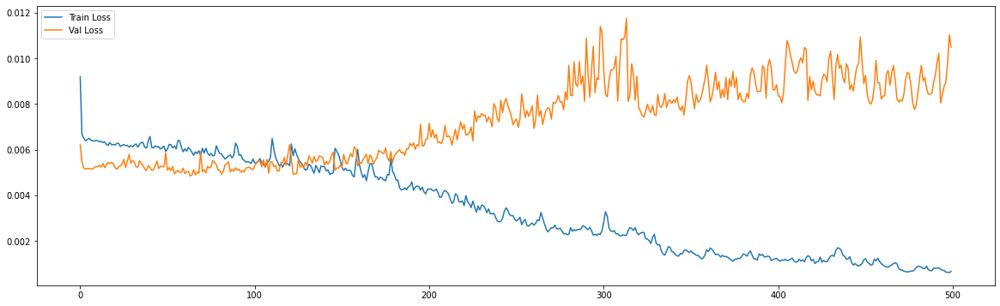

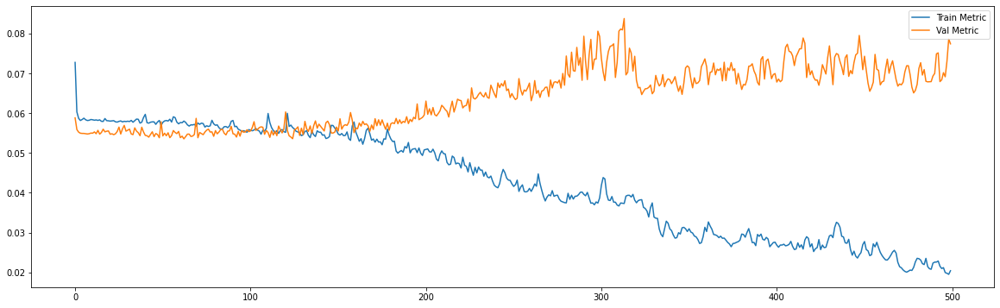



43/43 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0297
loss and metric train data [0.0013878676109015942, 0.029737455770373344]
8/8 [==============================] - 0s 3ms/step - loss: 0.0105 - mae: 0.0774
loss and metric val data [0.01048873458057642, 0.07740900665521622]
8/8 [==============================] - 0s 2ms/step - loss: 0.0094 - mae: 0.0765
loss and metric test data [0.009443388320505619, 0.07651247829198837]


In [10]:
regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
adam = optimizers.Adam(lr = 0.01, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

# early stop
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=60, verbose = 0, shuffle= False
                        # , callbacks=[es]
                        )

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

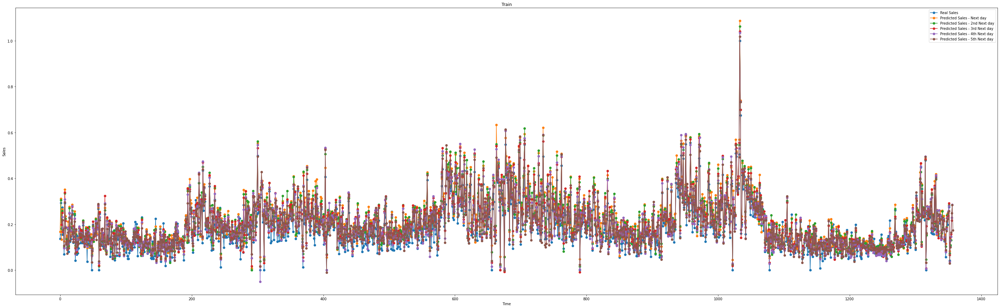

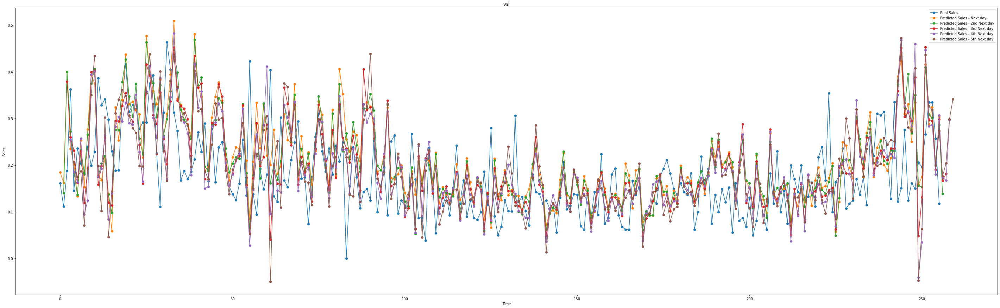

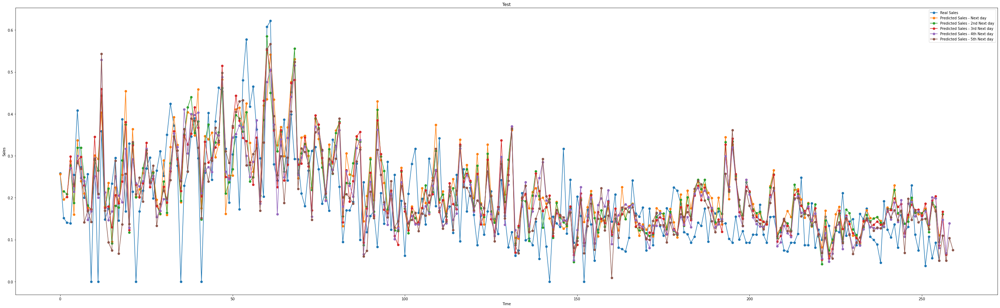

In [11]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train[:,0],marker='o',label='Real Sales')
plt.plot(y_train_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_train_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_train_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_train_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_train_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Train')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val[:,0],marker='o',label='Real Sales')
plt.plot(y_val_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_val_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_val_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_val_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_val_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Val')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_test[:,0],marker='o',label='Real Sales')
plt.plot(y_test_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_test_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_test_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_test_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_test_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Test')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Decreasing Learning Rate

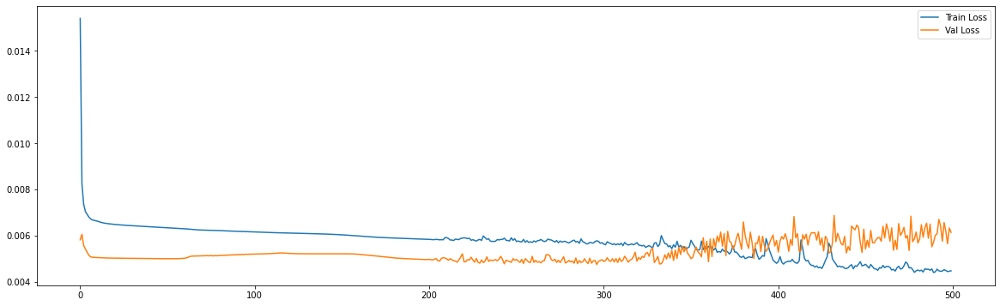

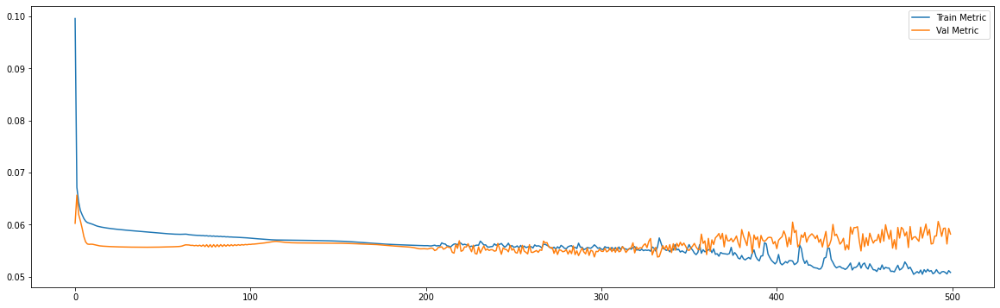



43/43 [==============================] - 0s 3ms/step - loss: 0.0046 - mae: 0.0508
loss and metric train data [0.004572730045765638, 0.05080604925751686]
8/8 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0582
loss and metric val data [0.006137678399682045, 0.05817970633506775]
8/8 [==============================] - 0s 2ms/step - loss: 0.0085 - mae: 0.0693
loss and metric test data [0.008456112816929817, 0.06929782778024673]


In [12]:
del regressor
regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

# early stop
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=60, verbose = 0, shuffle= False
                        # , callbacks=[es]
                        )

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

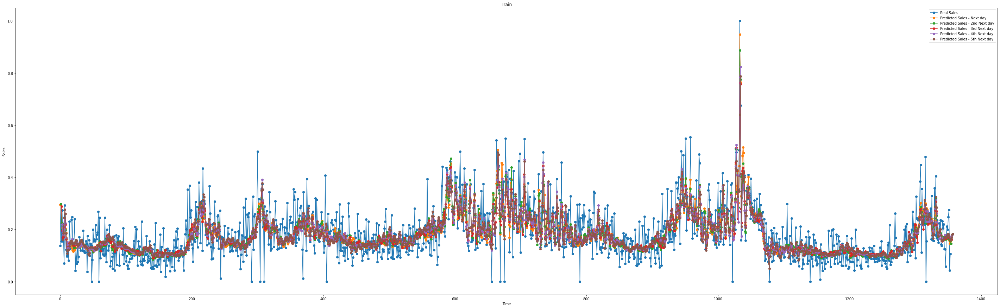

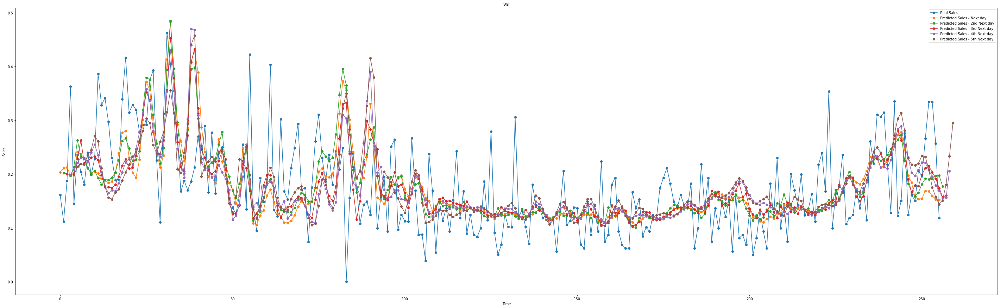

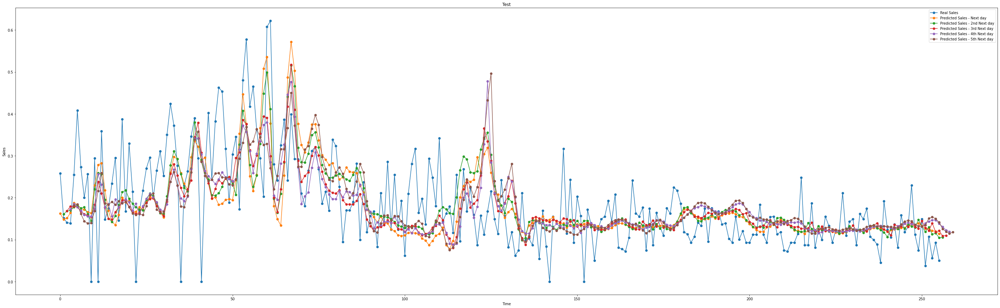

In [13]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train[:,0],marker='o',label='Real Sales')
plt.plot(y_train_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_train_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_train_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_train_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_train_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Train')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val[:,0],marker='o',label='Real Sales')
plt.plot(y_val_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_val_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_val_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_val_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_val_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Val')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_test[:,0],marker='o',label='Real Sales')
plt.plot(y_test_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_test_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_test_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_test_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_test_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Test')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Dropout

---

Learning rate = 0.001 it's a better option.

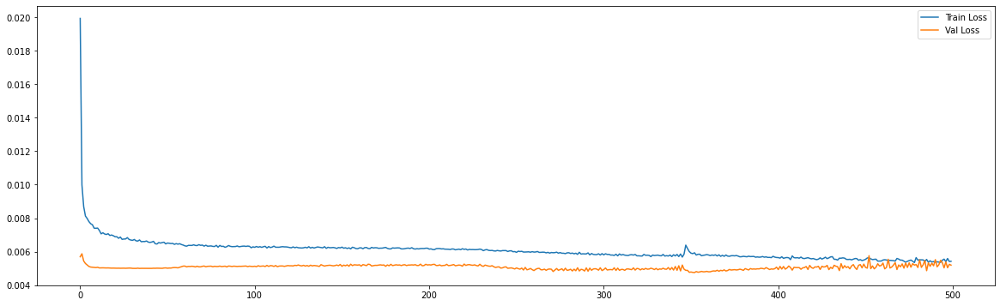

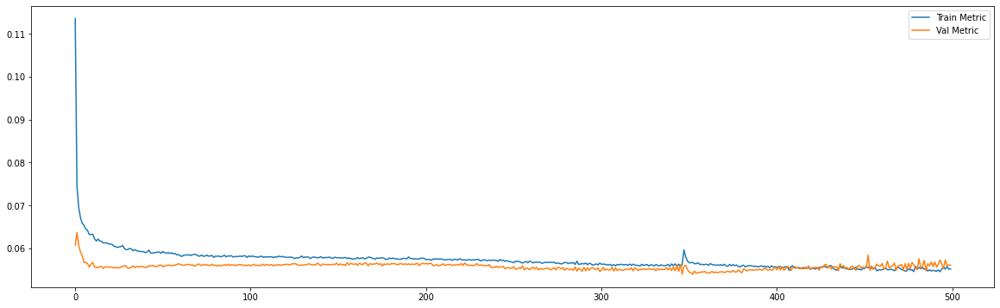



43/43 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0539
loss and metric train data [0.005150170996785164, 0.05394894257187843]
8/8 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0560
loss and metric val data [0.005197692662477493, 0.05602819100022316]
8/8 [==============================] - 0s 3ms/step - loss: 0.0081 - mae: 0.0643
loss and metric test data [0.008098219521343708, 0.06434083729982376]


In [16]:
del regressor
regressor = Sequential()
regressor.add(LSTM(units=50, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dropout(0.3))
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

# early stop
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=60, verbose = 0, shuffle= False
                        # , callbacks=[es]
                        )

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

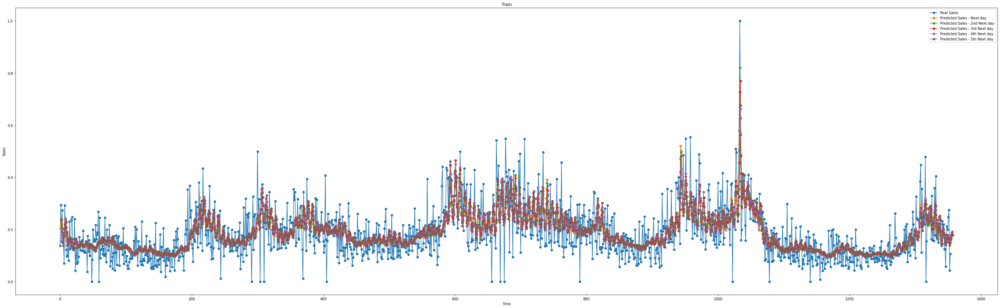

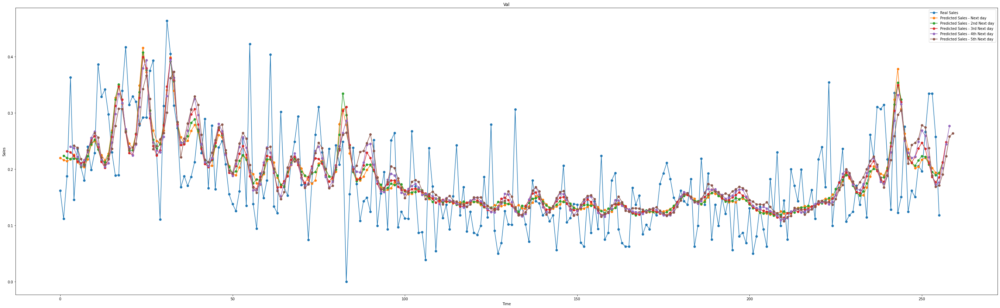

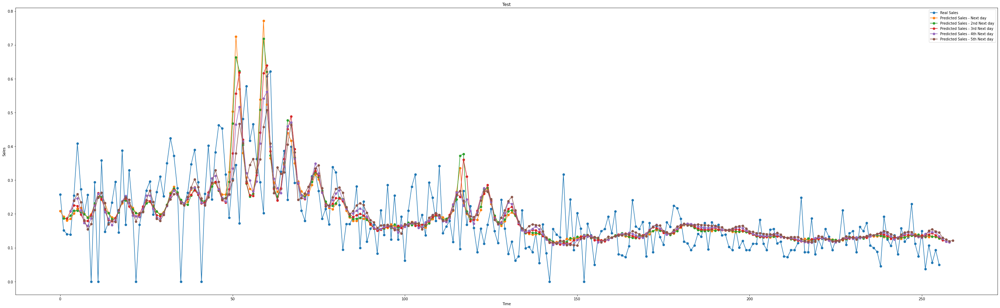

In [17]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train[:,0],marker='o',label='Real Sales')
plt.plot(y_train_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_train_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_train_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_train_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_train_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Train')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val[:,0],marker='o',label='Real Sales')
plt.plot(y_val_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_val_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_val_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_val_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_val_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Val')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_test[:,0],marker='o',label='Real Sales')
plt.plot(y_test_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_test_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_test_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_test_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_test_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Test')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Decreasing model complexit

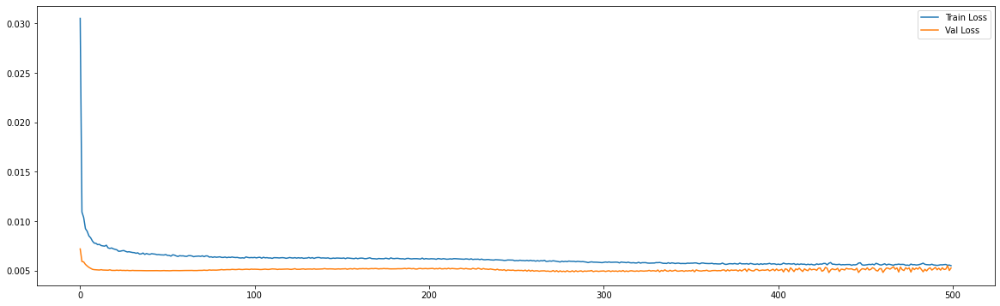

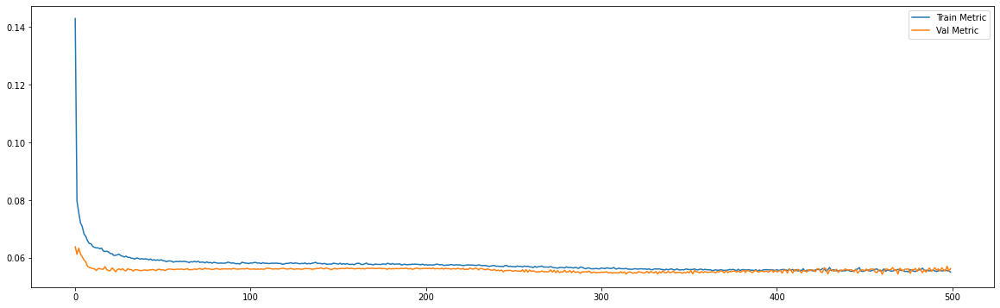



43/43 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0542
loss and metric train data [0.005321422591805458, 0.05420359596610069]
8/8 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0563
loss and metric val data [0.005264055449515581, 0.05629555508494377]
8/8 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0658
loss and metric test data [0.007791349198669195, 0.06575164943933487]


In [21]:
del regressor
regressor = Sequential()
regressor.add(LSTM(units=30, return_sequences=False, input_shape=(time_steps, n_features))) # return_sequences=False next layer is not LSTM
regressor.add(Dropout(0.3))
regressor.add(Dense(units=future_steps))

#Compiling the LSTM
# mom = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
adam = optimizers.Adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
# sgd = optimizers.SGD(lr=0.01, decay=1e-02, momentum=0.9,nesterov=True)
regressor.compile(optimizer = adam, loss = 'mse', metrics=['mae'])

# early stop
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

#Fitting to traning set
history = regressor.fit(x_train, y_train, validation_data=(x_val,y_val), epochs = 500, batch_size=60, verbose = 0, shuffle= False
                        # , callbacks=[es]
                        )

plt.figure(figsize=(20,6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Val Loss'])

plt.figure(figsize=(20,6))
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.legend(['Train Metric', 'Val Metric'])
plt.show()

print('\n')
print('loss and metric train data',regressor.evaluate(x_train,y_train))
print('loss and metric val data',regressor.evaluate(x_val,y_val))
print('loss and metric test data',regressor.evaluate(x_test,y_test))

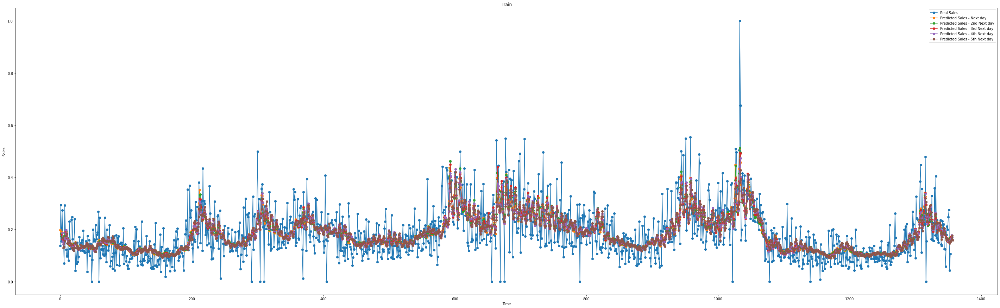

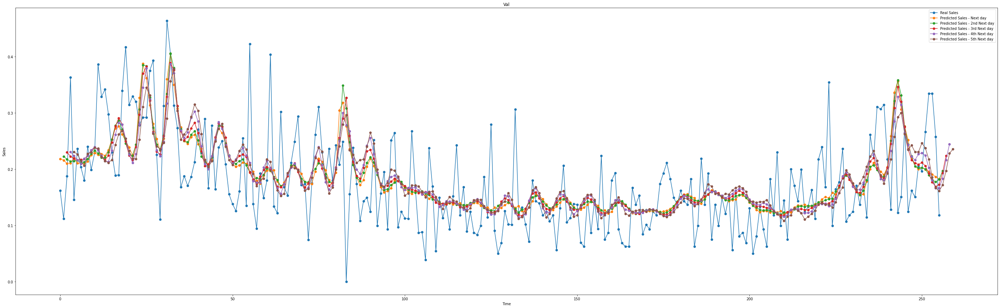

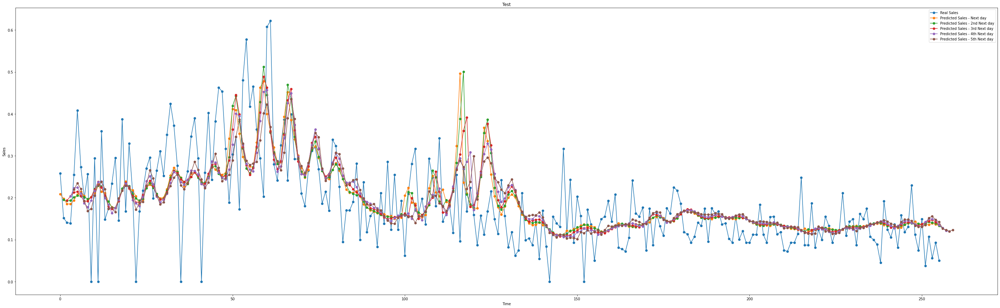

In [22]:
y_train_predict = regressor.predict(x_train)
y_val_predict = regressor.predict(x_val)
y_test_predict = regressor.predict(x_test)

plt.figure(figsize=(50,15))
plt.plot(y_train[:,0],marker='o',label='Real Sales')
plt.plot(y_train_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_train_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_train_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_train_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_train_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Train')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_val[:,0],marker='o',label='Real Sales')
plt.plot(y_val_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_val_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_val_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_val_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_val_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Val')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

plt.figure(figsize=(50,15))
plt.plot(y_test[:,0],marker='o',label='Real Sales')
plt.plot(y_test_predict[:,0],marker='o',label='Predicted Sales - Next day')
plt.plot(np.concatenate(([None],y_test_predict[:, 1])),marker='o',label='Predicted Sales - 2nd Next day')
plt.plot(np.concatenate(([None, None],y_test_predict[:, 2])),marker='o',label='Predicted Sales - 3rd Next day')
plt.plot(np.concatenate(([None, None, None],y_test_predict[:, 3])),marker='o',label='Predicted Sales - 4th Next day')
plt.plot(np.concatenate(([None, None, None,None],y_test_predict[:, 4])),marker='o',label='Predicted Sales - 5th Next day')
plt.title('Test')
plt.xlabel('Time')
plt.ylabel('Sales')
plt.legend()
plt.show()

### Variations

Epoch 00162: early stopping
============================model:0===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0567
loss and metric train data [0.006100926548242569, 0.056665923446416855]
9/9 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0569
loss and metric val data [0.0053095743060112, 0.05688904598355293]
9/9 [==============================] - 0s 2ms/step - loss: 0.0063 - mae: 0.0588
loss and metric test data [0.006303997244685888, 0.05878710001707077]


'neurons': 30, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




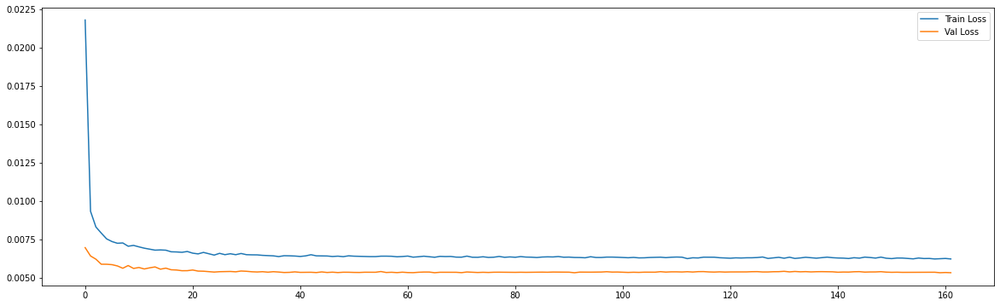

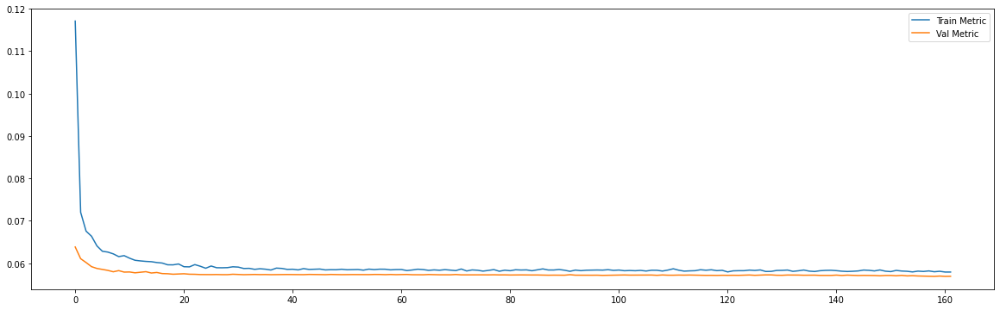

Epoch 00131: early stopping
============================model:1===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0568
loss and metric train data [0.0061707692220807076, 0.05680450052022934]
9/9 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0570
loss and metric val data [0.005371237639337778, 0.056963421404361725]
9/9 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0588
loss and metric test data [0.006406181957572699, 0.05883022025227547]


'neurons': 30, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




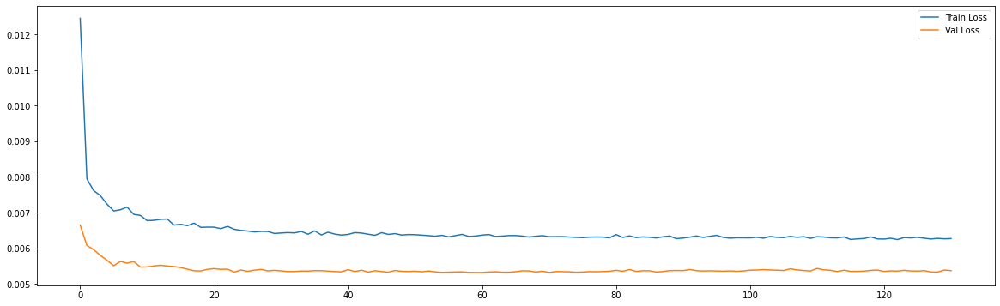

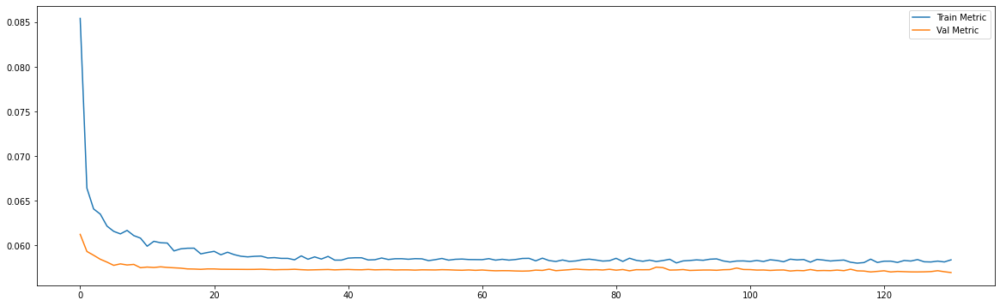

Epoch 00112: early stopping
============================model:2===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0571
loss and metric train data [0.0061083268374204636, 0.05712136626243591]
8/8 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0563
loss and metric val data [0.005189371295273304, 0.05627739802002907]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0634
loss and metric test data [0.007137578912079334, 0.06336670368909836]


'neurons': 30, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




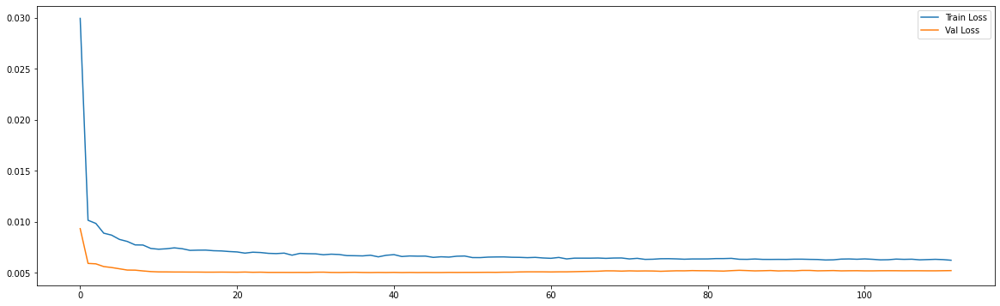

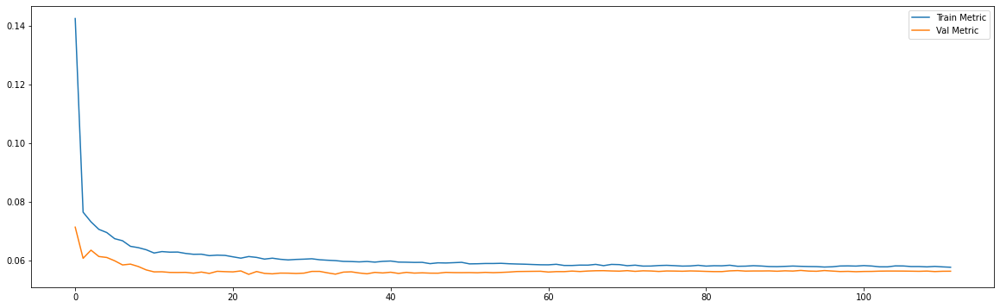

Epoch 00109: early stopping
============================model:3===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0062 - mae: 0.0572
loss and metric train data [0.006150559987872839, 0.05716058611869812]
8/8 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0558
loss and metric val data [0.005080080591142178, 0.05584591254591942]
8/8 [==============================] - 0s 3ms/step - loss: 0.0070 - mae: 0.0628
loss and metric test data [0.006974628195166588, 0.06282258778810501]


'neurons': 30, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




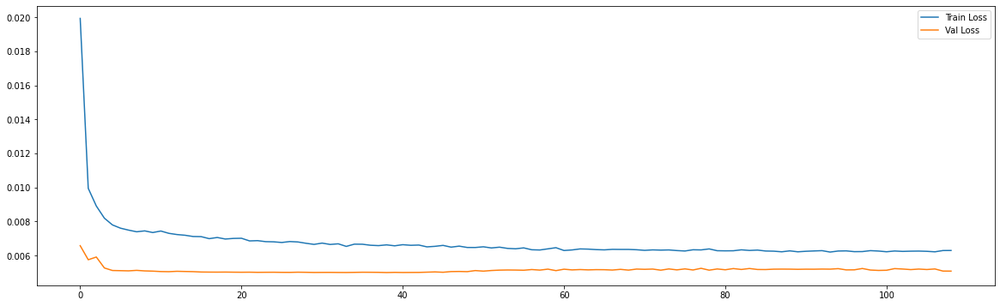

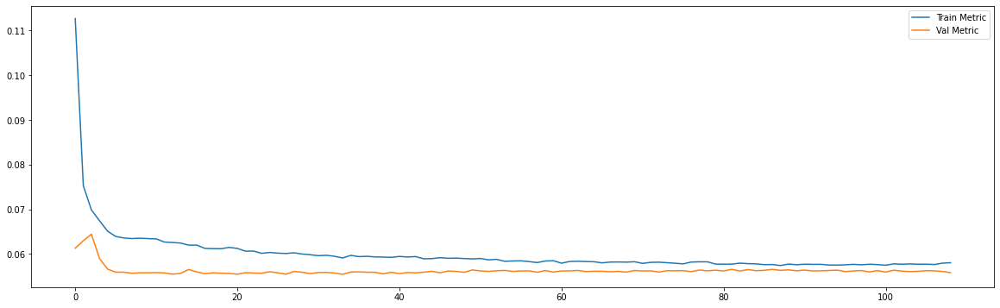

Epoch 00138: early stopping
============================model:4===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0573
loss and metric train data [0.0061621651984751225, 0.057306911796331406]
7/7 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0551
loss and metric val data [0.00509276008233428, 0.05512339249253273]
7/7 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0713
loss and metric test data [0.008587103337049484, 0.07133466005325317]


'neurons': 30, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




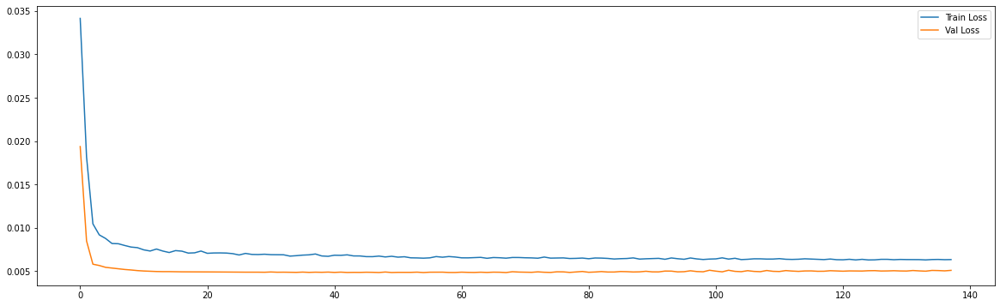

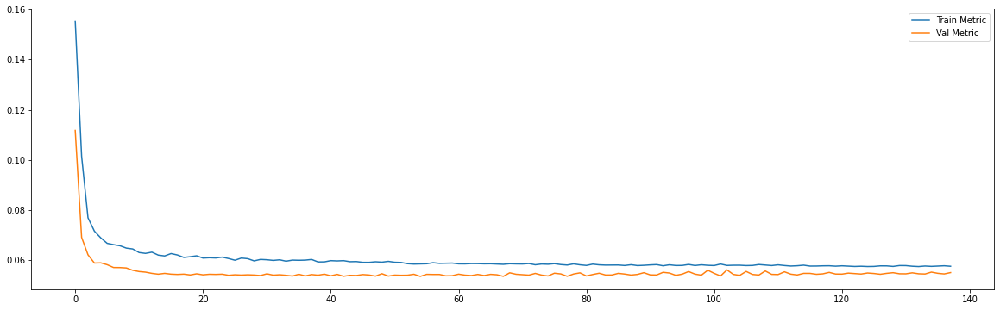

Epoch 00132: early stopping
============================model:5===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0579
loss and metric train data [0.00619508558884263, 0.05785389617085457]
7/7 [==============================] - 0s 5ms/step - loss: 0.0052 - mae: 0.0557
loss and metric val data [0.005163266789168119, 0.05573362857103348]
7/7 [==============================] - 0s 5ms/step - loss: 0.0086 - mae: 0.0720
loss and metric test data [0.008634518831968307, 0.07197047770023346]


'neurons': 30, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




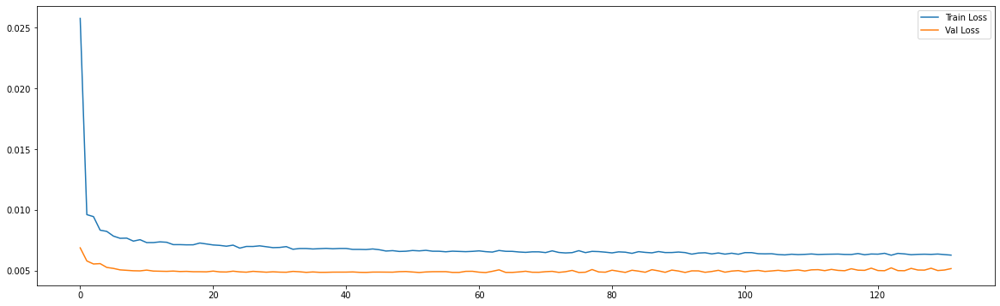

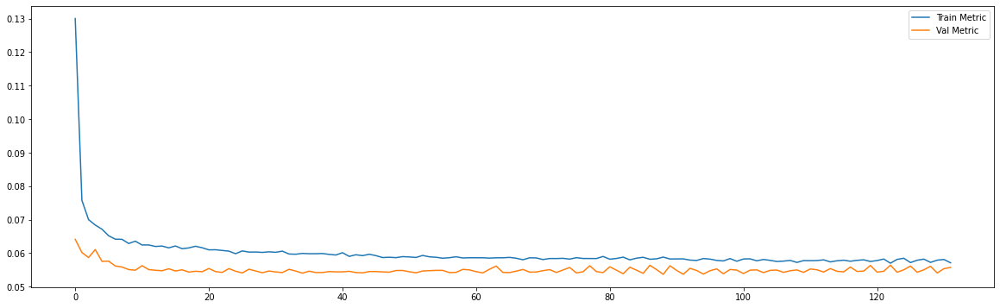

Epoch 00192: early stopping
============================model:6===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0071 - mae: 0.0620
loss and metric train data [0.007126842625439167, 0.06196347624063492]
3/3 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0658
loss and metric val data [0.00717995734885335, 0.0657750815153122]
3/3 [==============================] - 0s 4ms/step - loss: 0.0145 - mae: 0.0937
loss and metric test data [0.014533842913806438, 0.09374108165502548]


'neurons': 30, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




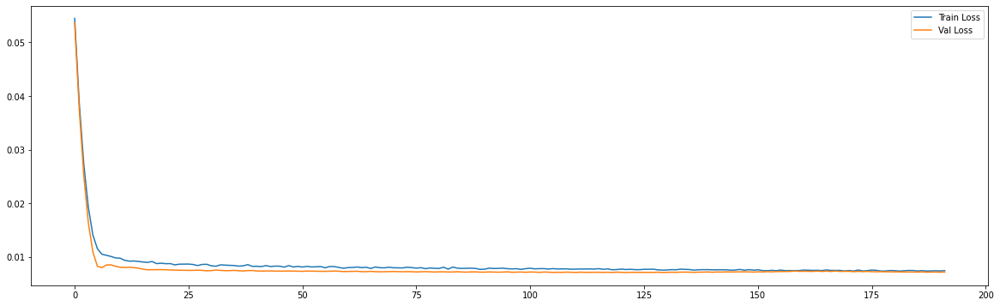

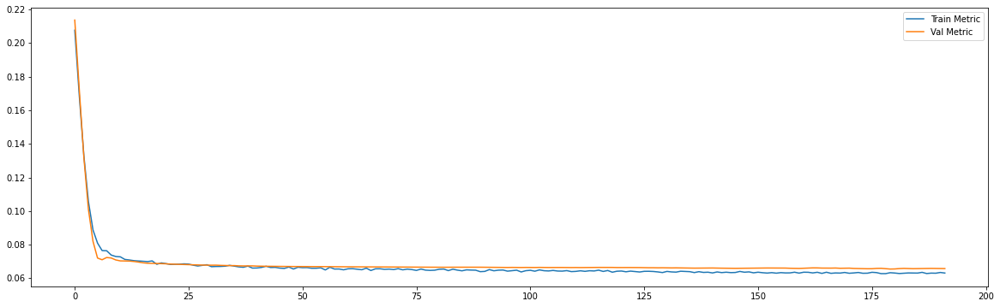

Epoch 00204: early stopping
============================model:7===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0616
loss and metric train data [0.007115968968719244, 0.061558861285448074]
3/3 [==============================] - 0s 6ms/step - loss: 0.0075 - mae: 0.0675
loss and metric val data [0.007492499891668558, 0.0675206184387207]
3/3 [==============================] - 0s 6ms/step - loss: 0.0145 - mae: 0.0942
loss and metric test data [0.014516458846628666, 0.09422989934682846]


'neurons': 30, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




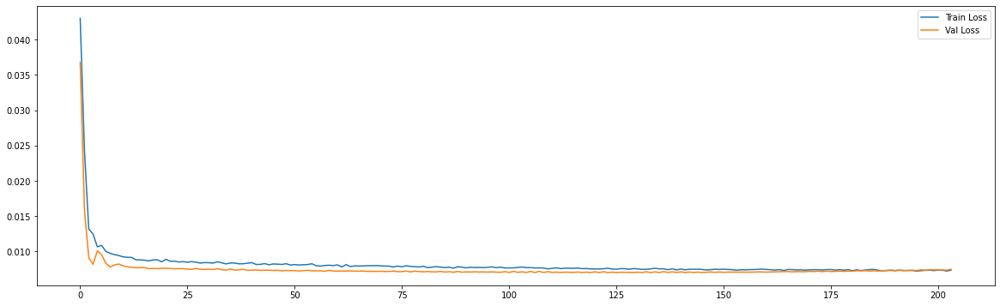

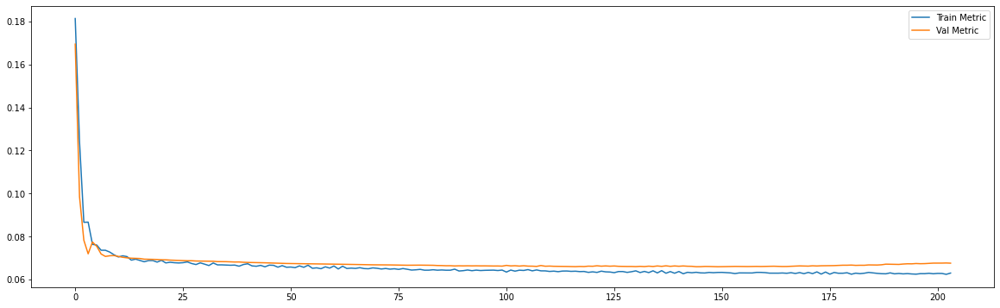

Epoch 00352: early stopping
============================model:8===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0057 - mae: 0.0559
loss and metric train data [0.005734797101467848, 0.05587596818804741]
9/9 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0560
loss and metric val data [0.005053830333054066, 0.05603290721774101]
9/9 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0571
loss and metric test data [0.005972553510218859, 0.0571410171687603]


'neurons': 30, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




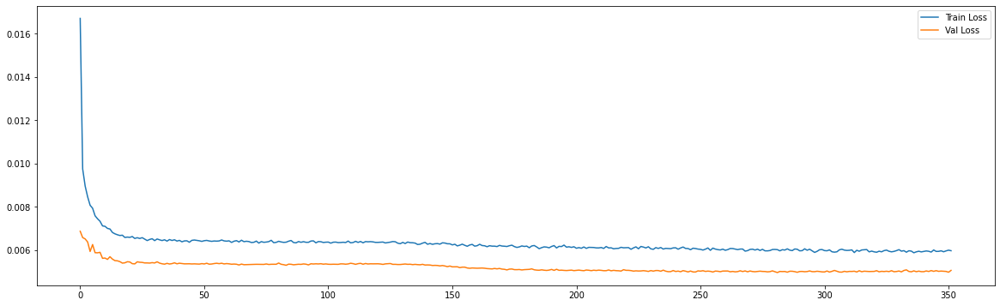

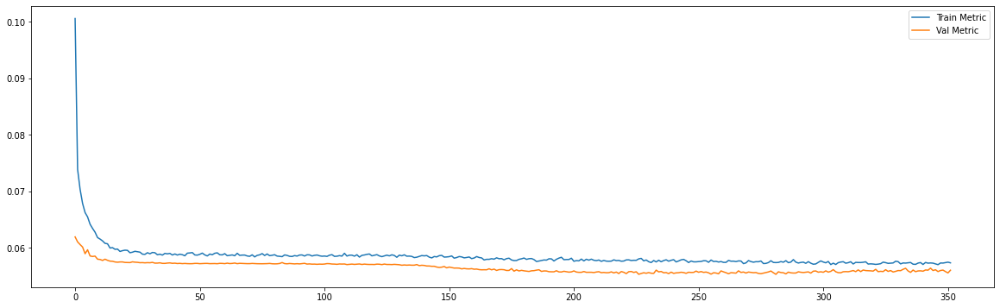

Epoch 00107: early stopping
============================model:9===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0569
loss and metric train data [0.006199253257364035, 0.05690574273467064]
9/9 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0574
loss and metric val data [0.005385959055274725, 0.057396240532398224]
9/9 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0588
loss and metric test data [0.006442179437726736, 0.058761950582265854]


'neurons': 30, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




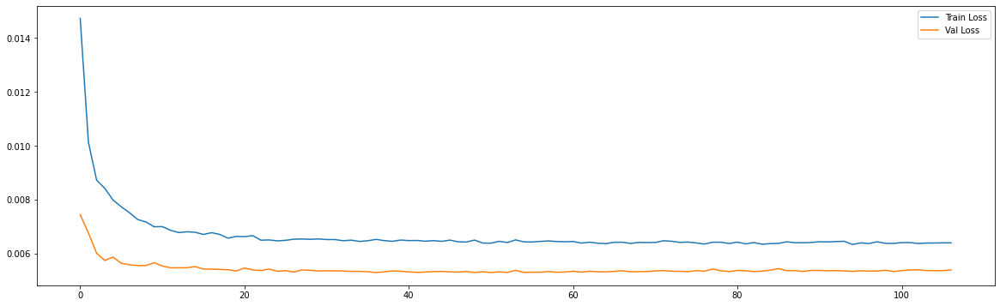

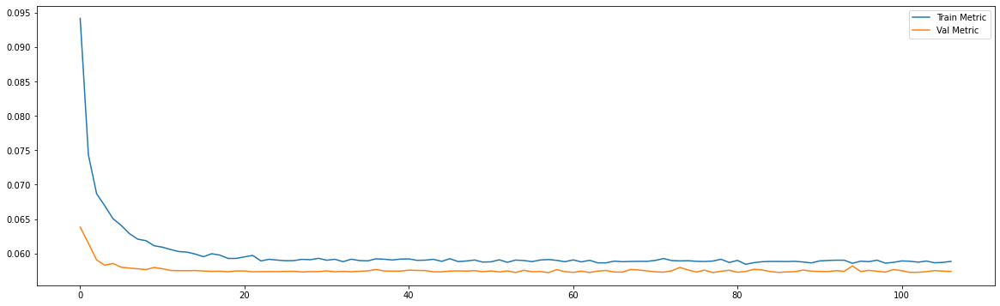

Epoch 00116: early stopping
============================model:10===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0570
loss and metric train data [0.006116736680269241, 0.05701523274183273]
8/8 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0559
loss and metric val data [0.005116881802678108, 0.05593980848789215]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0630
loss and metric test data [0.007063054013997316, 0.06297087669372559]


'neurons': 30, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




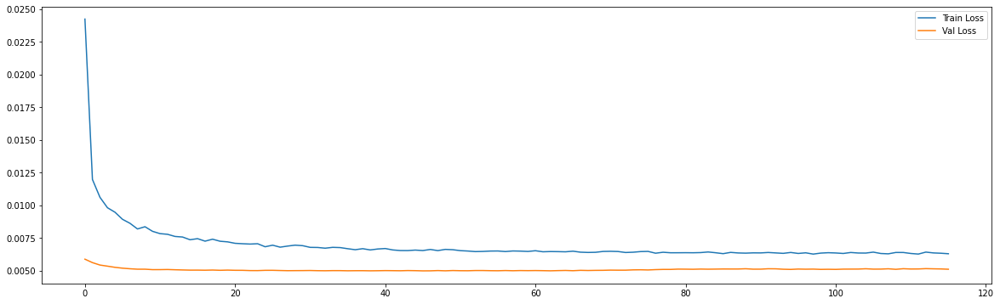

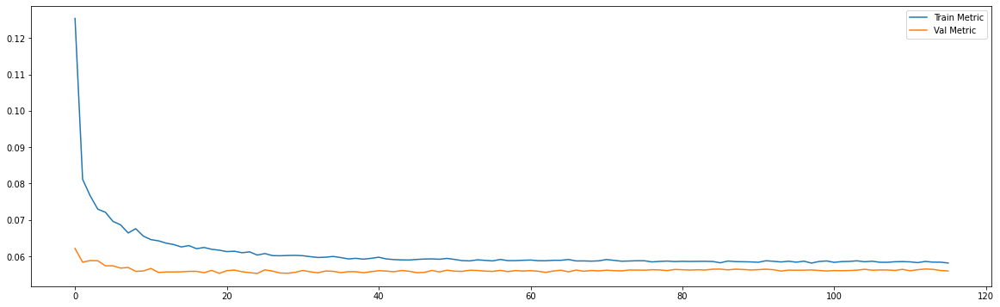

Epoch 00118: early stopping
============================model:11===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0574
loss and metric train data [0.006113769952207804, 0.0573759488761425]
8/8 [==============================] - 0s 5ms/step - loss: 0.0052 - mae: 0.0564
loss and metric val data [0.005166132468730211, 0.05641952529549599]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0636
loss and metric test data [0.007131047546863556, 0.06357632577419281]


'neurons': 30, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




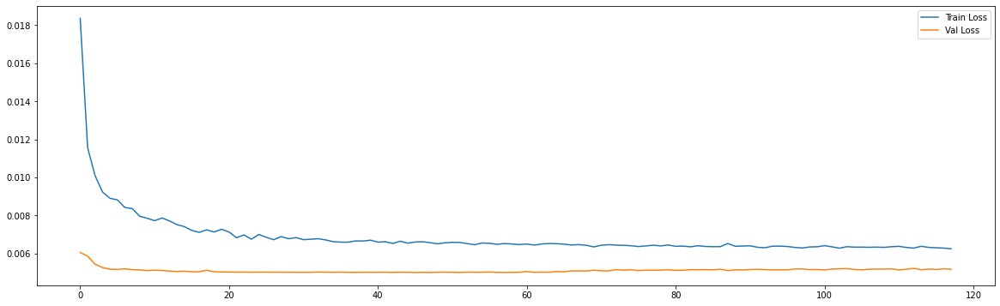

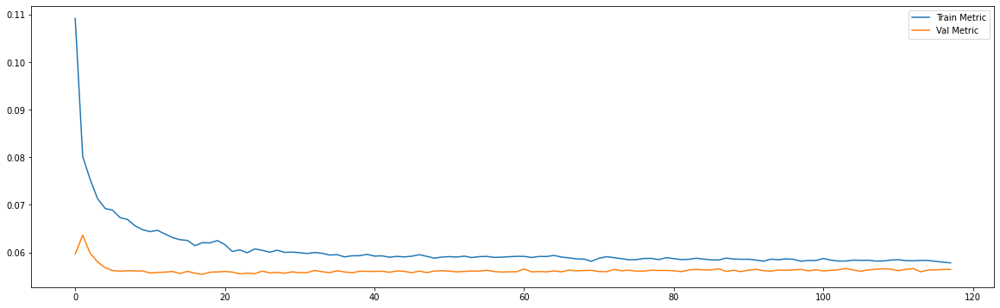

Epoch 00156: early stopping
============================model:12===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0568
loss and metric train data [0.006177728530019522, 0.05678536742925644]
7/7 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0543
loss and metric val data [0.004982735961675644, 0.05433882027864456]
7/7 [==============================] - 0s 4ms/step - loss: 0.0086 - mae: 0.0705
loss and metric test data [0.008551927283406258, 0.07046622782945633]


'neurons': 30, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




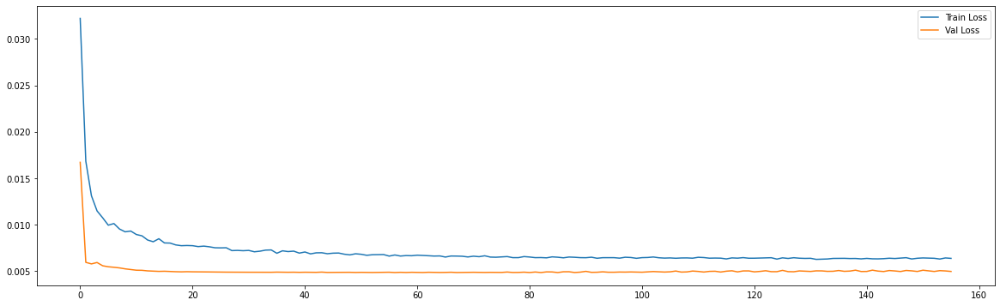

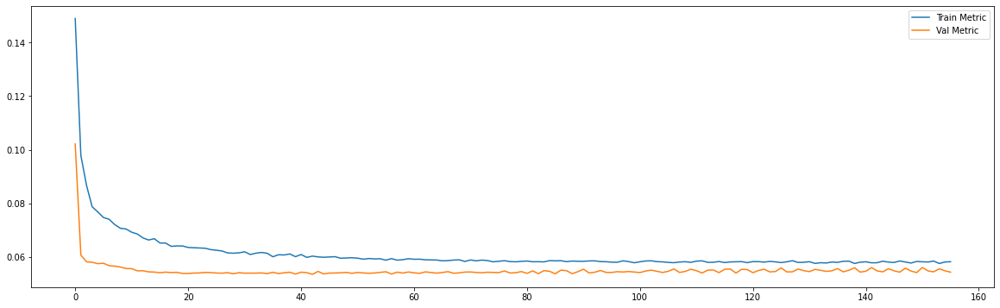

Epoch 00136: early stopping
============================model:13===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0579
loss and metric train data [0.00619749678298831, 0.05787385255098343]
7/7 [==============================] - 0s 5ms/step - loss: 0.0052 - mae: 0.0560
loss and metric val data [0.005150731652975082, 0.05597018077969551]
7/7 [==============================] - 0s 5ms/step - loss: 0.0086 - mae: 0.0717
loss and metric test data [0.008629529736936092, 0.07168727368116379]


'neurons': 30, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




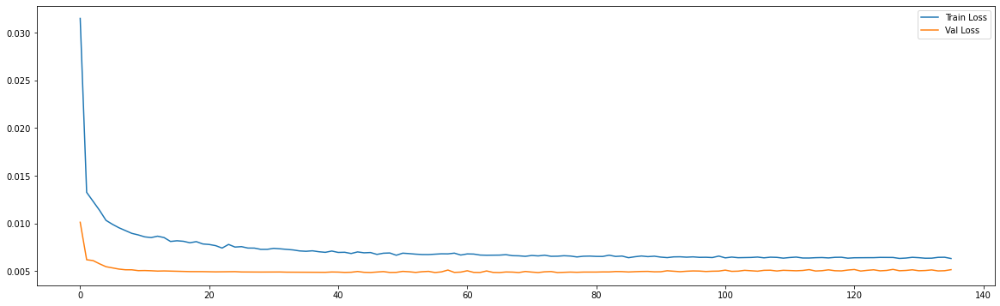

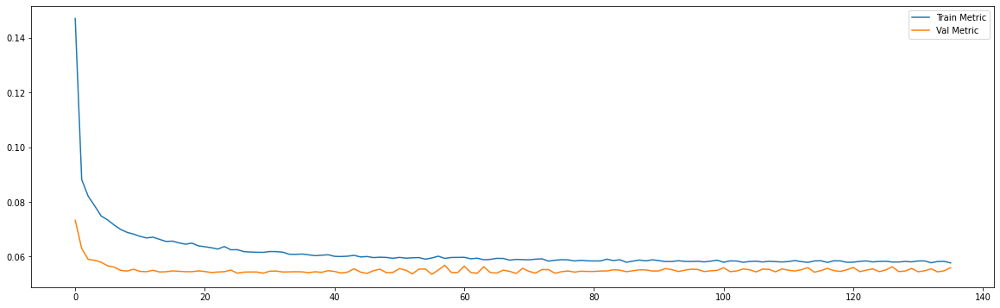

Epoch 00369: early stopping
============================model:14===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0071 - mae: 0.0618
loss and metric train data [0.0071125756949186325, 0.0618252195417881]
3/3 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0663
loss and metric val data [0.00718630850315094, 0.06631523370742798]
3/3 [==============================] - 0s 4ms/step - loss: 0.0146 - mae: 0.0939
loss and metric test data [0.014630609191954136, 0.09387007355690002]


'neurons': 30, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




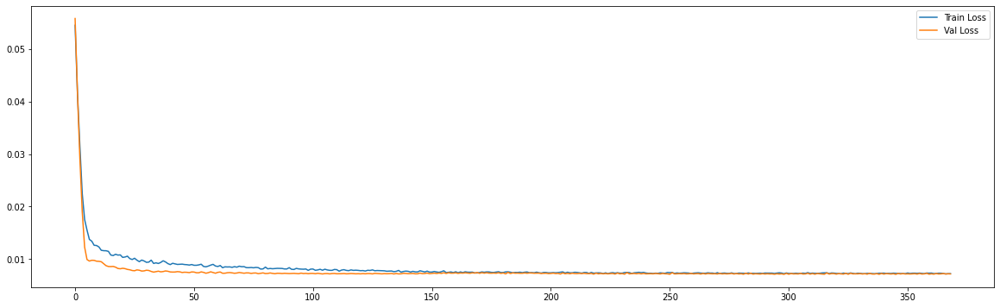

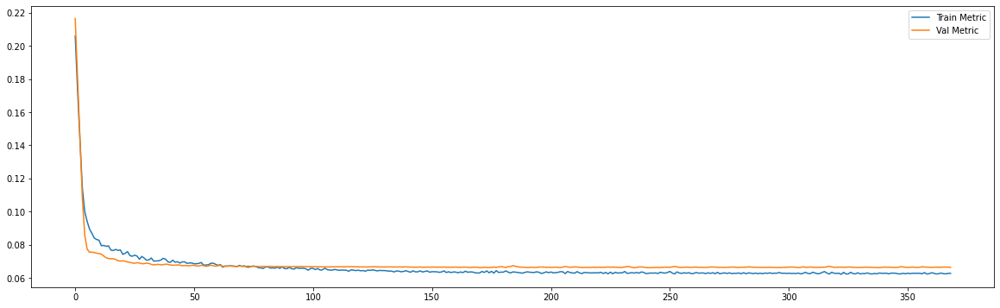

Epoch 00209: early stopping
============================model:15===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0618
loss and metric train data [0.007115560118108988, 0.061785243451595306]
3/3 [==============================] - 0s 7ms/step - loss: 0.0074 - mae: 0.0669
loss and metric val data [0.0073955850675702095, 0.06686168909072876]
3/3 [==============================] - 0s 6ms/step - loss: 0.0144 - mae: 0.0939
loss and metric test data [0.014408668503165245, 0.093928262591362]


'neurons': 30, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




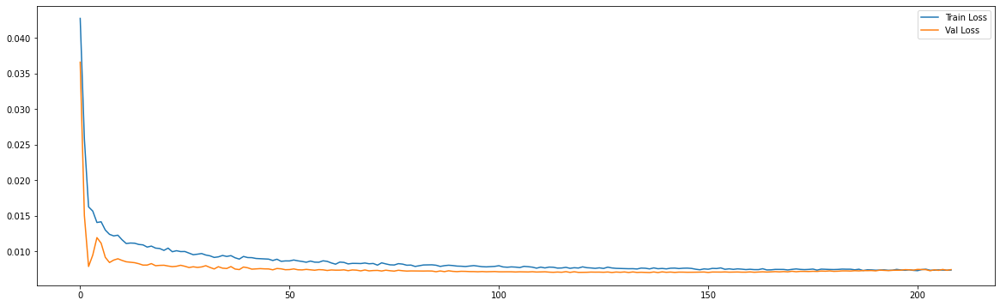

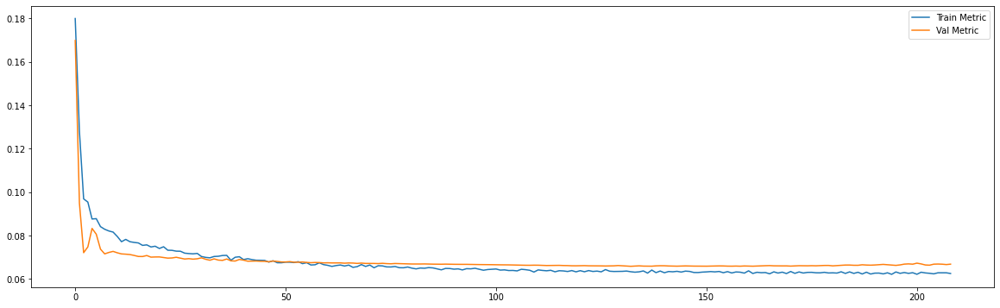

Epoch 00106: early stopping
============================model:16===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0063 - mae: 0.0569
loss and metric train data [0.006256979424506426, 0.056911103427410126]
9/9 [==============================] - 0s 2ms/step - loss: 0.0055 - mae: 0.0571
loss and metric val data [0.005463466979563236, 0.0570940263569355]
9/9 [==============================] - 0s 2ms/step - loss: 0.0065 - mae: 0.0588
loss and metric test data [0.006512955762445927, 0.05882023274898529]


'neurons': 50, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




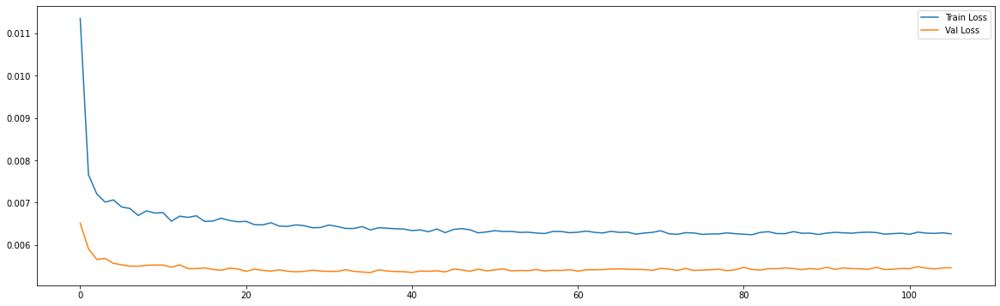

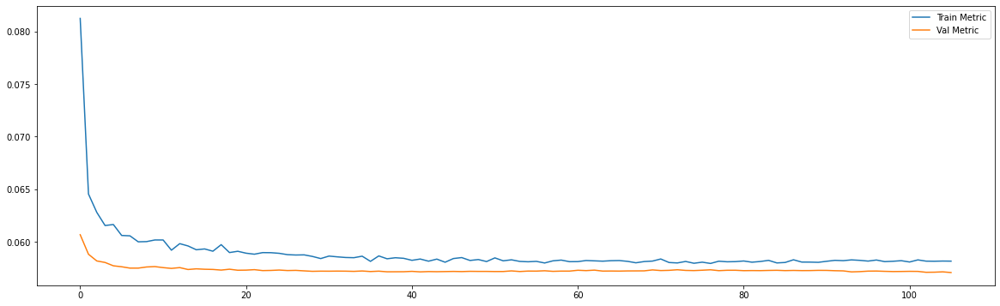

Epoch 00191: early stopping
============================model:17===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0561
loss and metric train data [0.005741220433264971, 0.056099649518728256]
9/9 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0562
loss and metric val data [0.005108666606247425, 0.05615371838212013]
9/9 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0570
loss and metric test data [0.006195732858031988, 0.05698051303625107]


'neurons': 50, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




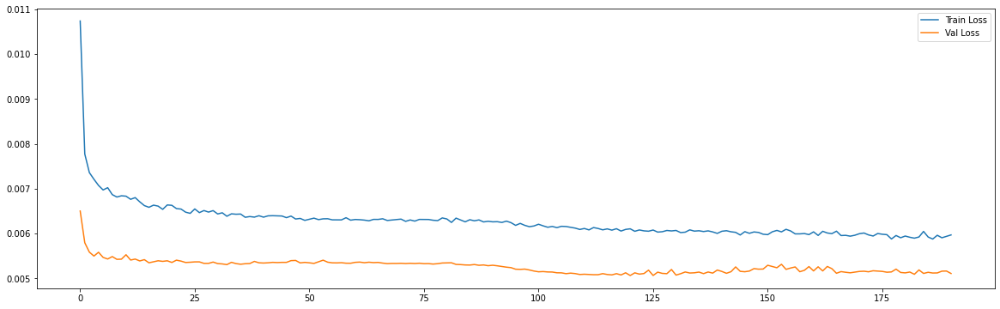

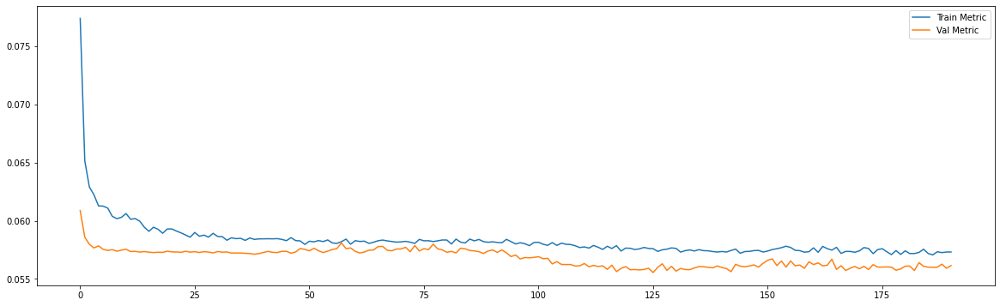

Epoch 00103: early stopping
============================model:18===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0570
loss and metric train data [0.006112401373684406, 0.057036299258470535]
8/8 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0560
loss and metric val data [0.0051520452834665775, 0.05596843361854553]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0634
loss and metric test data [0.007145698647946119, 0.06336623430252075]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




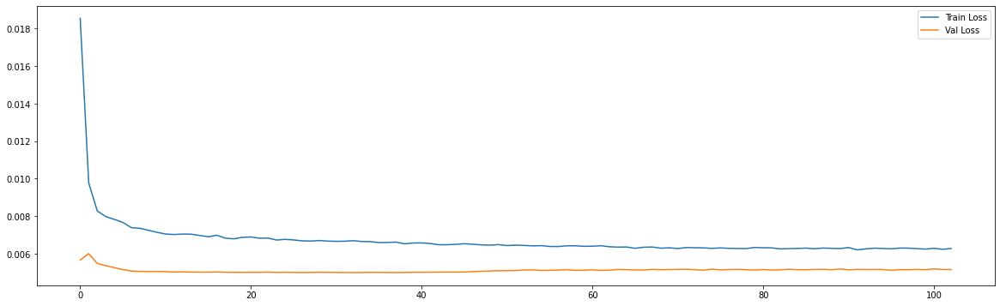

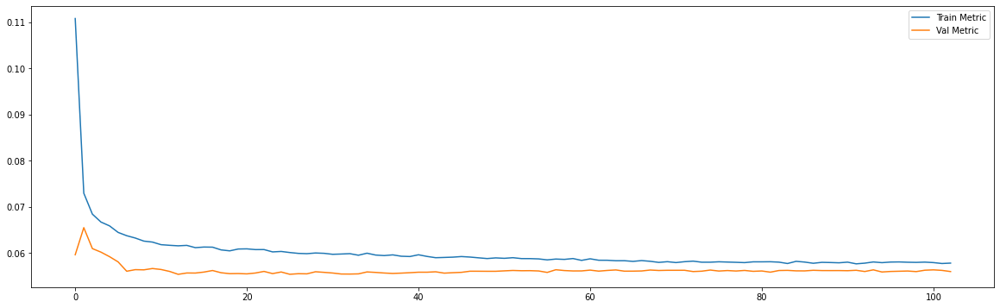

Epoch 00100: early stopping
============================model:19===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0573
loss and metric train data [0.006113240495324135, 0.057295188307762146]
8/8 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0562
loss and metric val data [0.005212051793932915, 0.056247055530548096]
8/8 [==============================] - 0s 3ms/step - loss: 0.0073 - mae: 0.0641
loss and metric test data [0.0072913807816803455, 0.06407713145017624]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




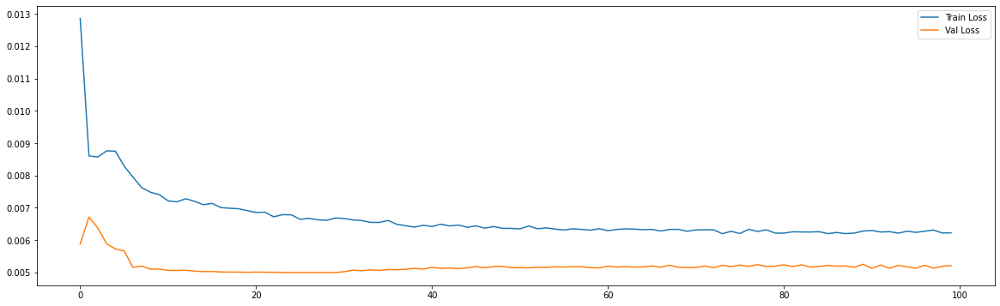

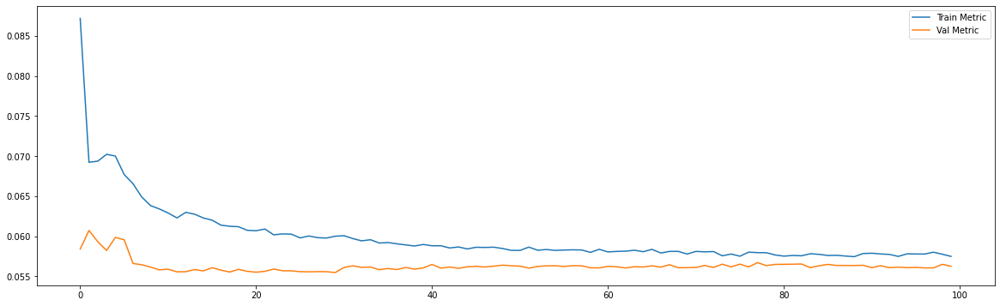

Epoch 00125: early stopping
============================model:20===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0570
loss and metric train data [0.006142594385892153, 0.05695464834570885]
7/7 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0546
loss and metric val data [0.005024787504225969, 0.05462390184402466]
7/7 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0711
loss and metric test data [0.008560620248317719, 0.07106762379407883]


'neurons': 50, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




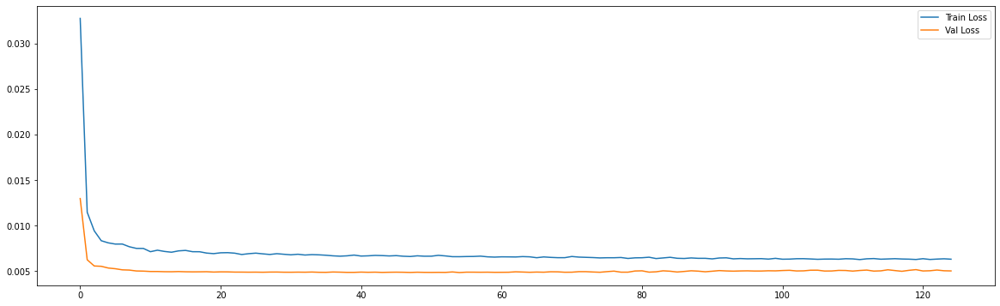

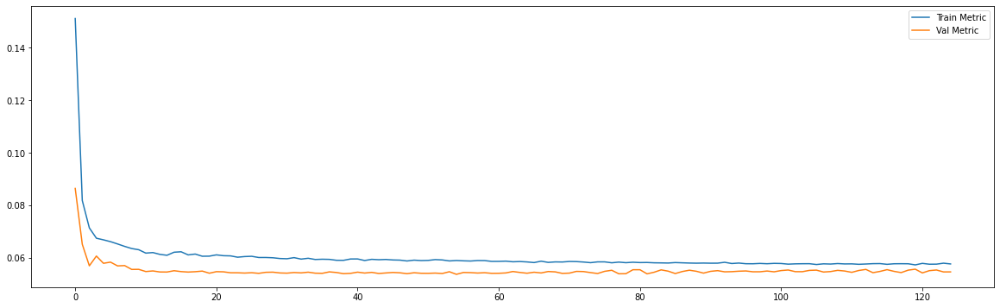

Epoch 00104: early stopping
============================model:21===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0061 - mae: 0.0571
loss and metric train data [0.006133294198662043, 0.05711818486452103]
7/7 [==============================] - 0s 5ms/step - loss: 0.0051 - mae: 0.0549
loss and metric val data [0.005067269317805767, 0.05490661785006523]
7/7 [==============================] - 0s 5ms/step - loss: 0.0086 - mae: 0.0716
loss and metric test data [0.008646591566503048, 0.0716187059879303]


'neurons': 50, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




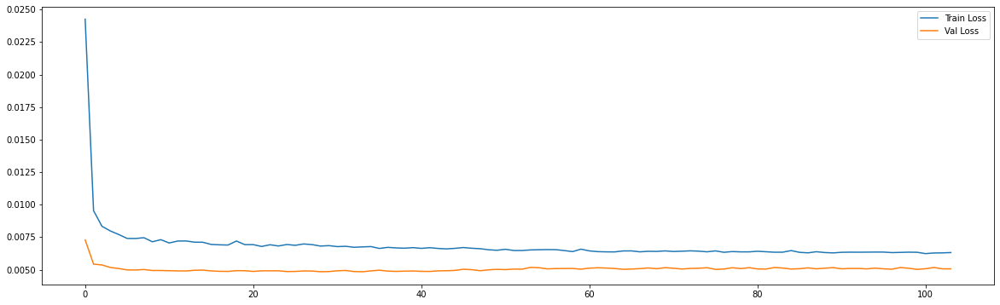

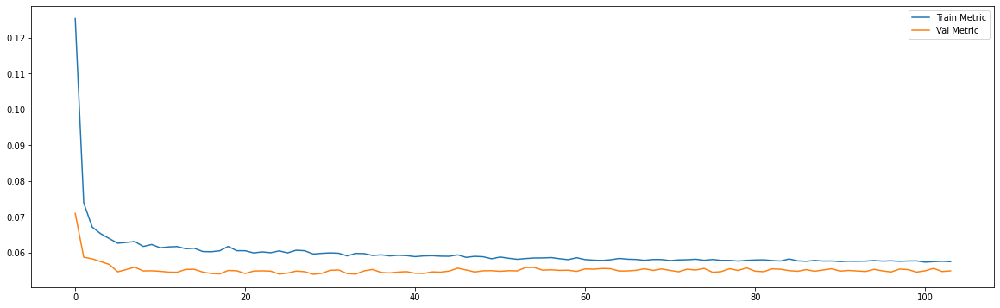

Epoch 00180: early stopping
============================model:22===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0071 - mae: 0.0618
loss and metric train data [0.007111529819667339, 0.06177037954330444]
3/3 [==============================] - 0s 4ms/step - loss: 0.0074 - mae: 0.0663
loss and metric val data [0.007363107521086931, 0.06633250415325165]
3/3 [==============================] - 0s 5ms/step - loss: 0.0144 - mae: 0.0940
loss and metric test data [0.014415949583053589, 0.09398673474788666]


'neurons': 50, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




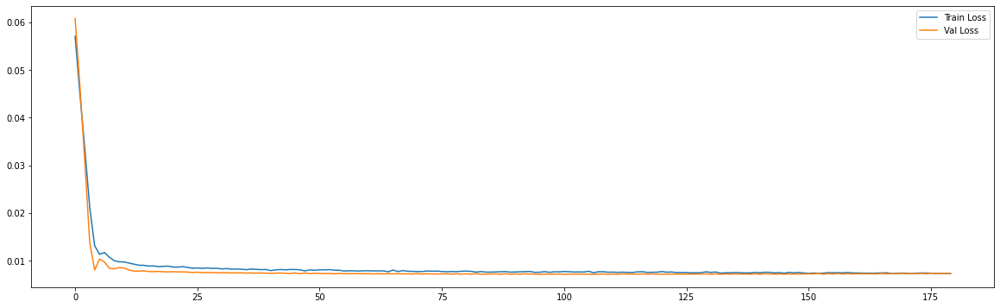

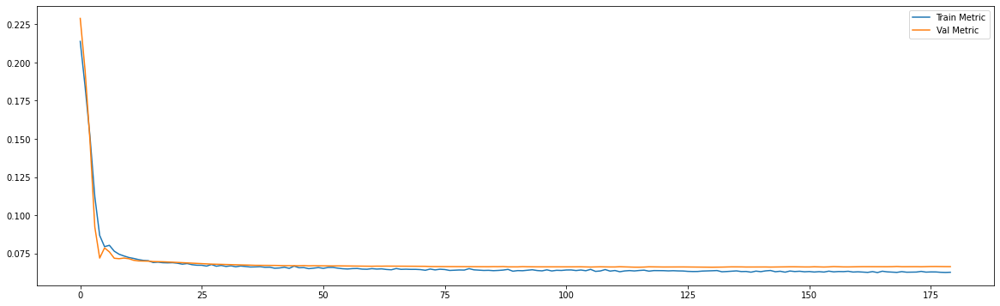

Epoch 00168: early stopping
============================model:23===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0623
loss and metric train data [0.00713235093280673, 0.06232409551739693]
3/3 [==============================] - 0s 6ms/step - loss: 0.0072 - mae: 0.0663
loss and metric val data [0.0072495113126933575, 0.06631892919540405]
3/3 [==============================] - 0s 6ms/step - loss: 0.0143 - mae: 0.0935
loss and metric test data [0.014308786951005459, 0.0934760719537735]


'neurons': 50, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




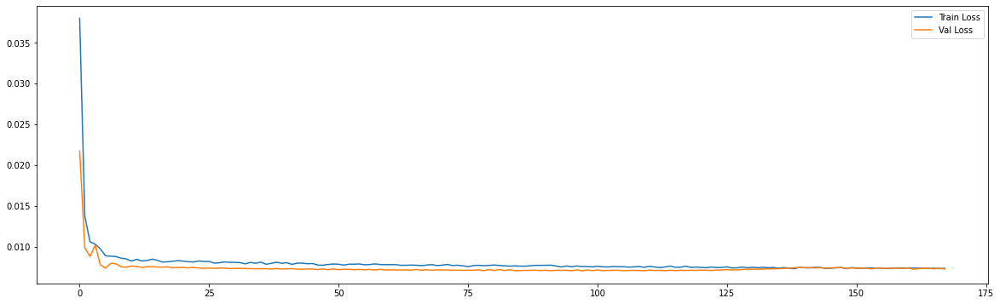

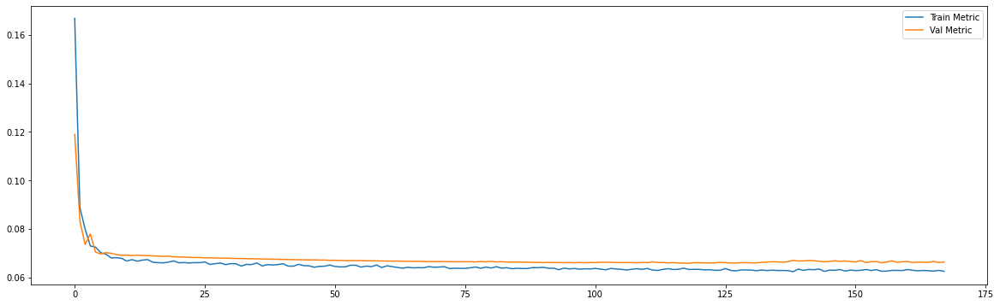

Epoch 00110: early stopping
============================model:24===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0062 - mae: 0.0567
loss and metric train data [0.006183292251080275, 0.056748244911432266]
9/9 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0568
loss and metric val data [0.005374651402235031, 0.056768689304590225]
9/9 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0589
loss and metric test data [0.0063990275375545025, 0.058854151517152786]


'neurons': 50, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




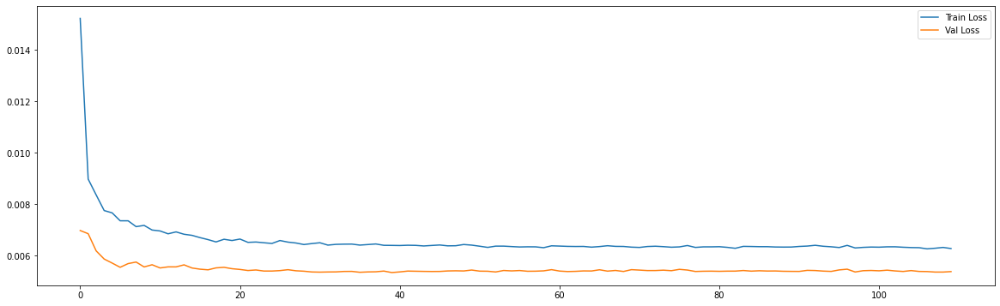

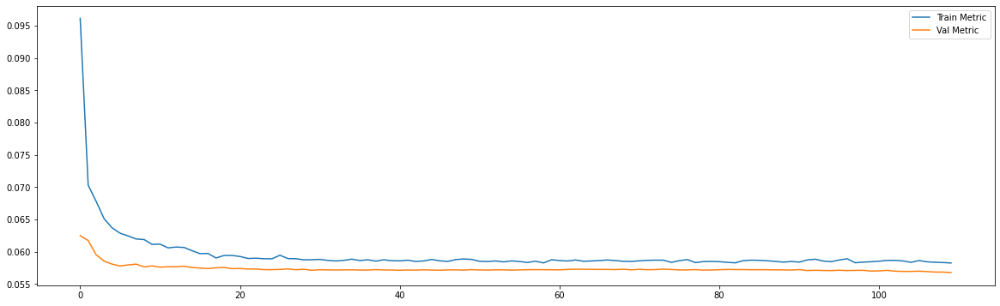

Epoch 00207: early stopping
============================model:25===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0561
loss and metric train data [0.005773068871349096, 0.05614829808473587]
9/9 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0560
loss and metric val data [0.005086684599518776, 0.05598745867609978]
9/9 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0568
loss and metric test data [0.005989250726997852, 0.05676314979791641]


'neurons': 50, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




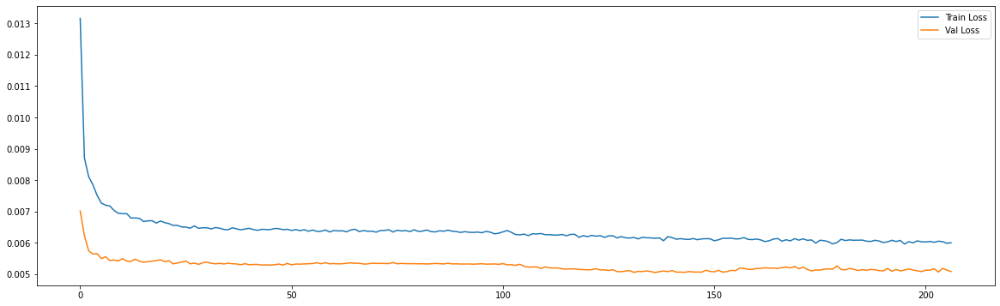

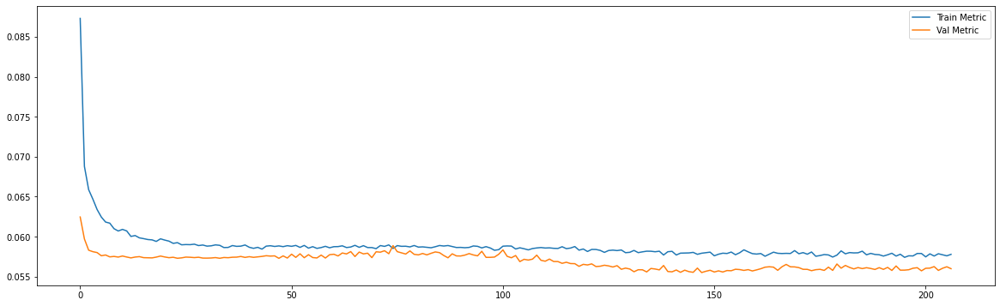

Epoch 00123: early stopping
============================model:26===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0571
loss and metric train data [0.006090645212680101, 0.05714060366153717]
8/8 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0562
loss and metric val data [0.005149564240127802, 0.05617412179708481]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0633
loss and metric test data [0.007102750241756439, 0.06333981454372406]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




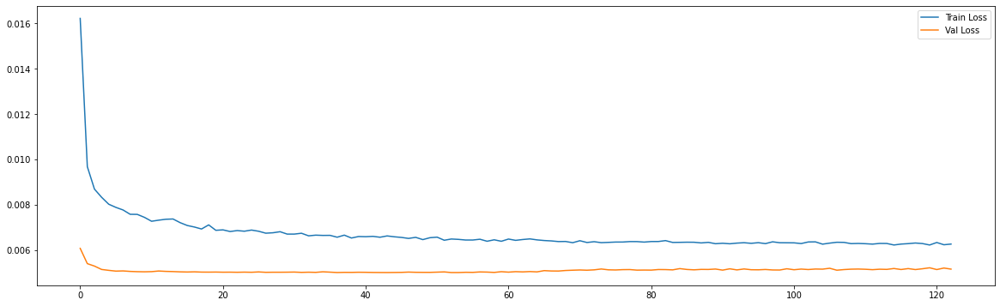

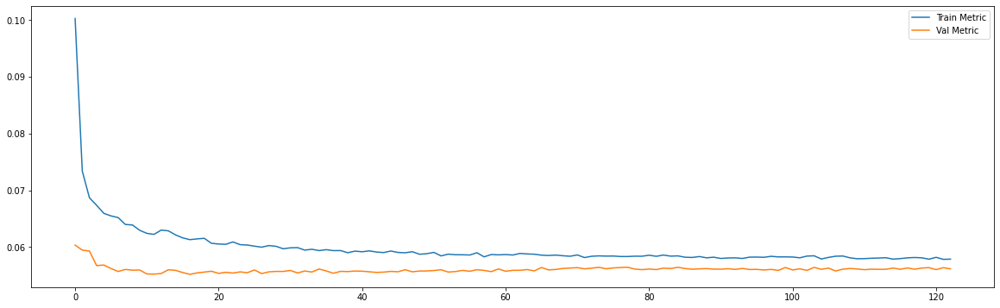

Epoch 00107: early stopping
============================model:27===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0062 - mae: 0.0574
loss and metric train data [0.006182545330375433, 0.0574461966753006]
8/8 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0560
loss and metric val data [0.005229160189628601, 0.056025754660367966]
8/8 [==============================] - 0s 3ms/step - loss: 0.0077 - mae: 0.0659
loss and metric test data [0.007685994729399681, 0.06587329506874084]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




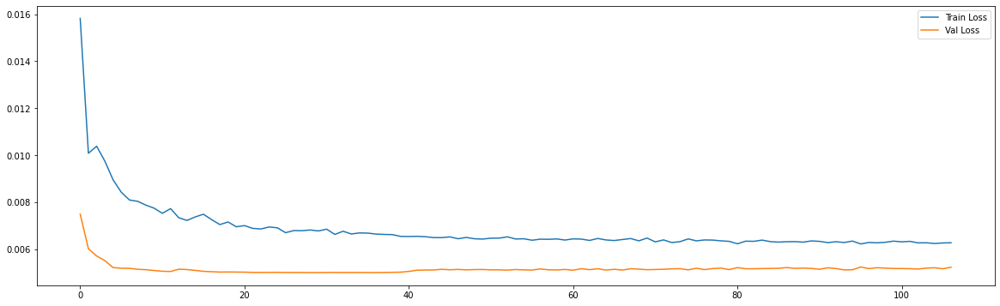

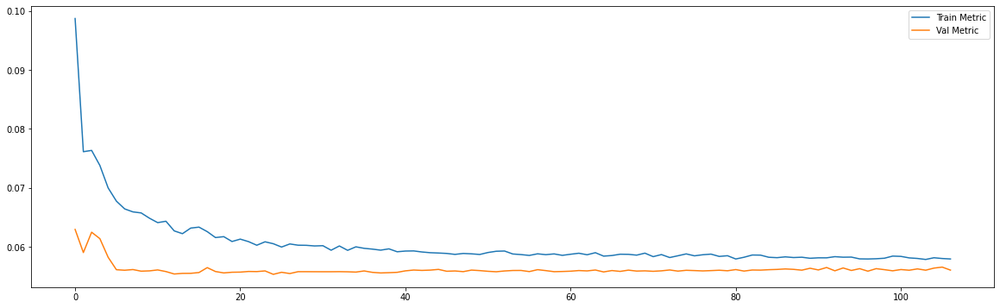

Epoch 00104: early stopping
============================model:28===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0574
loss and metric train data [0.006165786180645227, 0.05735567957162857]
7/7 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0551
loss and metric val data [0.005057487636804581, 0.055073440074920654]
7/7 [==============================] - 0s 3ms/step - loss: 0.0086 - mae: 0.0712
loss and metric test data [0.008572297170758247, 0.071226567029953]


'neurons': 50, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




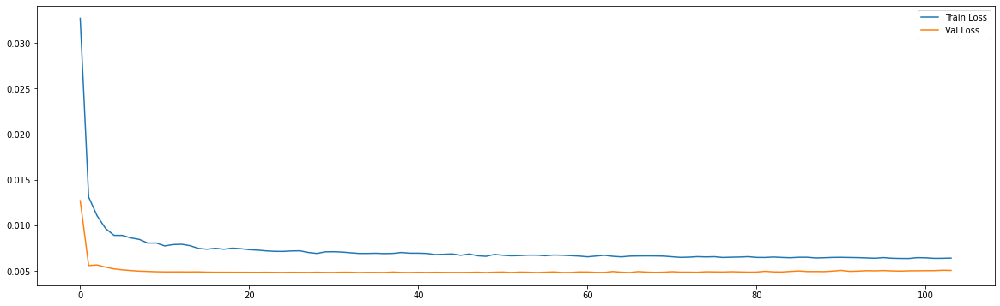

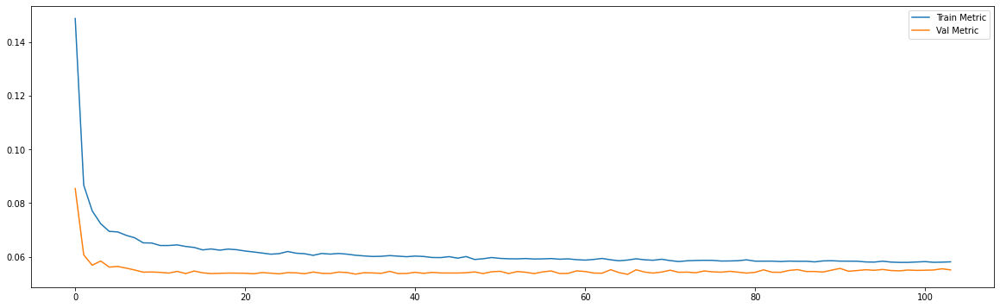

Epoch 00100: early stopping
============================model:29===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0061 - mae: 0.0573
loss and metric train data [0.006147709209471941, 0.05729711800813675]
7/7 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0550
loss and metric val data [0.005097059532999992, 0.05502047389745712]
7/7 [==============================] - 0s 4ms/step - loss: 0.0087 - mae: 0.0721
loss and metric test data [0.008712858892977238, 0.07214245200157166]


'neurons': 50, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




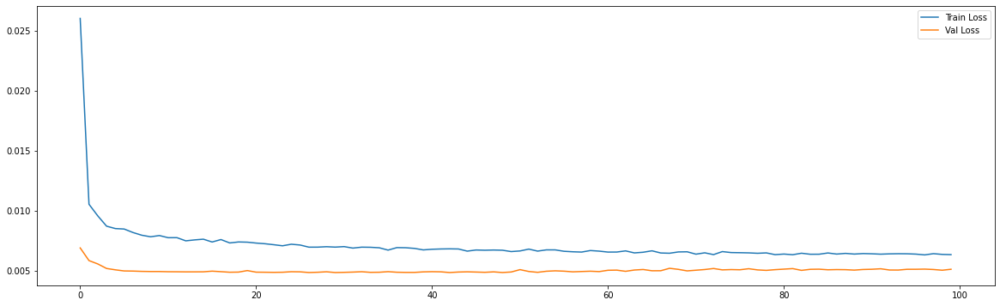

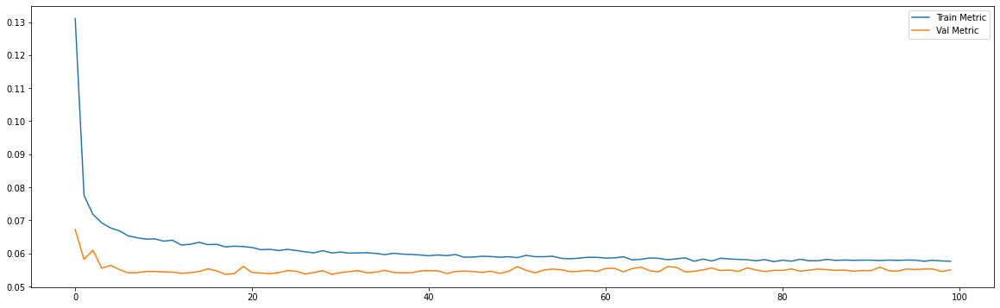

Epoch 00168: early stopping
============================model:30===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0071 - mae: 0.0620
loss and metric train data [0.007124312222003937, 0.06202703341841698]
3/3 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0661
loss and metric val data [0.007325445301830769, 0.06607864052057266]
3/3 [==============================] - 0s 4ms/step - loss: 0.0145 - mae: 0.0938
loss and metric test data [0.014506842009723186, 0.09381697326898575]


'neurons': 50, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




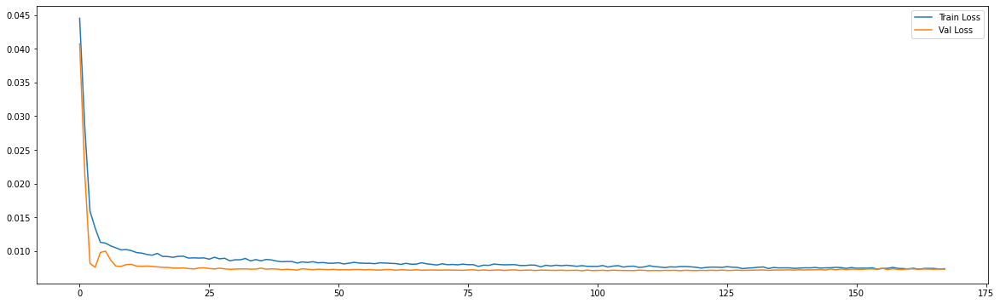

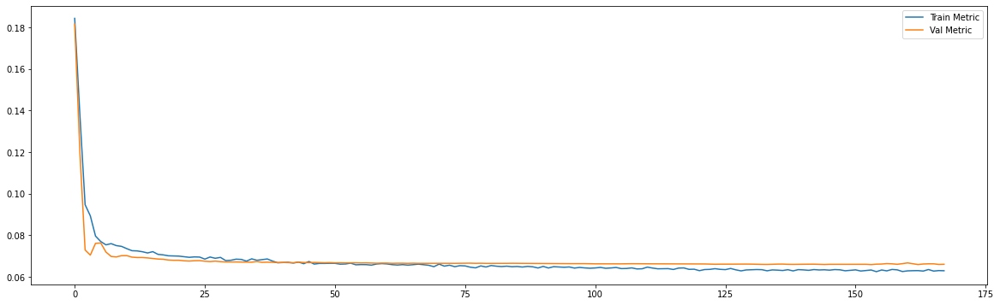

Epoch 00157: early stopping
============================model:31===========================
32/32 [==============================] - 1s 33ms/step - loss: 0.0072 - mae: 0.0619
loss and metric train data [0.007174868602305651, 0.061945591121912]
3/3 [==============================] - 0s 7ms/step - loss: 0.0071 - mae: 0.0661
loss and metric val data [0.007143847178667784, 0.06612954288721085]
3/3 [==============================] - 0s 6ms/step - loss: 0.0149 - mae: 0.0946
loss and metric test data [0.014863846823573112, 0.09461041539907455]


'neurons': 50, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




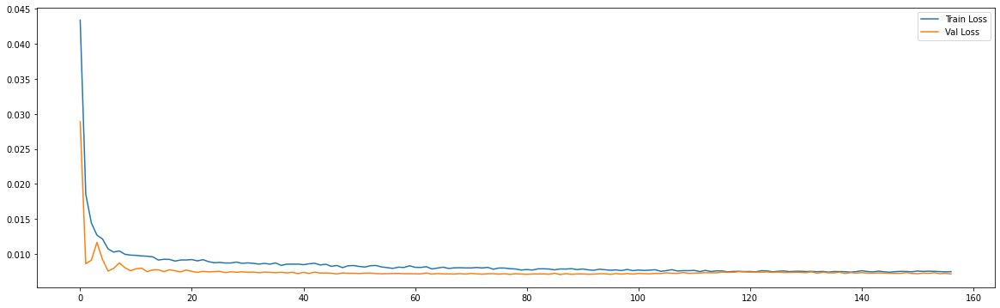

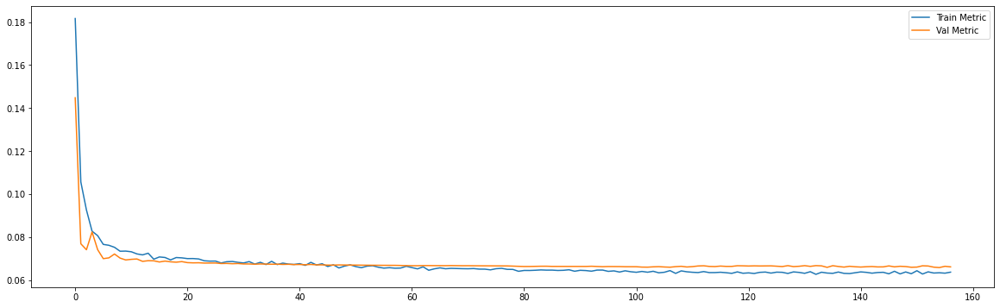

In [9]:
future_steps = 5
n_features = 1

neurons_list = [30,50]
dropout_list = [0.2,0.4]
time_steps_list = [30,60,120,240]
lr_list = [0.001]
models = {}
i=0
for neurons in neurons_list:
  for dropout in dropout_list:
    for time_steps in time_steps_list:
      for lr in lr_list:
        x_train,x_test,x_val,y_train,y_val,y_test = Regressor(future_steps = future_steps,time_steps = time_steps,n_features = n_features,df_train = df_train_norm,df_val = df_val_norm,df_test = df_test_norm)

        models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':time_steps, 'learning_rate':lr}
        models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'learning_rate':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,time_steps,lr,1)

        # The LSTM architecture
        models[i]['model'] = Sequential()
        models[i]['model'].add(LSTM(units=neurons, return_sequences=False,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(Dense(units=future_steps))

        #Compiling the LSTM
        adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
        models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

        # early stop
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 70)

        #Fitting to traning set
        history = models[i]['model'].fit(x_train, y_train, validation_data = (x_val,y_val), epochs = 500, batch_size = time_steps, verbose = 0, shuffle = False, callbacks = [es])

        print('============================model:{}==========================='.format(i))

          
        print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
        print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
        print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
        print('\n')

        print(models[i]['resumo'])
        print('\n')

        plt.figure(figsize=(20,6))
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.legend(['Train Loss', 'Val Loss'])

        plt.figure(figsize=(20,6))
        plt.plot(history.history['mae'])
        plt.plot(history.history['val_mae'])
        plt.legend(['Train Metric', 'Val Metric'])
        plt.show()

        i+=1


        models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':time_steps}
        models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,time_steps,2)

        # The LSTM architecture
        models[i]['model'] = Sequential()
        models[i]['model'].add(LSTM(units=neurons, return_sequences=True,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(LSTM(units=neurons, return_sequences=False))
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(Dense(units=future_steps))

        #Compiling the LSTM
        adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
        models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

         # early stop
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 70)

        #Fitting to traning set
        history = models[i]['model'].fit(x_train, y_train, validation_data = (x_val,y_val), epochs = 500, batch_size = time_steps, verbose = 0, shuffle = False, callbacks = [es])

        print('============================model:{}==========================='.format(i))

          
        print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
        print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
        print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
        print('\n')

        print(models[i]['resumo'])
        print('\n')

        plt.figure(figsize=(20,6))
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.legend(['Train Loss', 'Val Loss'])

        plt.figure(figsize=(20,6))
        plt.plot(history.history['mae'])
        plt.plot(history.history['val_mae'])
        plt.legend(['Train Metric', 'Val Metric'])
        plt.show()

        i+=1

# Multi-Feature

## Importing

In [0]:
df_daily = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/salesdaily.csv')
df_daily = df_daily[['datum','Weekday Name','N02BE']]
df_daily.columns = ['data','weekday','N02BE']

## Encoding Categorial Features





Extracting month information from date column

In [0]:
df_daily['data'] = pd.to_datetime(df_daily['data'])
df_daily['month'] = df_daily['data'].dt.month
df_daily = df_daily[['weekday','month','N02BE']]

weekday can be converted using the OrdinalEnconder technique

In [0]:
dict_ = {'Monday':1,'Tuesday':2,'Wednesday':3,'Thursday':4,'Friday':5,'Saturday':6,'Sunday':7}
df_daily['weekday'].replace(dict_,inplace = True)

## Feature Engineering

Lag Approach

In [0]:
df_daily['lag1'] = df_daily['N02BE'].shift(1)
df_daily['lag2'] = df_daily['N02BE'].shift(2)
df_daily['lag3'] = df_daily['N02BE'].shift(3)
df_daily['lag4'] = df_daily['N02BE'].shift(4)
df_daily['lag5'] = df_daily['N02BE'].shift(5)
df_daily['lag6'] = df_daily['N02BE'].shift(6)
df_daily['lag7'] = df_daily['N02BE'].shift(7)
df_daily['lag30'] = df_daily['N02BE'].shift(30)
df_daily['lag60'] = df_daily['N02BE'].shift(60)
df_daily['lag120'] = df_daily['N02BE'].shift(120)
df_daily['lag240'] = df_daily['N02BE'].shift(240)

Rolling Mean Approach

In [0]:
df_daily['rolling_mean_2'] = df_daily['N02BE'].rolling(window = 2).mean()
df_daily['rolling_mean_3'] = df_daily['N02BE'].rolling(window = 3).mean()
df_daily['rolling_mean_4'] = df_daily['N02BE'].rolling(window = 4).mean()
df_daily['rolling_mean_5'] = df_daily['N02BE'].rolling(window = 5).mean()
df_daily['rolling_mean_6'] = df_daily['N02BE'].rolling(window = 6).mean()
df_daily['rolling_mean_7'] = df_daily['N02BE'].rolling(window = 7).mean()
df_daily['rolling_mean_30'] = df_daily['N02BE'].rolling(window = 30).mean()
df_daily['rolling_mean_60'] = df_daily['N02BE'].rolling(window = 60).mean()
df_daily['rolling_mean_120'] = df_daily['N02BE'].rolling(window = 120).mean()
df_daily['rolling_mean_240'] = df_daily['N02BE'].rolling(window = 240).mean()

In [0]:
df_daily = df_daily[['weekday','month',
          'lag1','lag2','lag3','lag4','lag5','lag6','lag7','lag30','lag60','lag120','lag240',
          'rolling_mean_2','rolling_mean_3','rolling_mean_4','rolling_mean_5','rolling_mean_6','rolling_mean_7','rolling_mean_30','rolling_mean_60','rolling_mean_120','rolling_mean_240',
          'N02BE']]

In [11]:
df_daily

,weekday,month,lag1,lag2,lag3,lag4,lag5,lag6,lag7,lag30,lag60,lag120,lag240,rolling_mean_2,rolling_mean_3,rolling_mean_4,rolling_mean_5,rolling_mean_6,rolling_mean_7,rolling_mean_30,rolling_mean_60,rolling_mean_120,rolling_mean_240,N02BE
0,4,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.40
1,5,1,32.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,50.60
2,6,1,50.60,32.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.225,48.283333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61.85
3,7,1,61.85,50.60,32.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,51.475,51.183333,46.4875,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.10
4,1,1,41.10,61.85,50.60,32.40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.400,41.550000,43.8125,41.53,NaN,NaN,NaN,NaN,NaN,NaN,21.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,5,10,40.40,30.20,47.00,49.40,67.8,48.0,41.1,29.23,6.00,27.0,29.00,31.425,31.016667,35.0125,37.89,42.875000,43.607143,34.939167,25.760500,22.726708,24.611371,22.45
2102,6,10,22.45,40.40,30.20,47.00,49.4,67.8,48.0,14.00,17.25,22.0,42.60,23.925,29.416667,29.6125,33.09,35.808333,40.378571,35.319167,25.896333,22.755042,24.539704,25.40
2103,7,10,25.40,22.45,40.40,30.20,47.0,49.4,67.8,28.40,9.00,22.4,50.20,30.000,27.483333,30.7125,30.61,33.341667,35.635714,35.525833,26.323000,22.856708,24.474704,34.60
2104,1,10,34.60,25.40,22.45,40.40,30.2,47.0,49.4,27.00,15.00,16.5,51.65,42.700,36.933333,33.3125,34.73,33.975000,35.835714,36.319167,26.919667,23.142542,24.471162,50.80


## Feature Importance

----

Based on the features created above, I'll determine wich are really relevant for the LSTM.

In [12]:
df_daily.corr()

,weekday,month,lag1,lag2,lag3,lag4,lag5,lag6,lag7,lag30,lag60,lag120,lag240,rolling_mean_2,rolling_mean_3,rolling_mean_4,rolling_mean_5,rolling_mean_6,rolling_mean_7,rolling_mean_30,rolling_mean_60,rolling_mean_120,rolling_mean_240,N02BE
weekday,1.000000,0.000607,-0.004027,-0.121533,-0.079472,-0.023994,0.034387,0.085315,0.108987,-0.120500,-0.025819,0.000145,-0.130833,0.060833,-0.007872,-0.033305,-0.035007,-0.021126,-0.000753,0.005213,-0.002975,0.001867,0.000892,0.107282
month,0.000607,1.000000,0.007281,-0.016833,-0.033153,-0.048309,-0.056490,-0.069706,-0.073206,-0.140758,-0.175870,-0.419919,0.251692,0.017869,0.006215,-0.005287,-0.016824,-0.026965,-0.037430,-0.141783,-0.210297,-0.477883,-0.500587,0.022918
lag1,-0.004027,0.007281,1.000000,0.440484,0.396451,0.369796,0.376396,0.399472,0.438088,0.264306,0.117696,-0.004168,-0.064370,0.848730,0.798233,0.760460,0.730158,0.710336,0.699425,0.597066,0.485182,0.348320,-0.015375,0.440795
lag2,-0.121533,-0.016833,0.440484,1.000000,0.440490,0.396813,0.370281,0.376167,0.399632,0.315325,0.101449,-0.015532,-0.051531,0.493047,0.779302,0.760658,0.737819,0.715421,0.698898,0.601323,0.494420,0.356274,-0.008158,0.396495
lag3,-0.079472,-0.033153,0.396451,0.440490,1.000000,0.440549,0.396912,0.370232,0.376173,0.281711,0.133714,-0.038846,-0.088495,0.451365,0.511920,0.736859,0.730614,0.715480,0.698046,0.606069,0.501617,0.363581,-0.002013,0.369587
lag4,-0.023994,-0.048309,0.369796,0.396813,0.440549,1.000000,0.440516,0.397055,0.370242,0.251239,0.187490,-0.044117,-0.107941,0.439516,0.484930,0.528749,0.712912,0.710884,0.699298,0.613184,0.507428,0.370868,0.004643,0.376088
lag5,0.034387,-0.056490,0.376396,0.370281,0.396912,0.440516,1.000000,0.440741,0.397081,0.251170,0.146046,-0.043399,-0.122287,0.457244,0.486379,0.515344,0.547377,0.701381,0.699919,0.621408,0.515009,0.378378,0.012407,0.399644
lag6,0.085315,-0.069706,0.399472,0.376167,0.370232,0.397055,0.440741,1.000000,0.440782,0.255743,0.148360,-0.026424,-0.124114,0.493447,0.514819,0.528635,0.546336,0.568973,0.699139,0.631157,0.523797,0.386908,0.020621,0.438007
lag7,0.108987,-0.073206,0.438088,0.399632,0.376173,0.370242,0.397081,0.440782,1.000000,0.283952,0.109032,-0.019806,-0.128830,0.536909,0.556075,0.562986,0.567164,0.576421,0.591281,0.641282,0.534405,0.395481,0.029138,0.473197
lag30,-0.120500,-0.140758,0.264306,0.315325,0.281711,0.251239,0.251170,0.255743,0.283952,1.000000,0.226690,0.080759,-0.149383,0.284957,0.338520,0.360036,0.366372,0.370780,0.374341,0.544320,0.629857,0.521619,0.194929,0.219998


Making a filter based on the average importance.

In [13]:
df_daily.corr().iloc[:-1,-1][df_daily.corr().iloc[:-1,-1].abs() > df_daily.corr().iloc[:-1,-1].abs().mean()]

lag1               0.440795
lag6               0.438007
lag7               0.473197
rolling_mean_2     0.848795
rolling_mean_3     0.779523
rolling_mean_4     0.736699
rolling_mean_5     0.712445
rolling_mean_6     0.701197
rolling_mean_7     0.700098
rolling_mean_30    0.587698
rolling_mean_60    0.475406
Name: N02BE, dtype: float64

In [14]:
df_daily = df_daily[['lag1','lag6','lag7','rolling_mean_2','rolling_mean_3','rolling_mean_4','rolling_mean_5','rolling_mean_6','rolling_mean_7','rolling_mean_30','rolling_mean_60','N02BE']]
df_daily.fillna(0,inplace = True)
df_daily

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


,lag1,lag6,lag7,rolling_mean_2,rolling_mean_3,rolling_mean_4,rolling_mean_5,rolling_mean_6,rolling_mean_7,rolling_mean_30,rolling_mean_60,N02BE
0,0.00,0.0,0.0,0.000,0.000000,0.0000,0.00,0.000000,0.000000,0.000000,0.000000,32.40
1,32.40,0.0,0.0,41.500,0.000000,0.0000,0.00,0.000000,0.000000,0.000000,0.000000,50.60
2,50.60,0.0,0.0,56.225,48.283333,0.0000,0.00,0.000000,0.000000,0.000000,0.000000,61.85
3,61.85,0.0,0.0,51.475,51.183333,46.4875,0.00,0.000000,0.000000,0.000000,0.000000,41.10
4,41.10,0.0,0.0,31.400,41.550000,43.8125,41.53,0.000000,0.000000,0.000000,0.000000,21.70
...,...,...,...,...,...,...,...,...,...,...,...,...
2101,40.40,48.0,41.1,31.425,31.016667,35.0125,37.89,42.875000,43.607143,34.939167,25.760500,22.45
2102,22.45,67.8,48.0,23.925,29.416667,29.6125,33.09,35.808333,40.378571,35.319167,25.896333,25.40
2103,25.40,49.4,67.8,30.000,27.483333,30.7125,30.61,33.341667,35.635714,35.525833,26.323000,34.60
2104,34.60,47.0,49.4,42.700,36.933333,33.3125,34.73,33.975000,35.835714,36.319167,26.919667,50.80


##Spliting Data

In [15]:
df_train,df_val,df_test = dataSplit(df = df_daily,train_percent = 0.7,val_percent = 0.15)

(1474, 12)
(316, 12)
(316, 12)


## Normalizing

In [16]:
df_train_norm,df_val_norm,df_test_norm = normalizing_data(df_train,df_val,df_test)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


[0.46335404 0.46335404 0.46335404 0.51821283 0.54192647 0.58922323
 0.61531906 0.61700919 0.61328666 0.80460786 0.83193469 0.46335404]
[0.         0.         0.         0.07067853 0.08834426 0.11271747
 0.14492754 0.15348487 0.16536444 0.32300803 0.40042269 0.        ]


[0.62173913 0.62173913 0.62173913 0.73377827 0.69222001 0.76574369
 0.80229288 0.80234218 0.79580849 0.96752793 0.97488919 0.62173913]
[0.         0.         0.         0.05005562 0.09119407 0.11516785
 0.11951114 0.13477891 0.14350508 0.27236912 0.36728501 0.        ]
-------------------------
(1474, 12)
(316, 12)
(316, 12)


## LSTM

Epoch 00229: early stopping
============================model:0===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0542
loss and metric train data [0.005274052266031504, 0.0542021319270134]
9/9 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0584
loss and metric val data [0.005449338816106319, 0.058423902839422226]
9/9 [==============================] - 0s 2ms/step - loss: 0.0060 - mae: 0.0578
loss and metric test data [0.0060180542059242725, 0.0577511303126812]


'neurons': 30, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




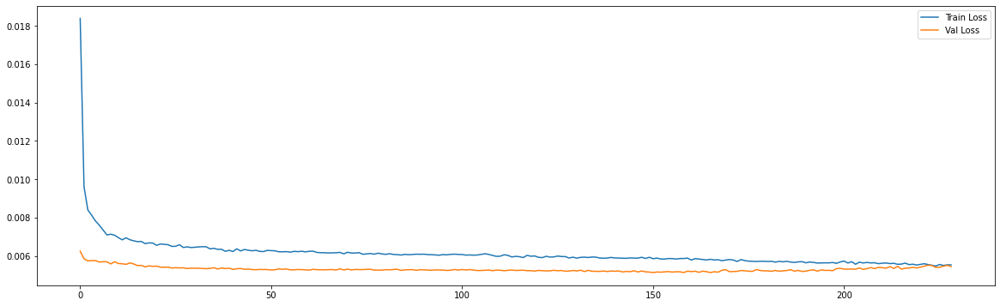

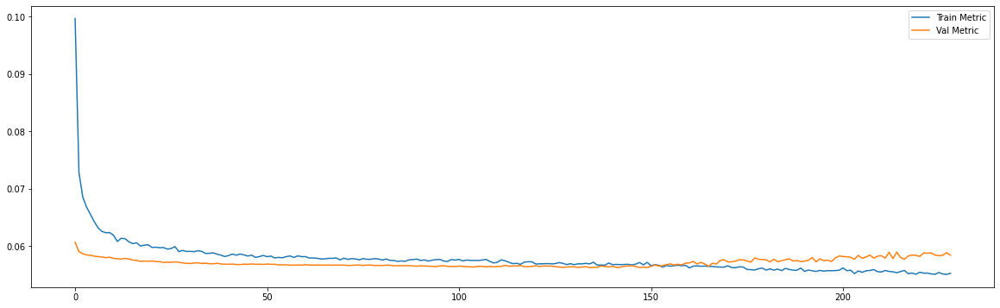

Epoch 00221: early stopping
============================model:1===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0540
loss and metric train data [0.005389384459704161, 0.05395425856113434]
9/9 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0584
loss and metric val data [0.005545145832002163, 0.05841308459639549]
9/9 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0594
loss and metric test data [0.006384721957147121, 0.059420812875032425]


'neurons': 30, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




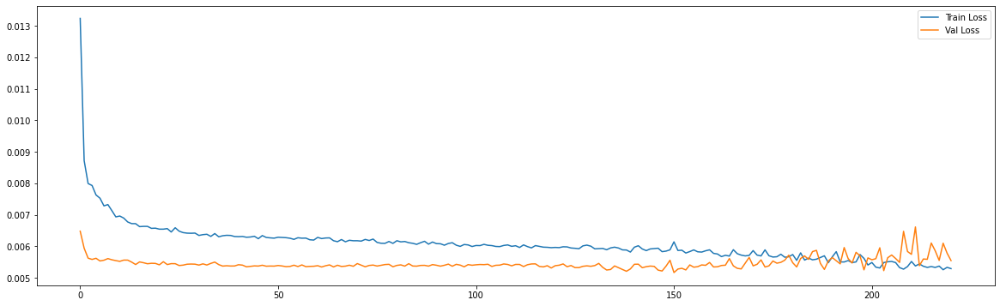

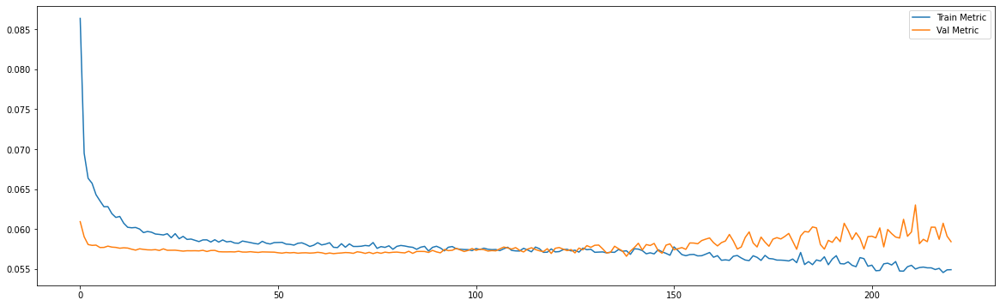

Epoch 00211: early stopping
============================model:2===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0570
loss and metric train data [0.005852473899722099, 0.056982364505529404]
8/8 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0571
loss and metric val data [0.005216748919337988, 0.05709270015358925]
8/8 [==============================] - 0s 2ms/step - loss: 0.0070 - mae: 0.0642
loss and metric test data [0.007037395145744085, 0.06416310369968414]


'neurons': 30, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




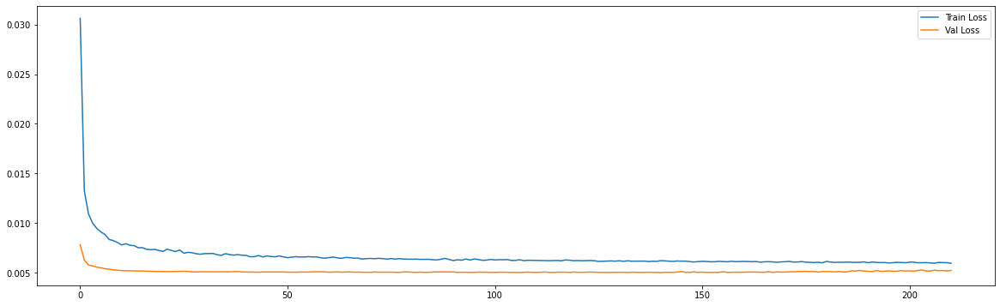

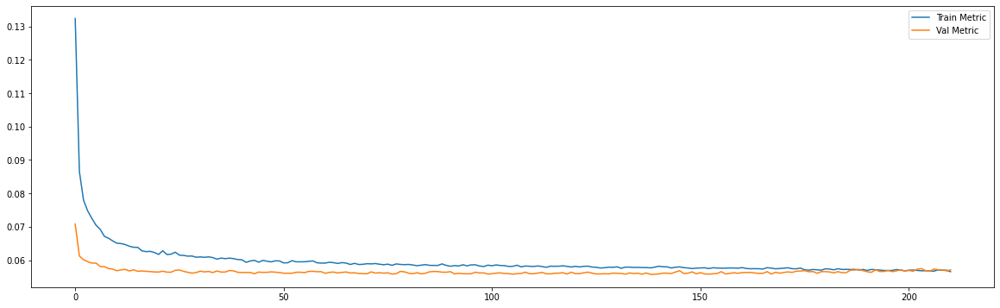

Epoch 00092: early stopping
============================model:3===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0571
loss and metric train data [0.005992448423057795, 0.05710289627313614]
8/8 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0562
loss and metric val data [0.005085928365588188, 0.05620444566011429]
8/8 [==============================] - 0s 3ms/step - loss: 0.0069 - mae: 0.0633
loss and metric test data [0.006889731623232365, 0.06325716525316238]


'neurons': 30, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




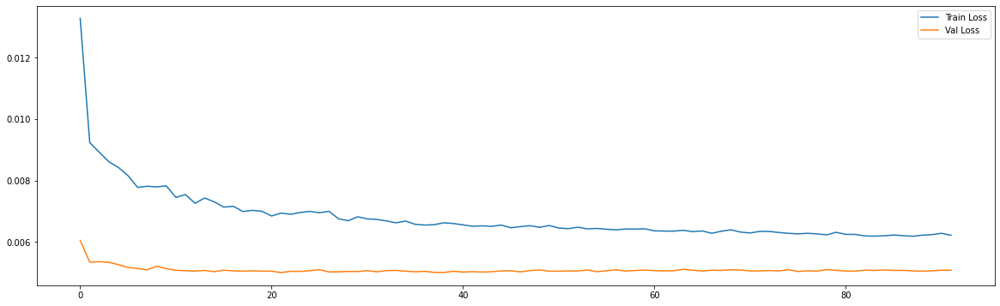

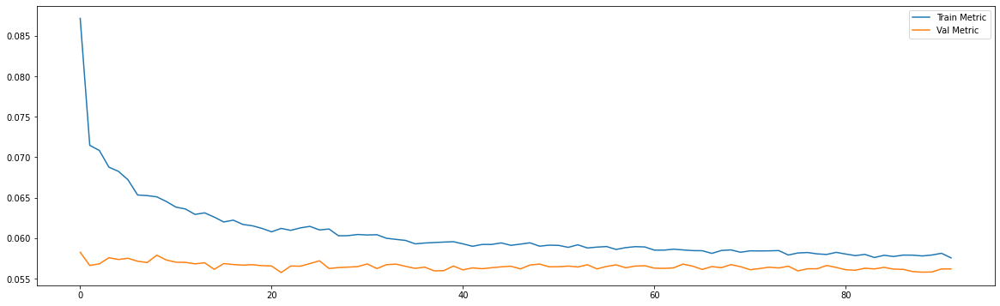

Epoch 00145: early stopping
============================model:4===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0572
loss and metric train data [0.006055670324712992, 0.057223908603191376]
7/7 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0550
loss and metric val data [0.004956673365086317, 0.055018212646245956]
7/7 [==============================] - 0s 3ms/step - loss: 0.0083 - mae: 0.0705
loss and metric test data [0.008267952129244804, 0.07045958936214447]


'neurons': 30, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




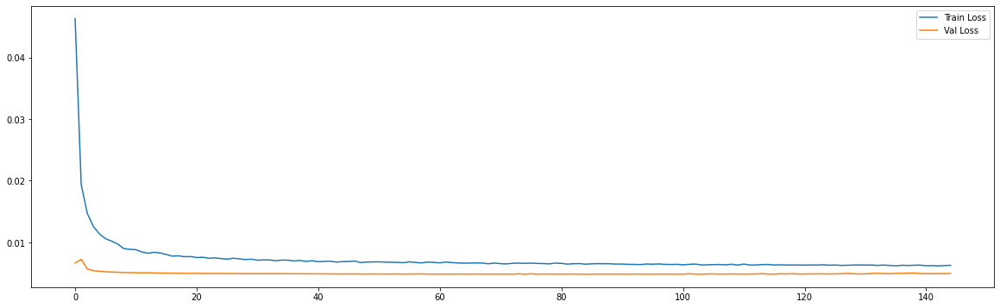

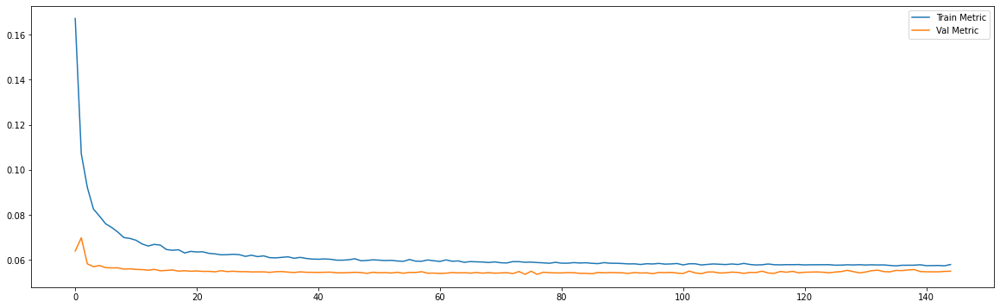

Epoch 00112: early stopping
============================model:5===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0582
loss and metric train data [0.006204019766300917, 0.05822667479515076]
7/7 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0566
loss and metric val data [0.005216345656663179, 0.0565737783908844]
7/7 [==============================] - 0s 5ms/step - loss: 0.0086 - mae: 0.0718
loss and metric test data [0.008594660088419914, 0.07183218002319336]


'neurons': 30, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




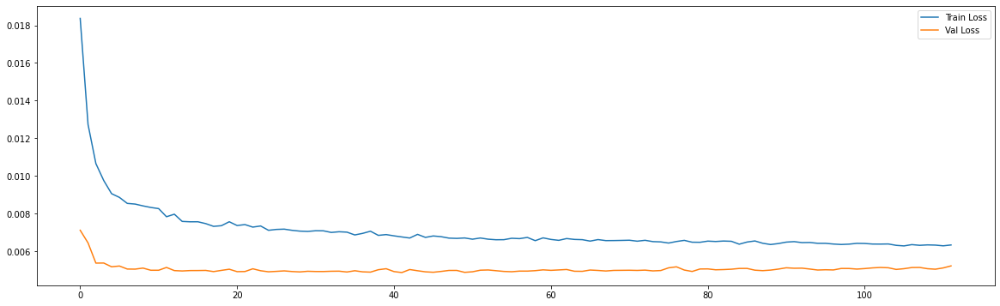

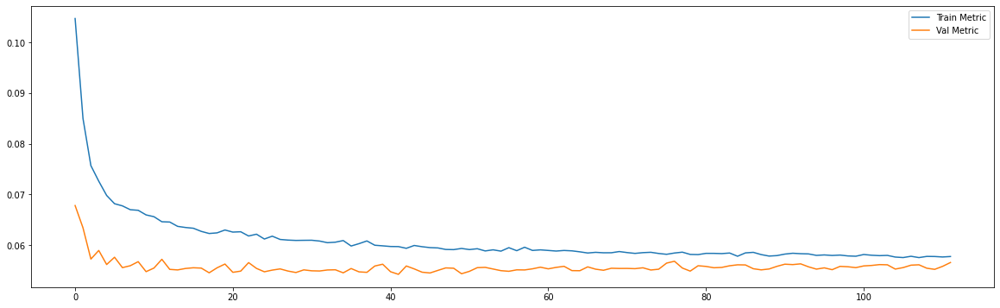

Epoch 00296: early stopping
============================model:6===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0069 - mae: 0.0610
loss and metric train data [0.006930975243449211, 0.060985714197158813]
3/3 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0666
loss and metric val data [0.007207846734672785, 0.06655719131231308]
3/3 [==============================] - 0s 4ms/step - loss: 0.0143 - mae: 0.0941
loss and metric test data [0.014266791753470898, 0.09413252025842667]


'neurons': 30, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




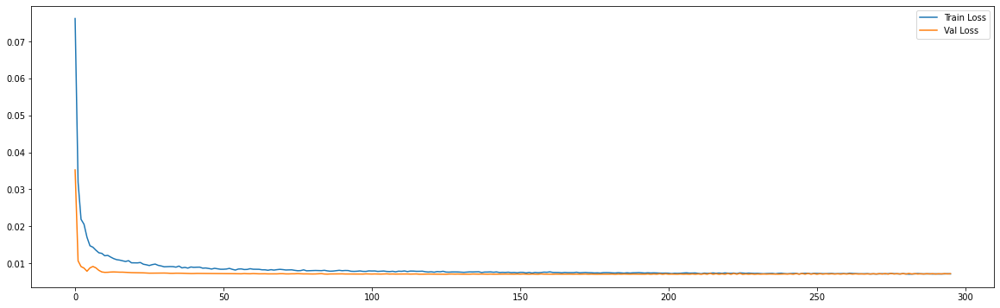

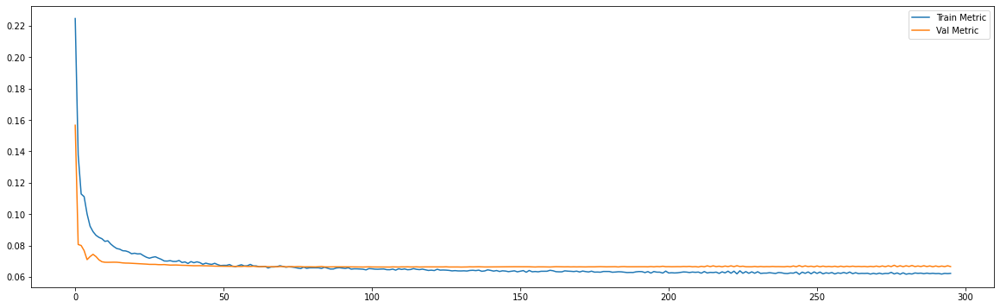

Epoch 00137: early stopping
============================model:7===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0613
loss and metric train data [0.007024412043392658, 0.061315879225730896]
3/3 [==============================] - 0s 6ms/step - loss: 0.0075 - mae: 0.0681
loss and metric val data [0.007463483605533838, 0.06809736788272858]
3/3 [==============================] - 0s 6ms/step - loss: 0.0142 - mae: 0.0930
loss and metric test data [0.01418649684637785, 0.09302336722612381]


'neurons': 30, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




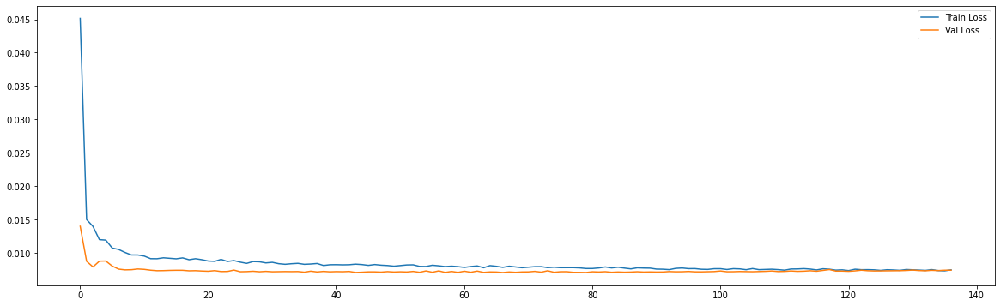

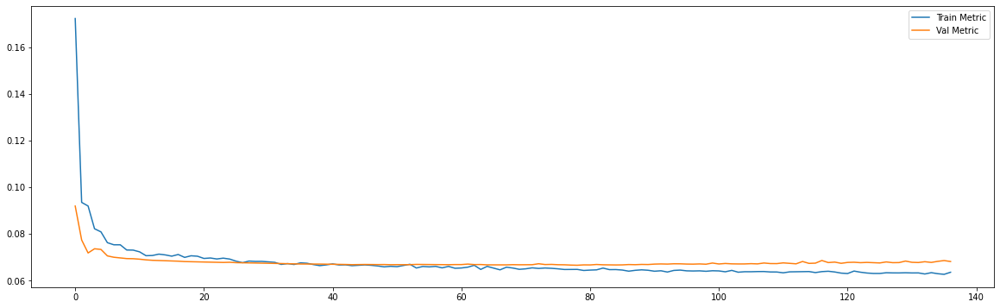

Epoch 00248: early stopping
============================model:8===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0054 - mae: 0.0550
loss and metric train data [0.005406027194112539, 0.05500349774956703]
9/9 [==============================] - 0s 2ms/step - loss: 0.0053 - mae: 0.0580
loss and metric val data [0.005294601432979107, 0.05799812451004982]
9/9 [==============================] - 0s 2ms/step - loss: 0.0059 - mae: 0.0577
loss and metric test data [0.0059242951683700085, 0.05770716071128845]


'neurons': 30, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




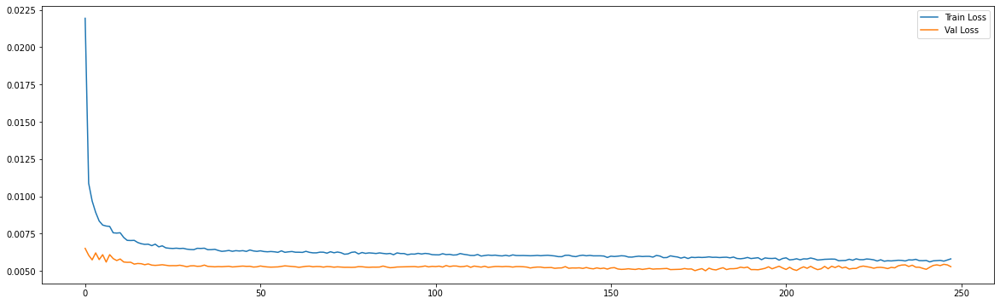

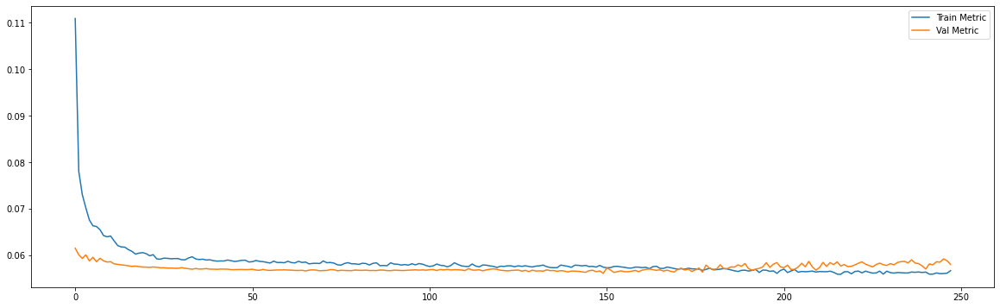

Epoch 00109: early stopping
============================model:9===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0558
loss and metric train data [0.005995471961796284, 0.055834170430898666]
9/9 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0571
loss and metric val data [0.0054009296000003815, 0.05712173134088516]
9/9 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0593
loss and metric test data [0.006386309862136841, 0.05927665904164314]


'neurons': 30, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




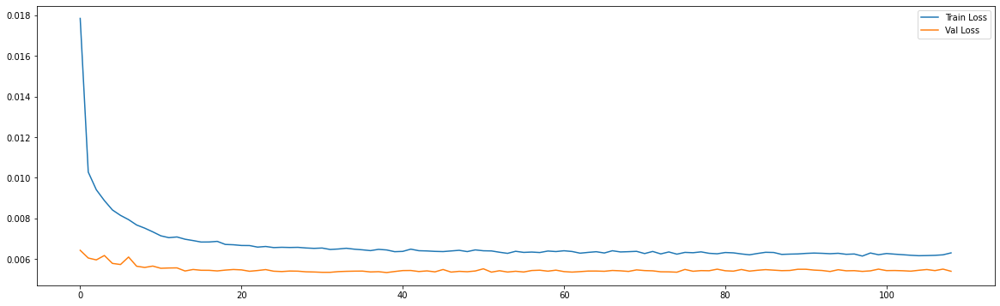

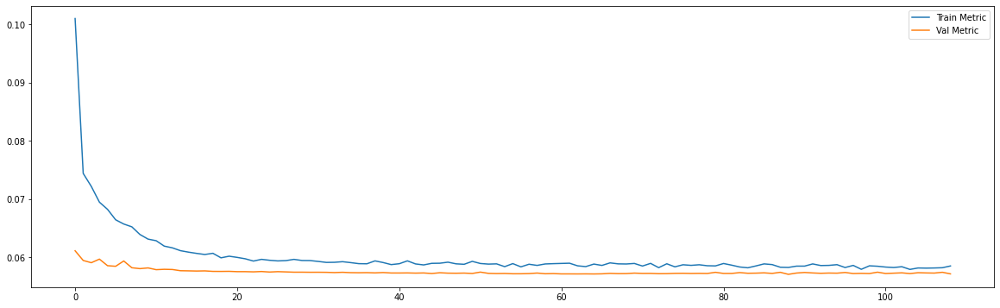

Epoch 00203: early stopping
============================model:10===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0573
loss and metric train data [0.005903512705117464, 0.0573112890124321]
8/8 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0565
loss and metric val data [0.005050943698734045, 0.05649557337164879]
8/8 [==============================] - 0s 2ms/step - loss: 0.0069 - mae: 0.0632
loss and metric test data [0.006868921685963869, 0.06316892802715302]


'neurons': 30, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




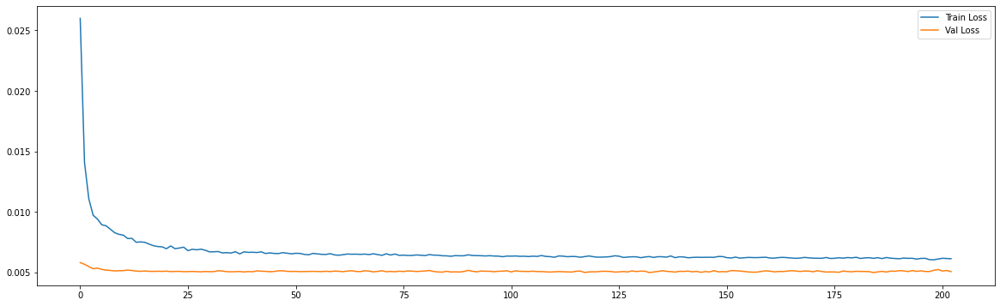

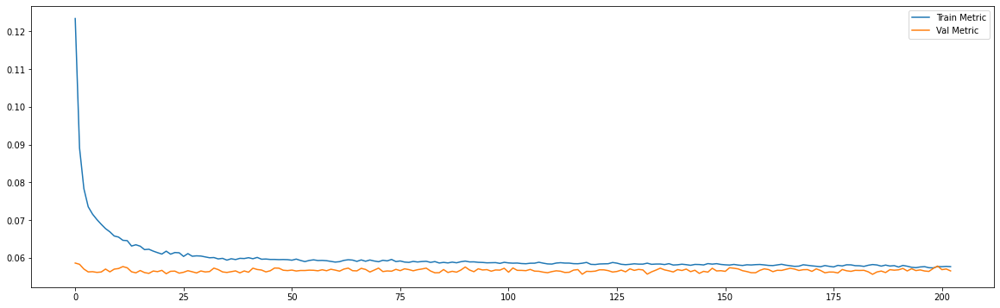

Epoch 00101: early stopping
============================model:11===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0568
loss and metric train data [0.006022030021995306, 0.056818246841430664]
8/8 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0565
loss and metric val data [0.005143818445503712, 0.05649028718471527]
8/8 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0636
loss and metric test data [0.007111974060535431, 0.06363650411367416]


'neurons': 30, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




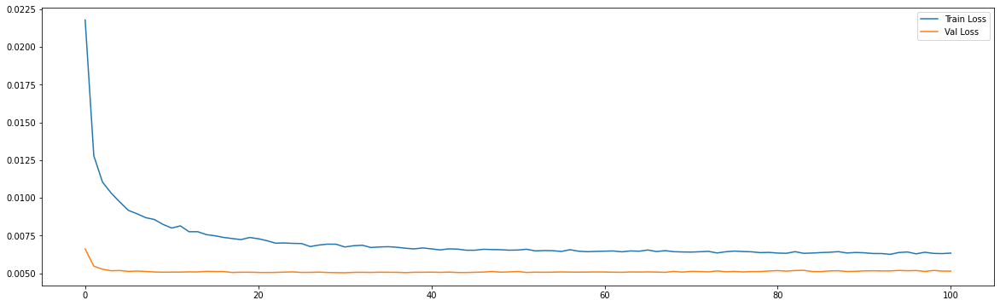

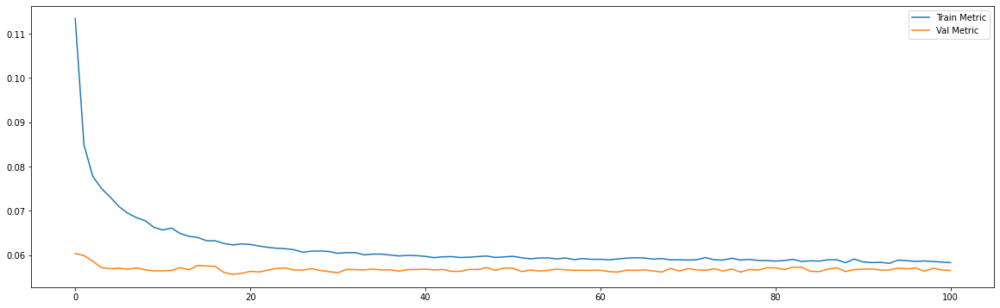

Epoch 00123: early stopping
============================model:12===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0583
loss and metric train data [0.0061852168291807175, 0.05826117843389511]
7/7 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0563
loss and metric val data [0.005106471013277769, 0.056269802153110504]
7/7 [==============================] - 0s 3ms/step - loss: 0.0085 - mae: 0.0713
loss and metric test data [0.008455322124063969, 0.07129175961017609]


'neurons': 30, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




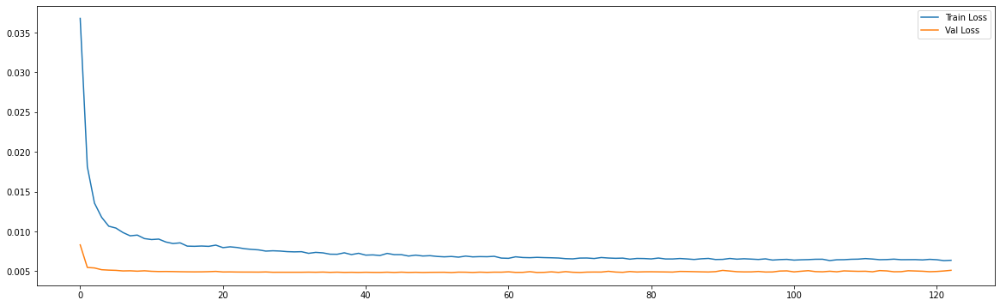

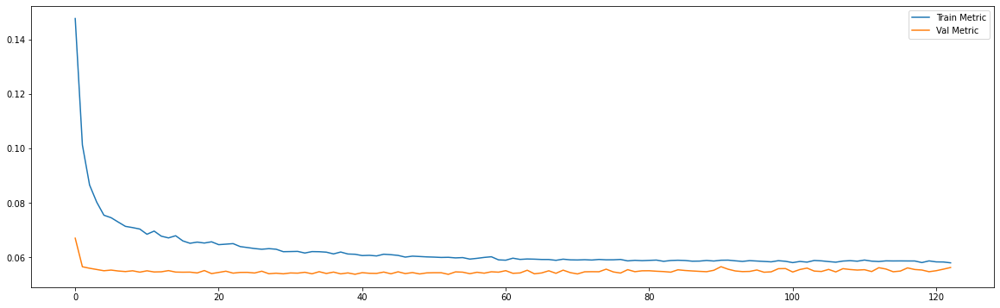

Epoch 00101: early stopping
============================model:13===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0578
loss and metric train data [0.0061837793327867985, 0.057790834456682205]
7/7 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0561
loss and metric val data [0.005101374350488186, 0.05606421083211899]
7/7 [==============================] - 0s 5ms/step - loss: 0.0086 - mae: 0.0713
loss and metric test data [0.008562090806663036, 0.07130654901266098]


'neurons': 30, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




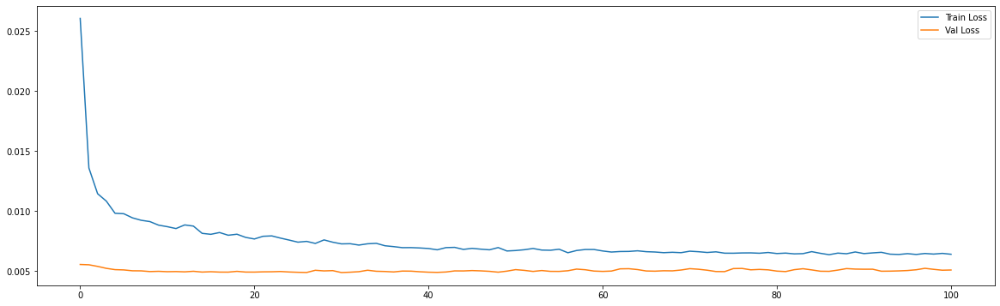

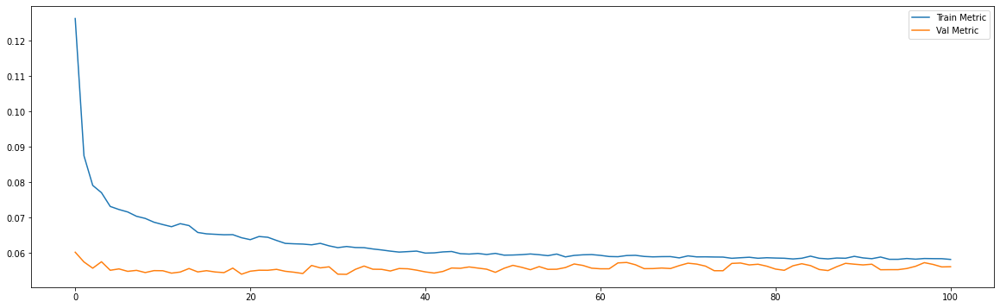

Epoch 00204: early stopping
============================model:14===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0070 - mae: 0.0616
loss and metric train data [0.007013569585978985, 0.06163937598466873]
3/3 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0670
loss and metric val data [0.007175917737185955, 0.06697339564561844]
3/3 [==============================] - 0s 4ms/step - loss: 0.0144 - mae: 0.0940
loss and metric test data [0.014390328899025917, 0.09395351260900497]


'neurons': 30, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




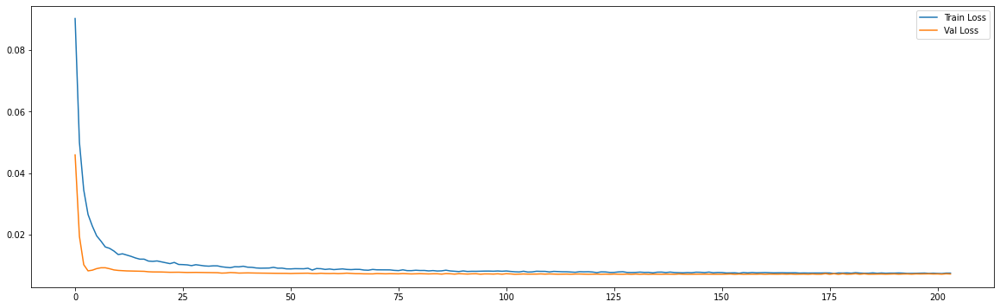

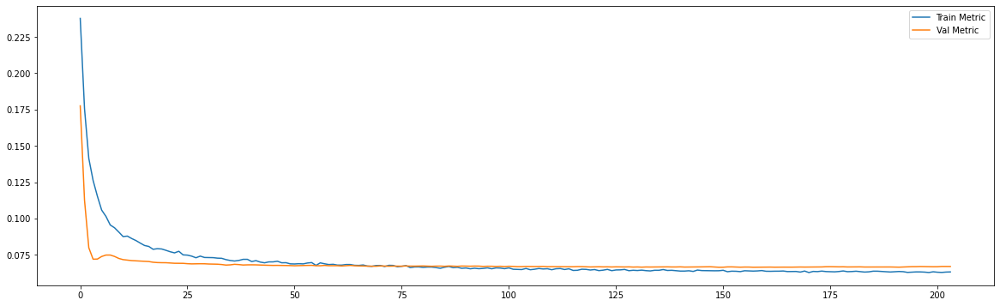

Epoch 00156: early stopping
============================model:15===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0611
loss and metric train data [0.007128054741770029, 0.06107283756136894]
3/3 [==============================] - 0s 8ms/step - loss: 0.0074 - mae: 0.0674
loss and metric val data [0.0074445465579628944, 0.06741052865982056]
3/3 [==============================] - 0s 7ms/step - loss: 0.0149 - mae: 0.0951
loss and metric test data [0.014871998690068722, 0.09512446075677872]


'neurons': 30, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




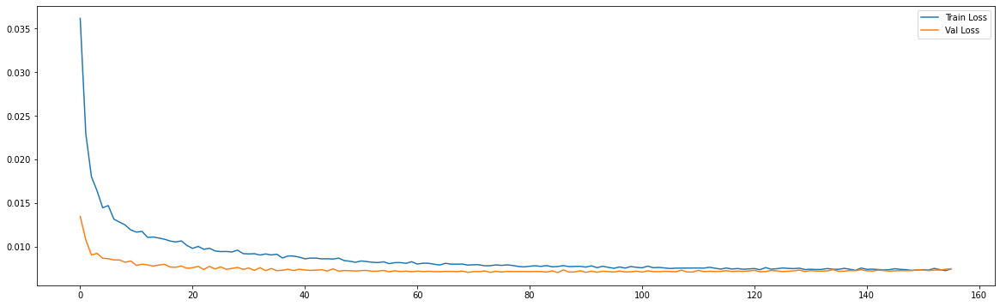

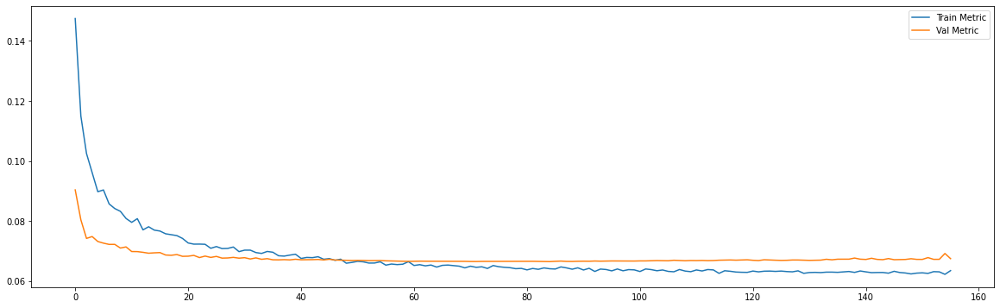

Epoch 00200: early stopping
============================model:16===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0542
loss and metric train data [0.005230612121522427, 0.05418020859360695]
9/9 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0586
loss and metric val data [0.005539478734135628, 0.058589596301317215]
9/9 [==============================] - 0s 2ms/step - loss: 0.0068 - mae: 0.0592
loss and metric test data [0.006794091779738665, 0.05916387960314751]


'neurons': 50, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




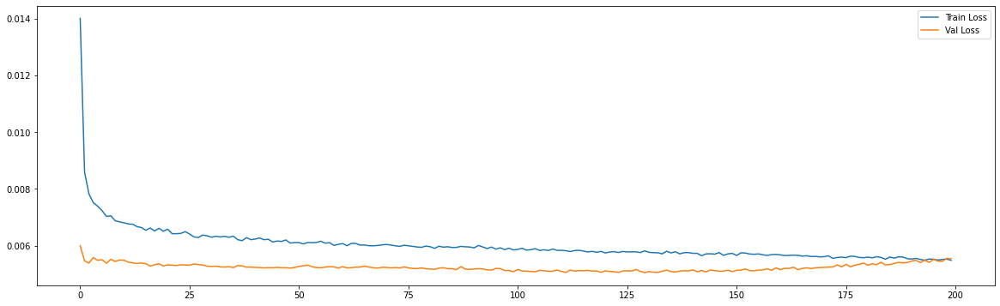

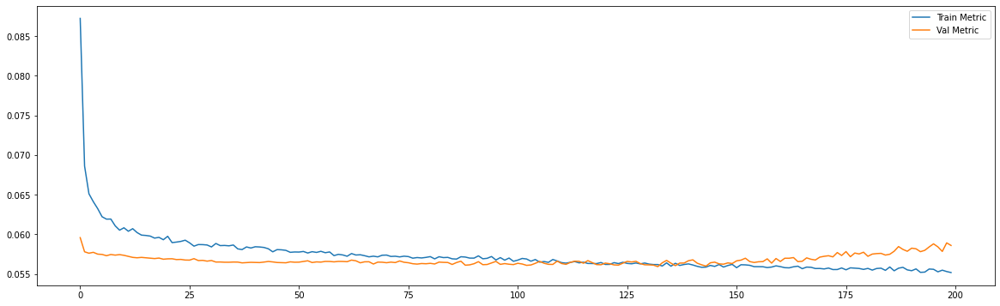

Epoch 00159: early stopping
============================model:17===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0547
loss and metric train data [0.005328700877726078, 0.054704319685697556]
9/9 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0581
loss and metric val data [0.005594309885054827, 0.05811978876590729]
9/9 [==============================] - 0s 3ms/step - loss: 0.0076 - mae: 0.0605
loss and metric test data [0.007601648569107056, 0.06048903614282608]


'neurons': 50, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




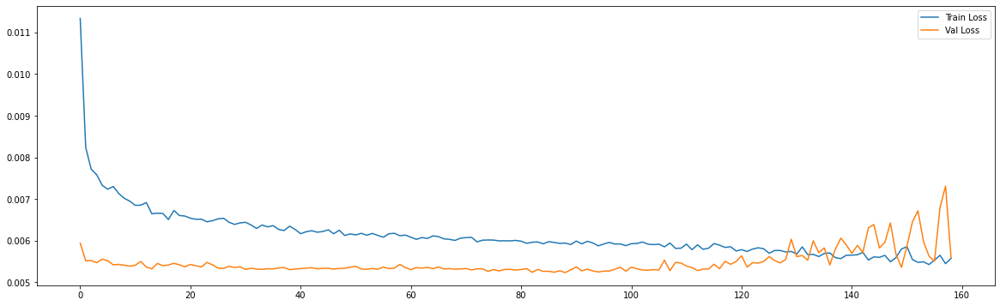

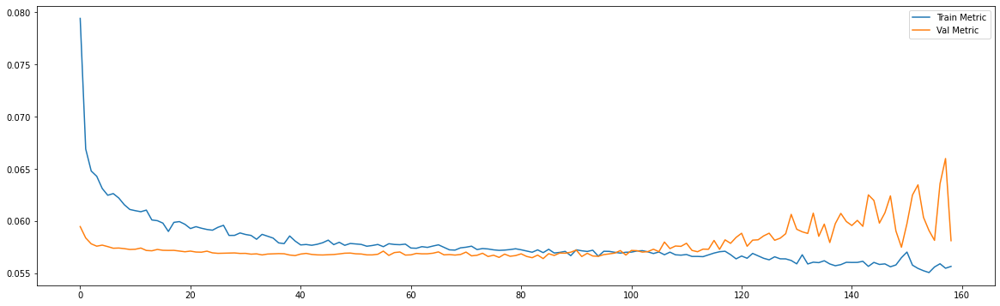

Epoch 00136: early stopping
============================model:18===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0567
loss and metric train data [0.005792468786239624, 0.05668070912361145]
8/8 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0572
loss and metric val data [0.005276333540678024, 0.057237908244132996]
8/8 [==============================] - 0s 3ms/step - loss: 0.0069 - mae: 0.0635
loss and metric test data [0.0069432612508535385, 0.06345368921756744]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




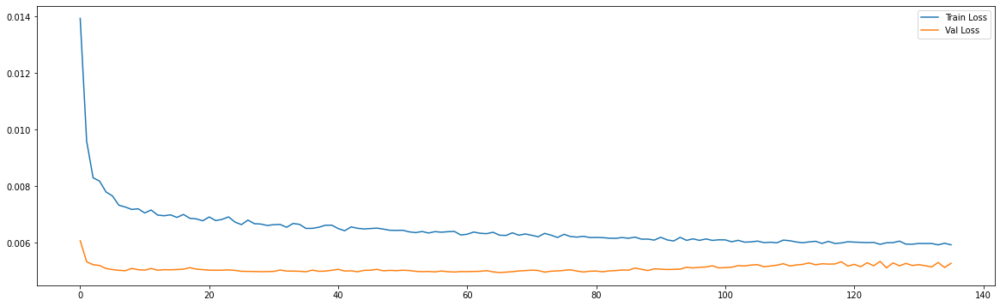

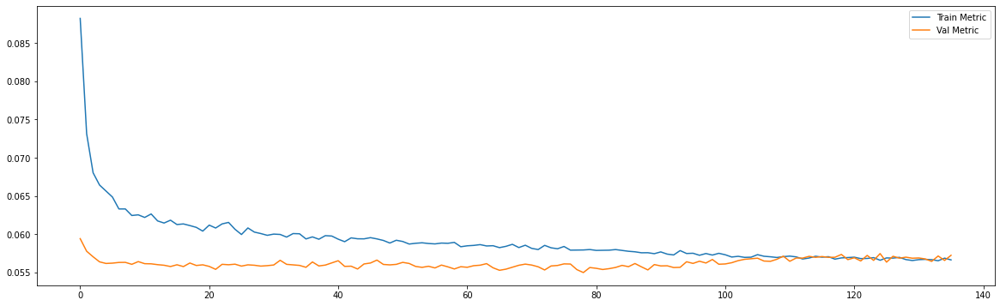

Epoch 00094: early stopping
============================model:19===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0573
loss and metric train data [0.005977957509458065, 0.05728265643119812]
8/8 [==============================] - 0s 5ms/step - loss: 0.0053 - mae: 0.0571
loss and metric val data [0.005263869185000658, 0.057130709290504456]
8/8 [==============================] - 0s 3ms/step - loss: 0.0070 - mae: 0.0640
loss and metric test data [0.0070400298573076725, 0.06399806588888168]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




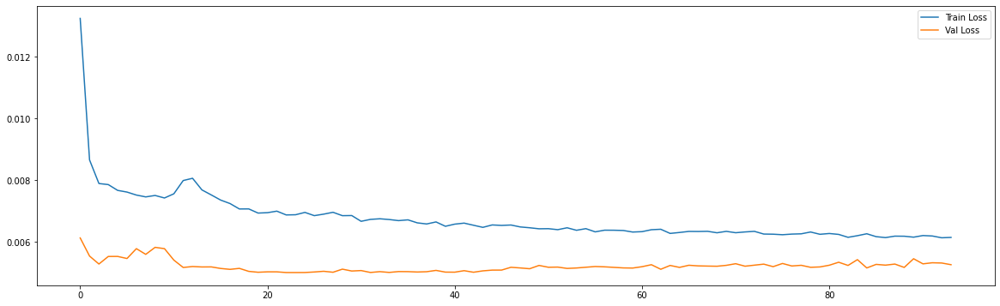

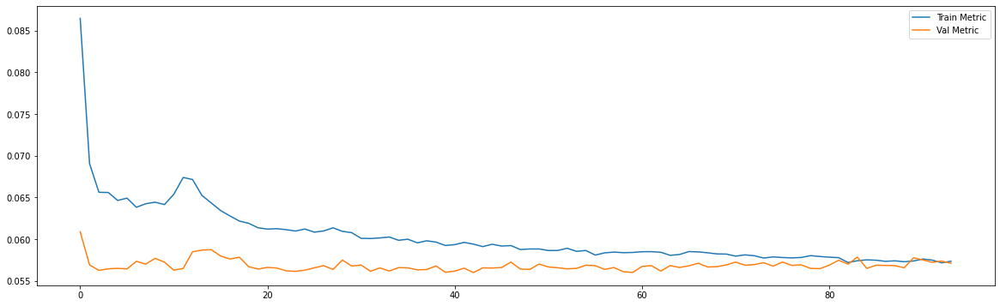

Epoch 00115: early stopping
============================model:20===========================
39/39 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0570
loss and metric train data [0.0059647271409630775, 0.05698719993233681]
7/7 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0561
loss and metric val data [0.005174982361495495, 0.056090015918016434]
7/7 [==============================] - 0s 4ms/step - loss: 0.0085 - mae: 0.0720
loss and metric test data [0.008486904203891754, 0.07200441509485245]


'neurons': 50, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




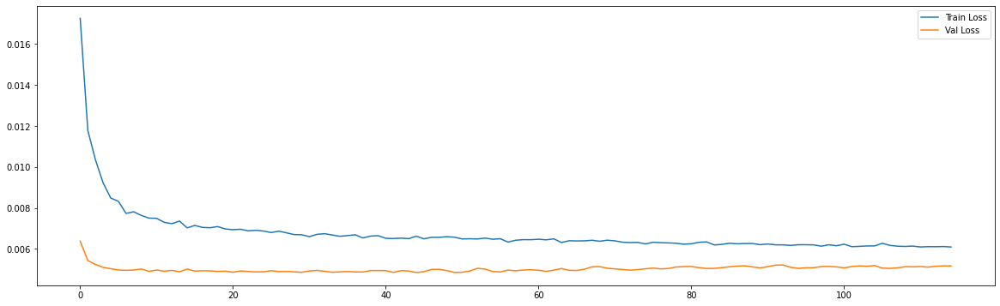

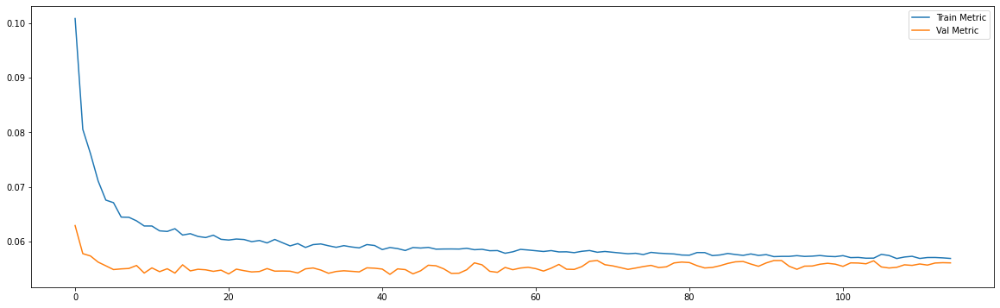

Epoch 00117: early stopping
============================model:21===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0059 - mae: 0.0566
loss and metric train data [0.005919665098190308, 0.05662626773118973]
7/7 [==============================] - 0s 5ms/step - loss: 0.0052 - mae: 0.0558
loss and metric val data [0.005219066049903631, 0.05580690875649452]
7/7 [==============================] - 0s 5ms/step - loss: 0.0087 - mae: 0.0733
loss and metric test data [0.008723617531359196, 0.07331442087888718]


'neurons': 50, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




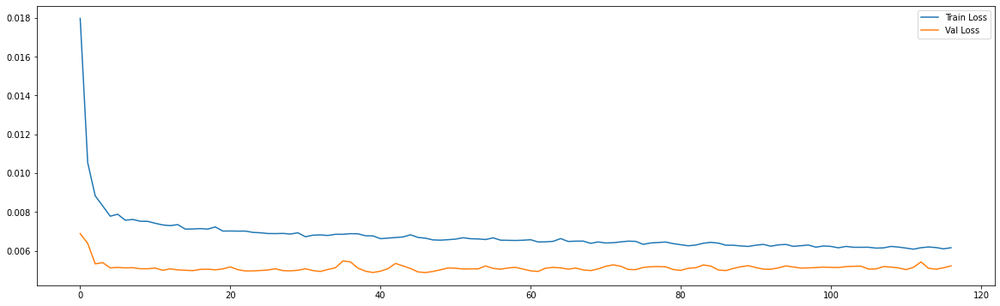

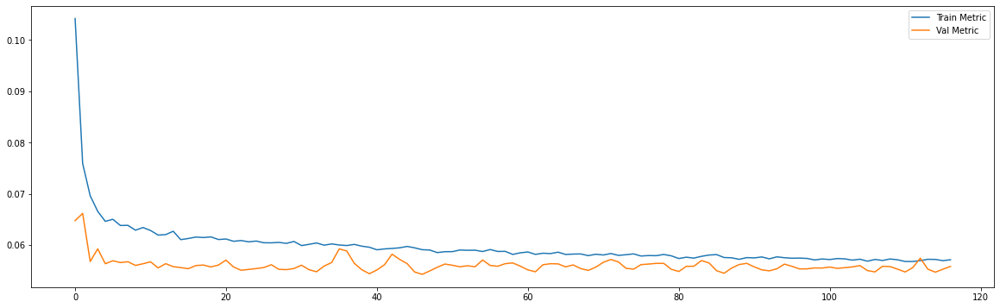

Epoch 00201: early stopping
============================model:22===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0069 - mae: 0.0614
loss and metric train data [0.006892640609294176, 0.061401572078466415]
3/3 [==============================] - 0s 6ms/step - loss: 0.0072 - mae: 0.0670
loss and metric val data [0.007226219400763512, 0.06695500761270523]
3/3 [==============================] - 0s 4ms/step - loss: 0.0139 - mae: 0.0935
loss and metric test data [0.013879728503525257, 0.09349609166383743]


'neurons': 50, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




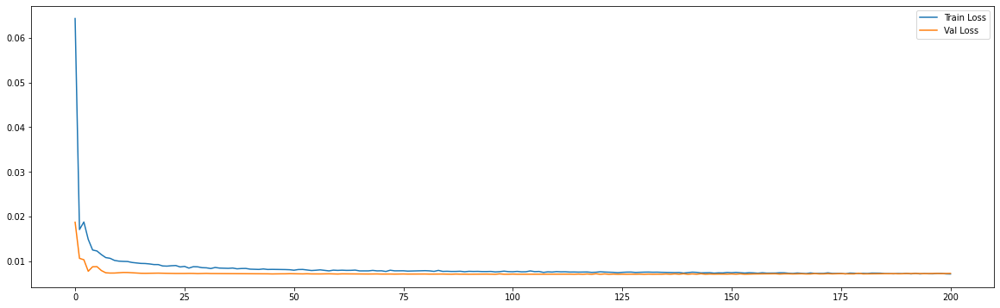

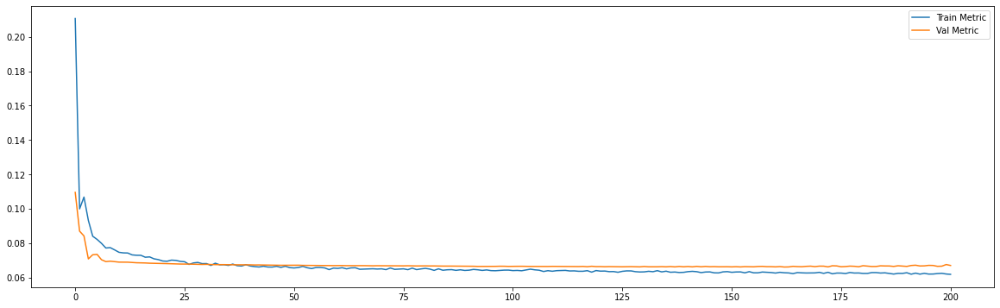

Epoch 00142: early stopping
============================model:23===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0619
loss and metric train data [0.007027520332485437, 0.061947762966156006]
3/3 [==============================] - 0s 6ms/step - loss: 0.0074 - mae: 0.0679
loss and metric val data [0.007410782855004072, 0.06794766336679459]
3/3 [==============================] - 0s 5ms/step - loss: 0.0140 - mae: 0.0931
loss and metric test data [0.014046339318156242, 0.09308435767889023]


'neurons': 50, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




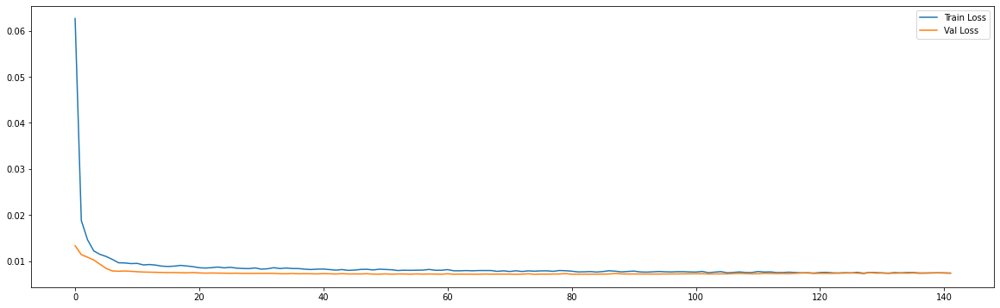

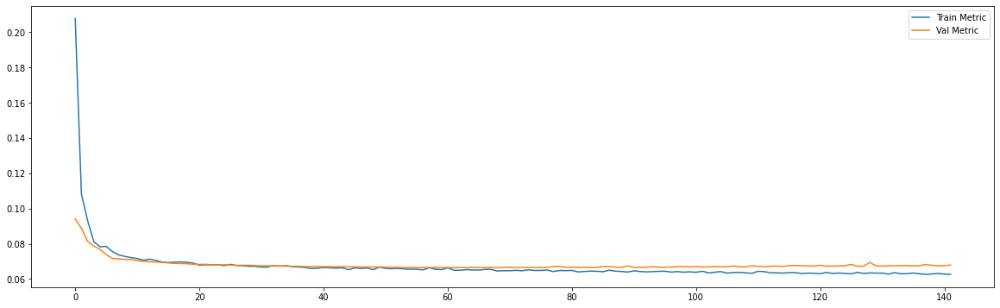

Epoch 00289: early stopping
============================model:24===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0050 - mae: 0.0541
loss and metric train data [0.005039116833359003, 0.05405890569090843]
9/9 [==============================] - 0s 2ms/step - loss: 0.0064 - mae: 0.0631
loss and metric val data [0.006393022369593382, 0.06307760626077652]
9/9 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0605
loss and metric test data [0.0074321129359304905, 0.06052420660853386]


'neurons': 50, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




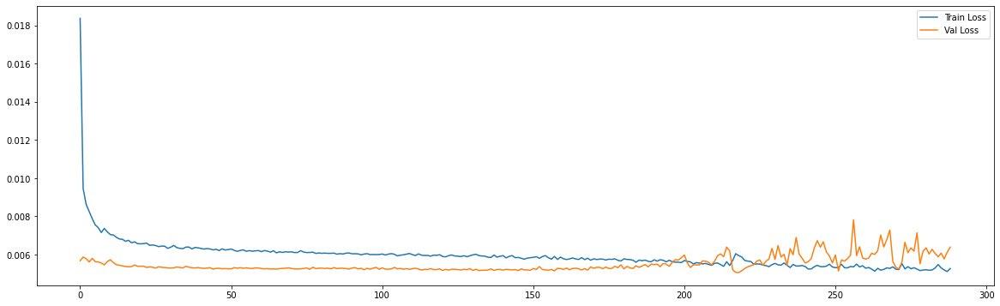

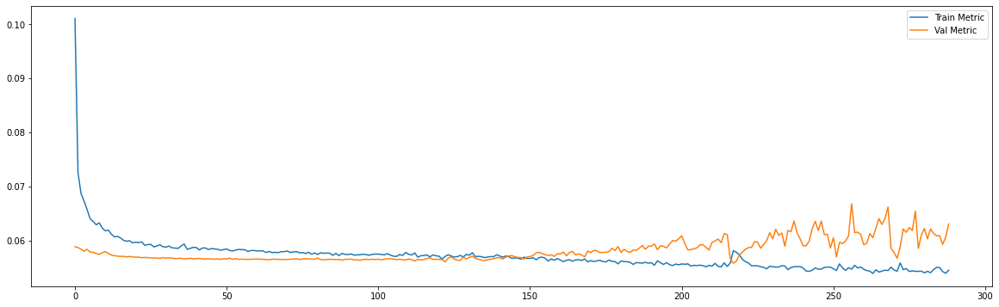

Epoch 00221: early stopping
============================model:25===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0534
loss and metric train data [0.0050499895587563515, 0.05343138426542282]
9/9 [==============================] - 0s 3ms/step - loss: 0.0061 - mae: 0.0605
loss and metric val data [0.0060583362355828285, 0.06052720174193382]
9/9 [==============================] - 0s 3ms/step - loss: 0.0083 - mae: 0.0624
loss and metric test data [0.008255443535745144, 0.06241534277796745]


'neurons': 50, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




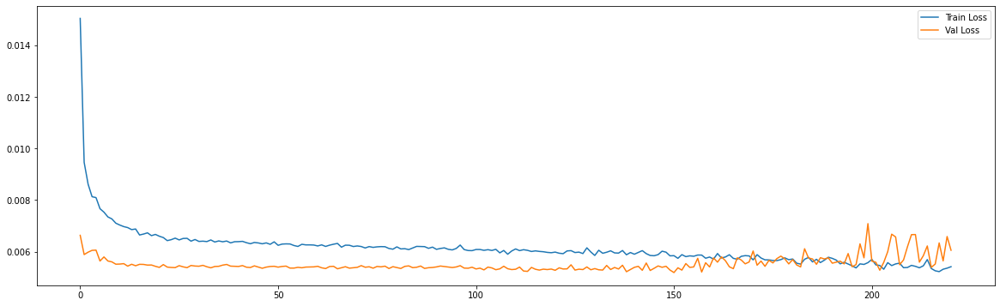

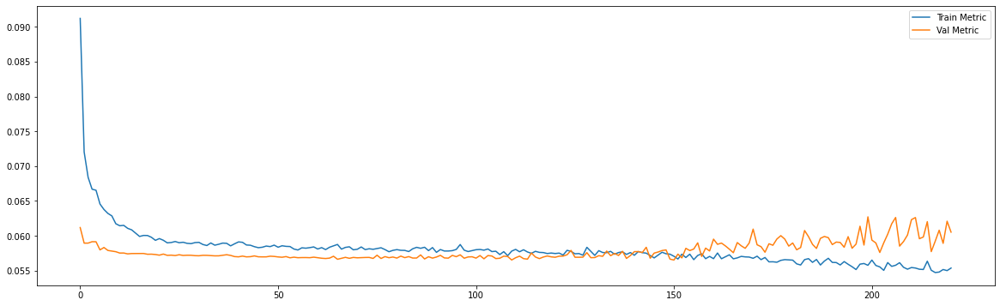

Epoch 00154: early stopping
============================model:26===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0577
loss and metric train data [0.005924941971898079, 0.0577378049492836]
8/8 [==============================] - 0s 2ms/step - loss: 0.0052 - mae: 0.0574
loss and metric val data [0.005192499607801437, 0.05735804885625839]
8/8 [==============================] - 0s 3ms/step - loss: 0.0070 - mae: 0.0640
loss and metric test data [0.007032711990177631, 0.06397829949855804]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




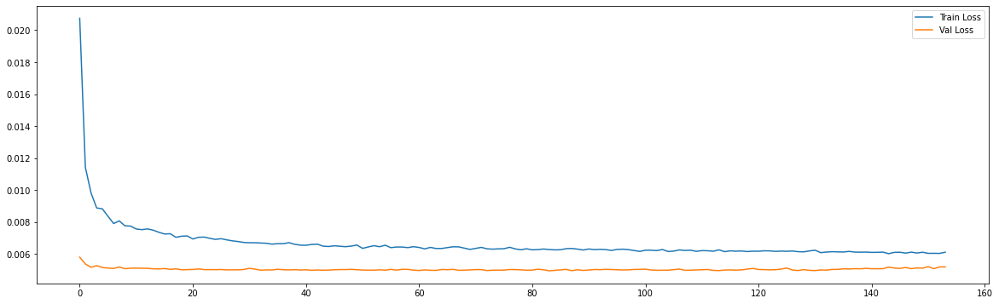

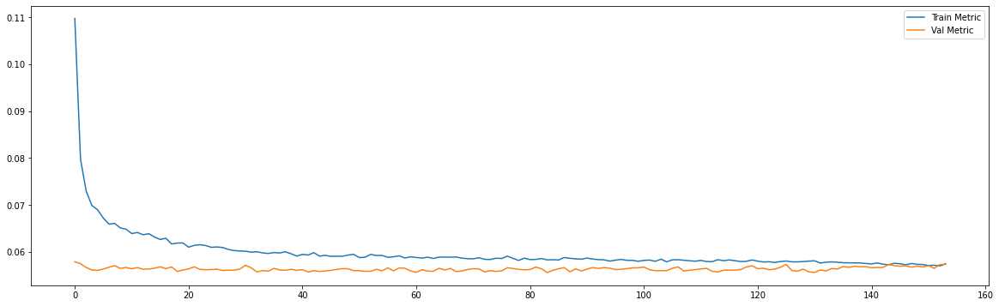

Epoch 00108: early stopping
============================model:27===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0060 - mae: 0.0574
loss and metric train data [0.0060201422311365604, 0.05744308605790138]
8/8 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0567
loss and metric val data [0.005143752321600914, 0.05670402944087982]
8/8 [==============================] - 0s 3ms/step - loss: 0.0070 - mae: 0.0637
loss and metric test data [0.0069566937163472176, 0.06366142630577087]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




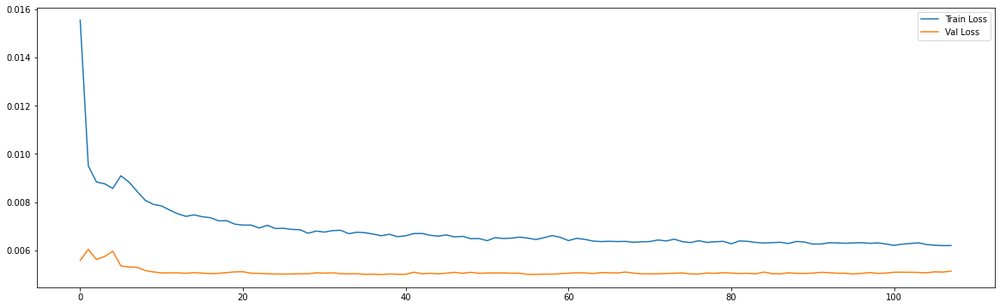

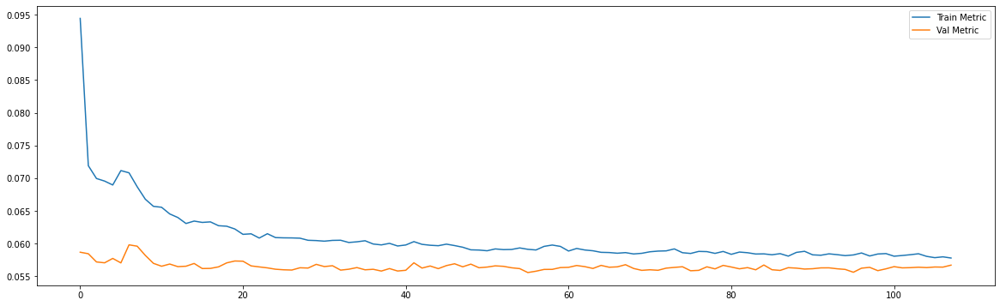

Epoch 00110: early stopping
============================model:28===========================
39/39 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0576
loss and metric train data [0.006077023688703775, 0.05763343721628189]
7/7 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0560
loss and metric val data [0.005107203498482704, 0.055956270545721054]
7/7 [==============================] - 0s 3ms/step - loss: 0.0084 - mae: 0.0714
loss and metric test data [0.008428432047367096, 0.07139047980308533]


'neurons': 50, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




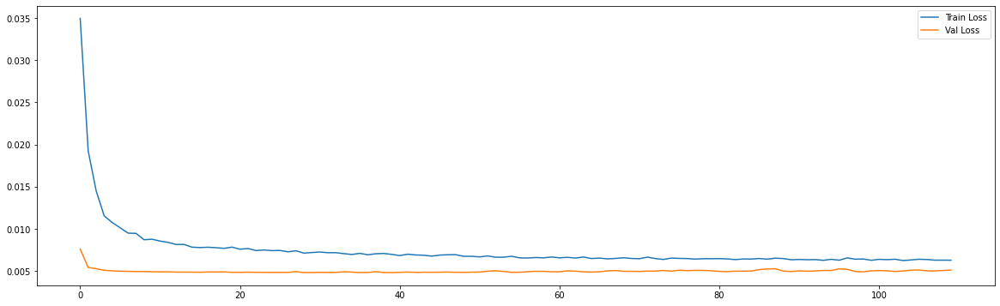

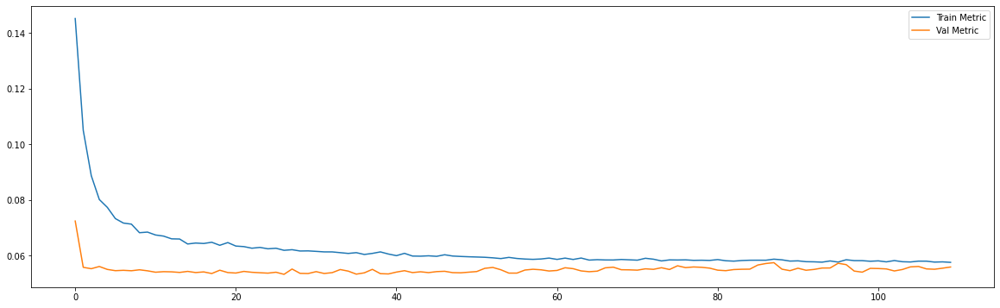

Epoch 00086: early stopping
============================model:29===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0061 - mae: 0.0573
loss and metric train data [0.006123955361545086, 0.057288628071546555]
7/7 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0556
loss and metric val data [0.0050679538398981094, 0.05556415393948555]
7/7 [==============================] - 0s 4ms/step - loss: 0.0086 - mae: 0.0715
loss and metric test data [0.008562923409044743, 0.07150396704673767]


'neurons': 50, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




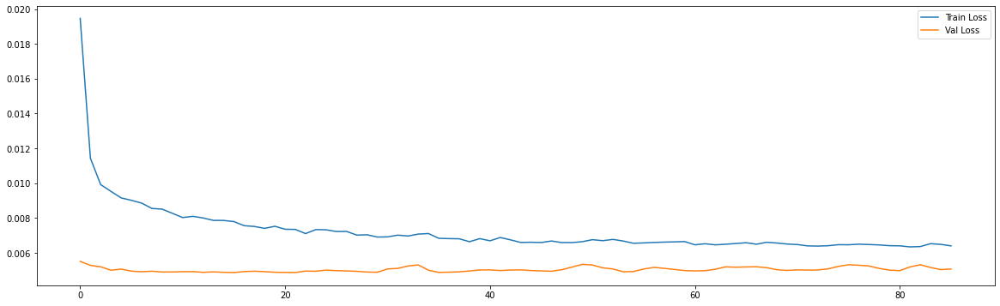

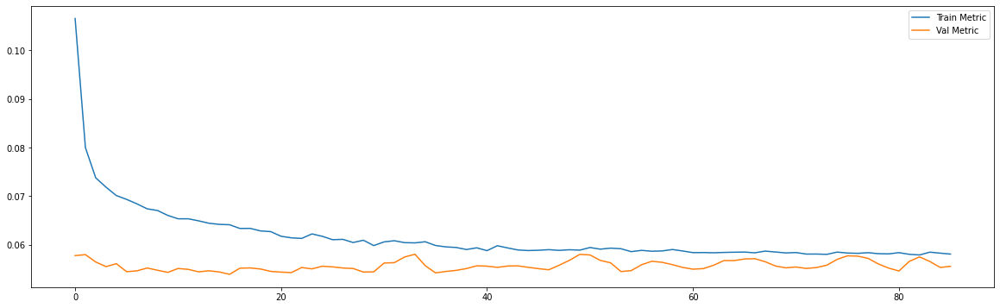

Epoch 00198: early stopping
============================model:30===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0069 - mae: 0.0615
loss and metric train data [0.006938681472092867, 0.06147192046046257]
3/3 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0665
loss and metric val data [0.007125220727175474, 0.06649549305438995]
3/3 [==============================] - 0s 4ms/step - loss: 0.0141 - mae: 0.0934
loss and metric test data [0.014103717170655727, 0.09339258819818497]


'neurons': 50, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




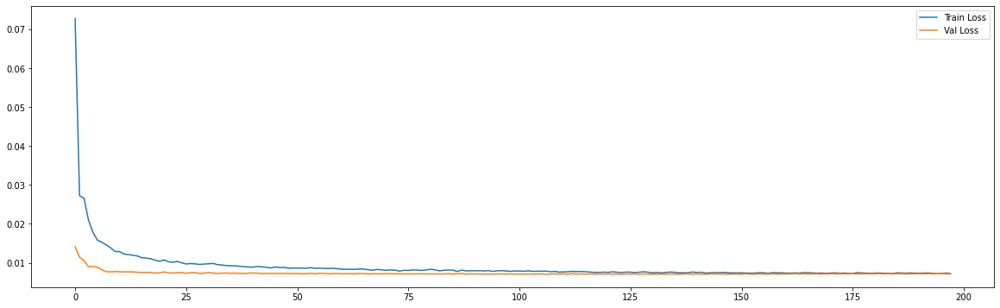

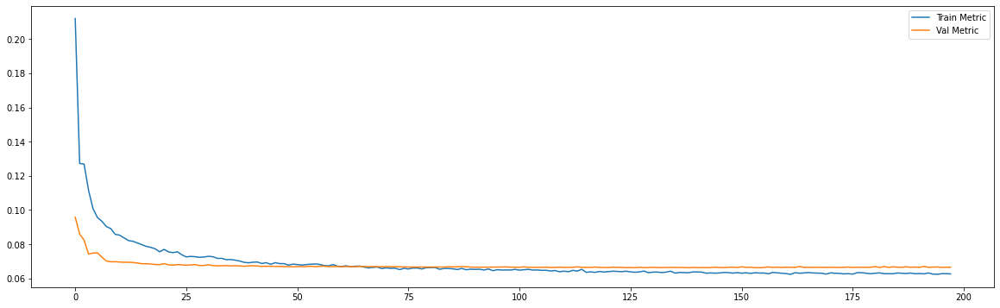

Epoch 00155: early stopping
============================model:31===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0616
loss and metric train data [0.007050044368952513, 0.061565667390823364]
3/3 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0670
loss and metric val data [0.007215533405542374, 0.06695970892906189]
3/3 [==============================] - 0s 5ms/step - loss: 0.0144 - mae: 0.0936
loss and metric test data [0.01435077004134655, 0.09356880933046341]


'neurons': 50, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




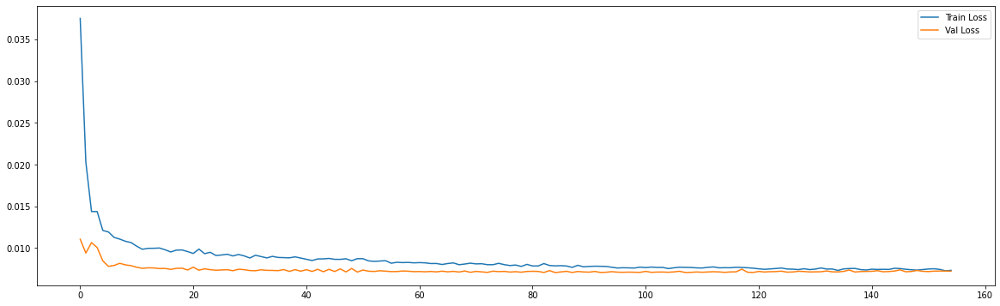

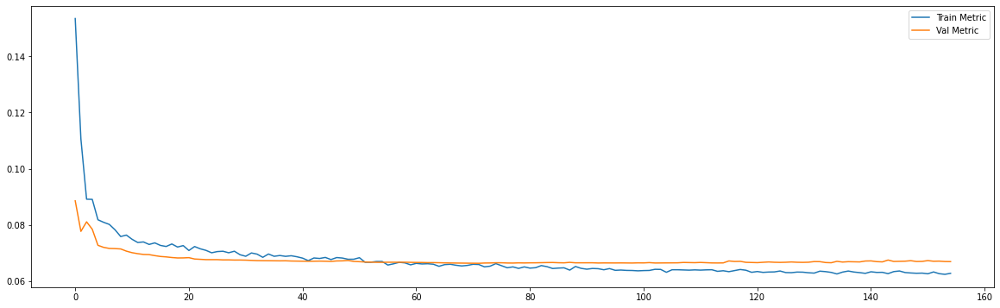

In [17]:
future_steps = 5
n_features = 12

neurons_list = [30,50]
dropout_list = [0.2,0.4]
time_steps_list = [30,60,120,240]
lr_list = [0.001]
models = {}
i=0
for neurons in neurons_list:
  for dropout in dropout_list:
    for time_steps in time_steps_list:
      for lr in lr_list:
        x_train,x_test,x_val,y_train,y_val,y_test = Regressor(future_steps = future_steps,time_steps = time_steps,n_features = n_features,df_train = df_train_norm,df_val = df_val_norm,df_test = df_test_norm)

        models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':time_steps, 'learning_rate':lr}
        models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'learning_rate':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,time_steps,lr,1)

        # The LSTM architecture
        models[i]['model'] = Sequential()
        models[i]['model'].add(LSTM(units=neurons, return_sequences=False,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(Dense(units=future_steps))

        #Compiling the LSTM
        adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
        models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

        # early stop
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 70)

        #Fitting to traning set
        history = models[i]['model'].fit(x_train, y_train, validation_data = (x_val,y_val), epochs = 500, batch_size = time_steps, verbose = 0, shuffle = False, callbacks = [es])

        print('============================model:{}==========================='.format(i))

          
        print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
        print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
        print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
        print('\n')

        print(models[i]['resumo'])
        print('\n')

        plt.figure(figsize=(20,6))
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.legend(['Train Loss', 'Val Loss'])

        plt.figure(figsize=(20,6))
        plt.plot(history.history['mae'])
        plt.plot(history.history['val_mae'])
        plt.legend(['Train Metric', 'Val Metric'])
        plt.show()

        i+=1


        models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':time_steps}
        models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,time_steps,2)

        # The LSTM architecture
        models[i]['model'] = Sequential()
        models[i]['model'].add(LSTM(units=neurons, return_sequences=True,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(LSTM(units=neurons, return_sequences=False))
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(Dense(units=future_steps))

        #Compiling the LSTM
        adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
        models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

         # early stop
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 70)

        #Fitting to traning set
        history = models[i]['model'].fit(x_train, y_train, validation_data = (x_val,y_val), epochs = 500, batch_size = time_steps, verbose = 0, shuffle = False, callbacks = [es])

        print('============================model:{}==========================='.format(i))

          
        print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
        print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
        print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
        print('\n')

        print(models[i]['resumo'])
        print('\n')

        plt.figure(figsize=(20,6))
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.legend(['Train Loss', 'Val Loss'])

        plt.figure(figsize=(20,6))
        plt.plot(history.history['mae'])
        plt.plot(history.history['val_mae'])
        plt.legend(['Train Metric', 'Val Metric'])
        plt.show()

        i+=1

# Outliers Treatment

In [0]:
df_daily = pd.read_csv('/content/drive/My Drive/ML Projects/Pharma Sales/Data/salesdaily.csv')
df_daily = df_daily['N02BE']

In [19]:
df_train,df_val,df_test = dataSplit(df = df_daily,train_percent = 0.7,val_percent = 0.15)

(1474,)
(316,)
(316,)


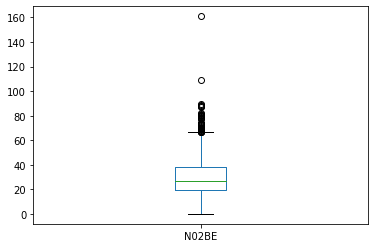

In [20]:
df_train.plot.box()

In [21]:
print(df_train[df_train>df_train.quantile(0.8)].shape)
print(df_train[df_train>df_train.quantile(0.9)].shape)
print(df_train[df_train>df_train.quantile(0.95)].shape)

(295,)
(148,)
(74,)


In [0]:
df_train[df_train>df_train.quantile(0.9)] = df_train.quantile(0.9)

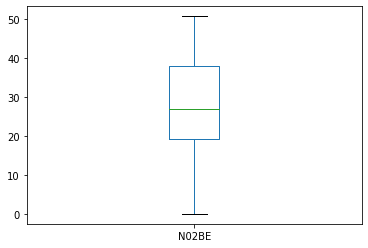

In [23]:
df_train.plot.box()

In [24]:
df_train_norm,df_val_norm,df_test_norm = normalizing_data(df_train,df_val,df_test)

[1.]
[0.]


[1.46937168]
[0.]


[1.97163679]
[0.]
-------------------------
(1474, 1)
(316, 1)
(316, 1)


Epoch 00306: early stopping
============================model:0===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0379 - mae: 0.1535
loss and metric train data [0.03788328543305397, 0.15347695350646973]
9/9 [==============================] - 0s 2ms/step - loss: 0.0578 - mae: 0.1860
loss and metric val data [0.057784173637628555, 0.1859932839870453]
9/9 [==============================] - 0s 2ms/step - loss: 0.0680 - mae: 0.1915
loss and metric test data [0.06799209117889404, 0.1914597600698471]


'neurons': 30, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




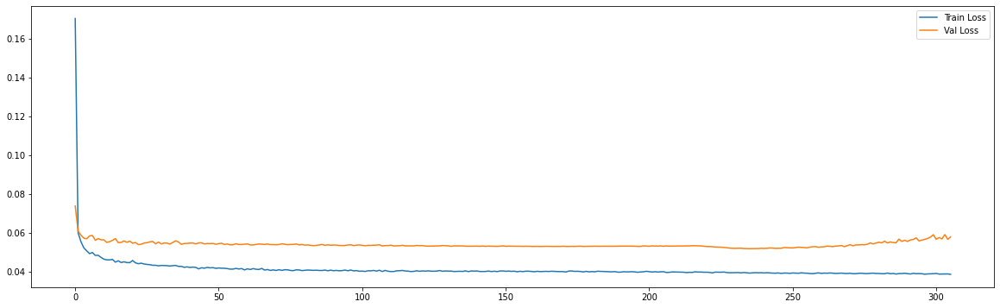

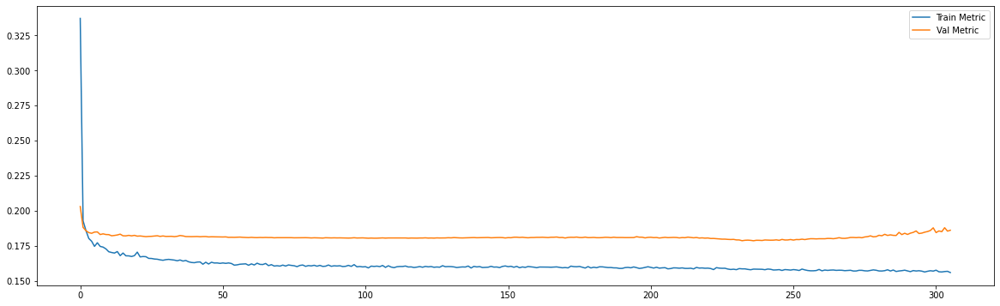

Epoch 00118: early stopping
============================model:1===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0395 - mae: 0.1577
loss and metric train data [0.0395025834441185, 0.15771529078483582]
9/9 [==============================] - 0s 3ms/step - loss: 0.0538 - mae: 0.1802
loss and metric val data [0.053842756897211075, 0.18015466630458832]
9/9 [==============================] - 0s 3ms/step - loss: 0.0645 - mae: 0.1846
loss and metric test data [0.06445708125829697, 0.1846163123846054]


'neurons': 30, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




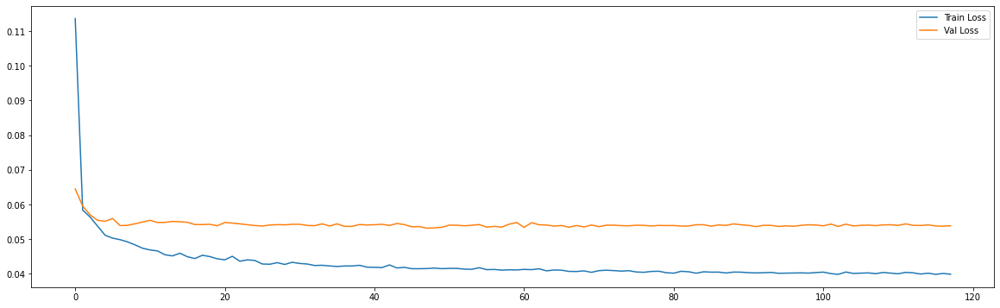

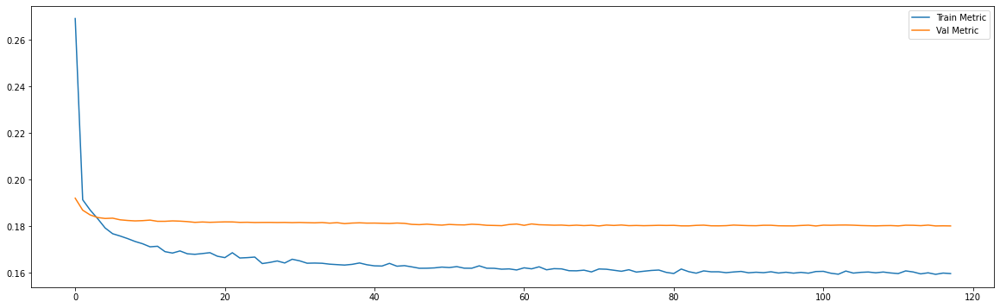

Epoch 00099: early stopping
============================model:2===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0387 - mae: 0.1564
loss and metric train data [0.038670048117637634, 0.1564003974199295]
8/8 [==============================] - 0s 3ms/step - loss: 0.0508 - mae: 0.1754
loss and metric val data [0.050840284675359726, 0.17539510130882263]
8/8 [==============================] - 0s 3ms/step - loss: 0.0693 - mae: 0.1973
loss and metric test data [0.06933861970901489, 0.19730426371097565]


'neurons': 30, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




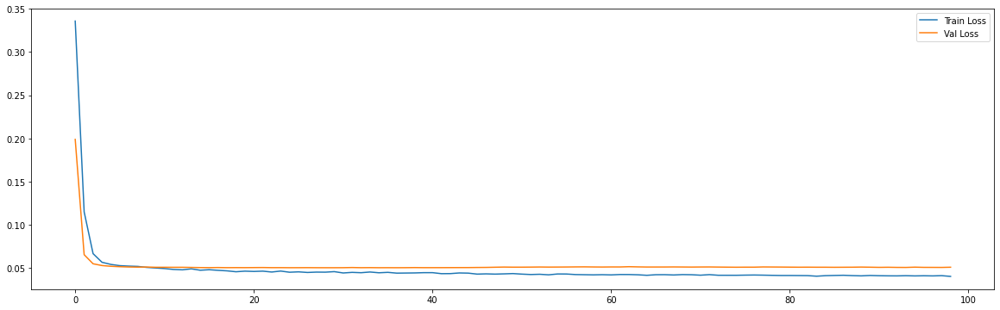

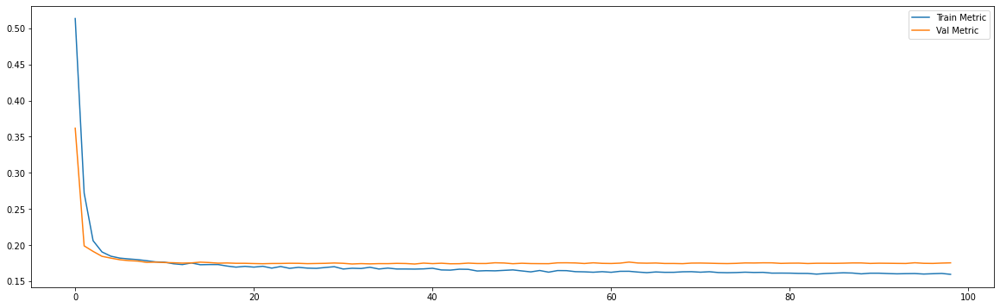

Epoch 00097: early stopping
============================model:3===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0387 - mae: 0.1565
loss and metric train data [0.03867467865347862, 0.15653975307941437]
8/8 [==============================] - 0s 4ms/step - loss: 0.0504 - mae: 0.1750
loss and metric val data [0.05036439746618271, 0.17499902844429016]
8/8 [==============================] - 0s 3ms/step - loss: 0.0700 - mae: 0.1965
loss and metric test data [0.07000041007995605, 0.19654959440231323]


'neurons': 30, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




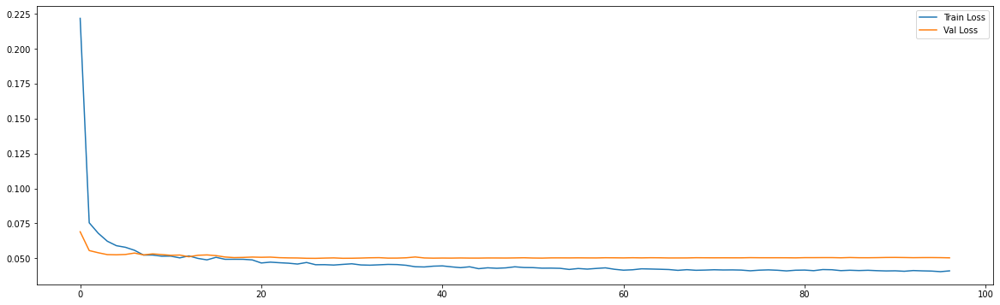

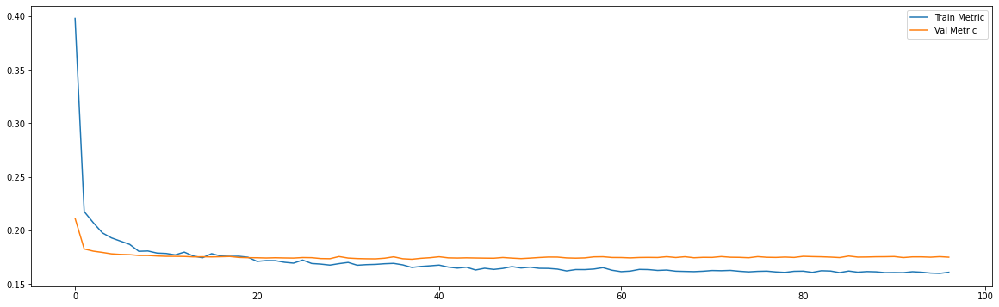

Epoch 00107: early stopping
============================model:4===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0381 - mae: 0.1554
loss and metric train data [0.03810728341341019, 0.15539950132369995]
7/7 [==============================] - 0s 3ms/step - loss: 0.0496 - mae: 0.1693
loss and metric val data [0.04960364103317261, 0.16931703686714172]
7/7 [==============================] - 0s 3ms/step - loss: 0.0846 - mae: 0.2226
loss and metric test data [0.08462685346603394, 0.2226041704416275]


'neurons': 30, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




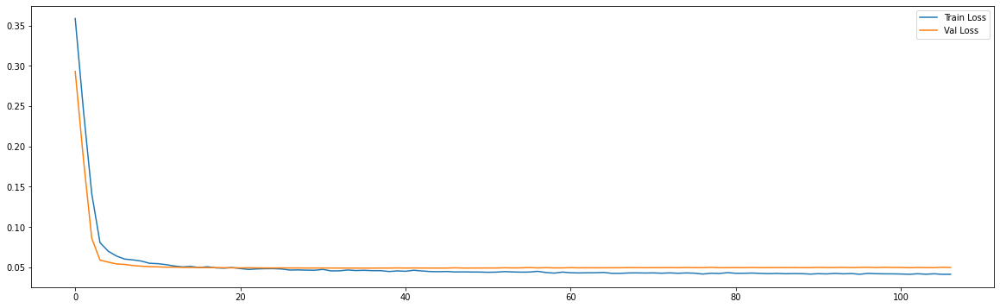

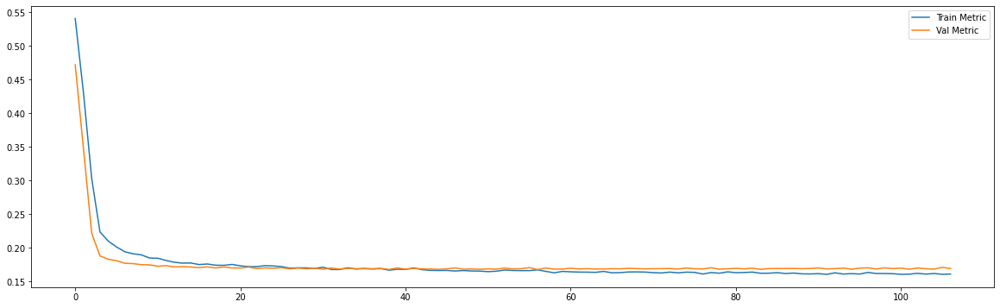

Epoch 00151: early stopping
============================model:5===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0379 - mae: 0.1549
loss and metric train data [0.03788496181368828, 0.1549227386713028]
7/7 [==============================] - 0s 4ms/step - loss: 0.0487 - mae: 0.1678
loss and metric val data [0.048650506883859634, 0.16784845292568207]
7/7 [==============================] - 0s 4ms/step - loss: 0.0828 - mae: 0.2178
loss and metric test data [0.08278118818998337, 0.21781869232654572]


'neurons': 30, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




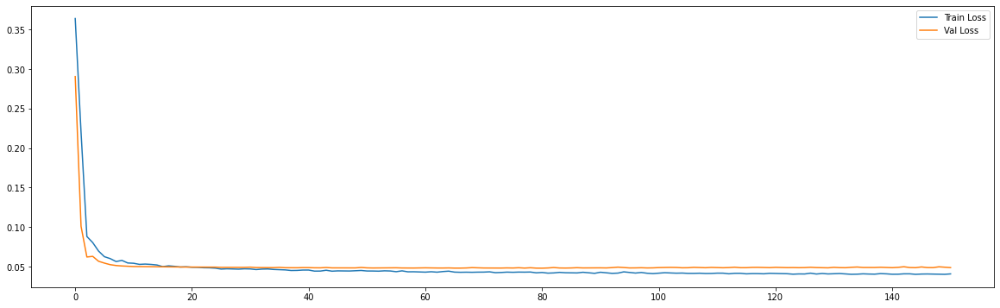

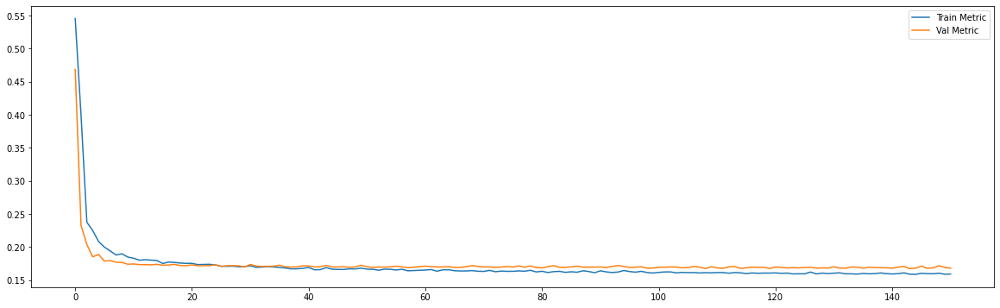

Epoch 00161: early stopping
============================model:6===========================
32/32 [==============================] - 0s 4ms/step - loss: 0.0424 - mae: 0.1654
loss and metric train data [0.04240971431136131, 0.16540823876857758]
3/3 [==============================] - 0s 4ms/step - loss: 0.0734 - mae: 0.2069
loss and metric val data [0.0733768418431282, 0.2069348841905594]
3/3 [==============================] - 0s 4ms/step - loss: 0.1492 - mae: 0.3050
loss and metric test data [0.14917288720607758, 0.3049939274787903]


'neurons': 30, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




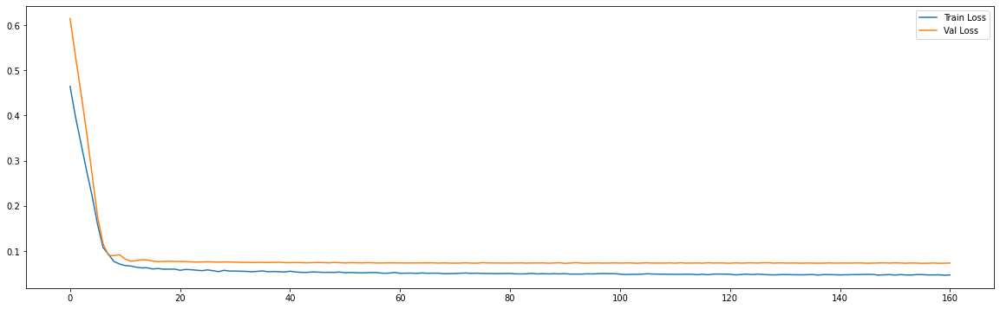

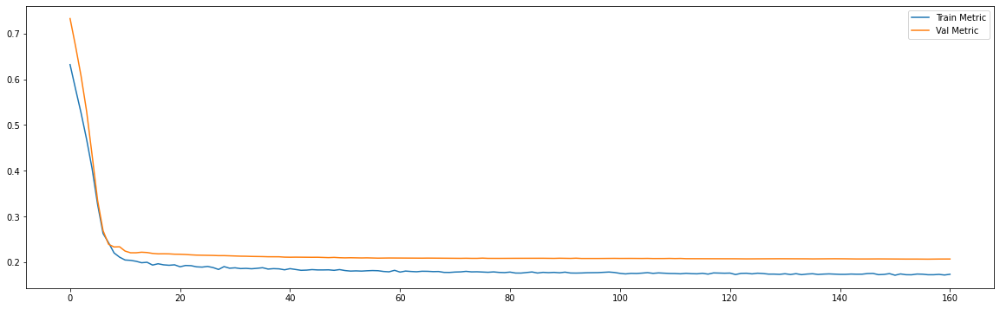

Epoch 00245: early stopping
============================model:7===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0422 - mae: 0.1652
loss and metric train data [0.04223699867725372, 0.16523480415344238]
3/3 [==============================] - 0s 5ms/step - loss: 0.0708 - mae: 0.2043
loss and metric val data [0.07082534581422806, 0.20429269969463348]
3/3 [==============================] - 0s 6ms/step - loss: 0.1454 - mae: 0.2985
loss and metric test data [0.1454087793827057, 0.2985333204269409]


'neurons': 30, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




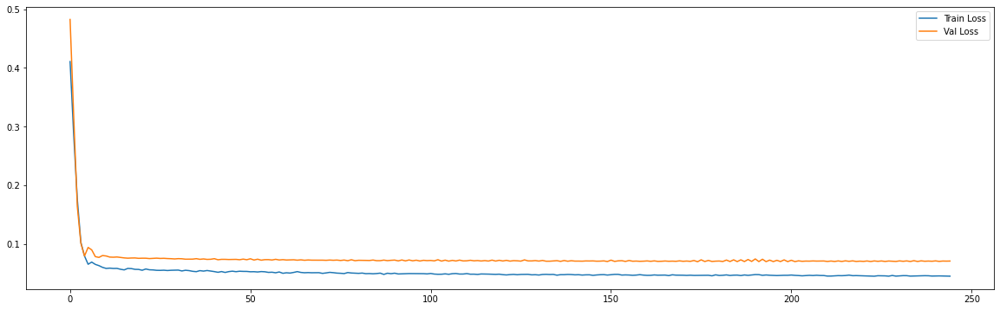

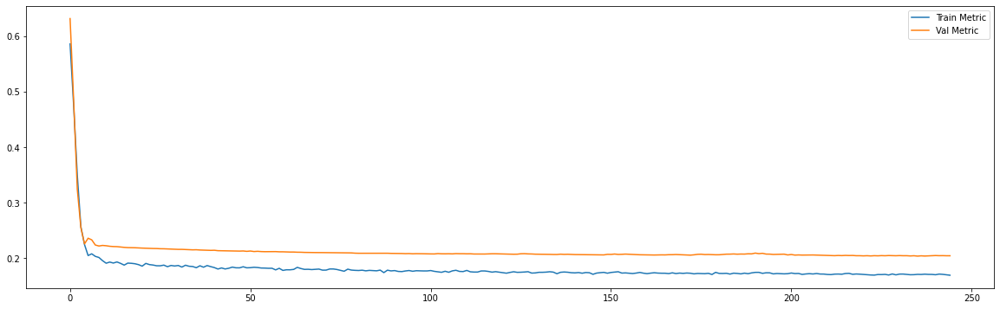

Epoch 00187: early stopping
============================model:8===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0390 - mae: 0.1565
loss and metric train data [0.03896505758166313, 0.15653465688228607]
9/9 [==============================] - 0s 2ms/step - loss: 0.0533 - mae: 0.1811
loss and metric val data [0.05328233912587166, 0.18112000823020935]
9/9 [==============================] - 0s 2ms/step - loss: 0.0635 - mae: 0.1858
loss and metric test data [0.06353916227817535, 0.1857791244983673]


'neurons': 30, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




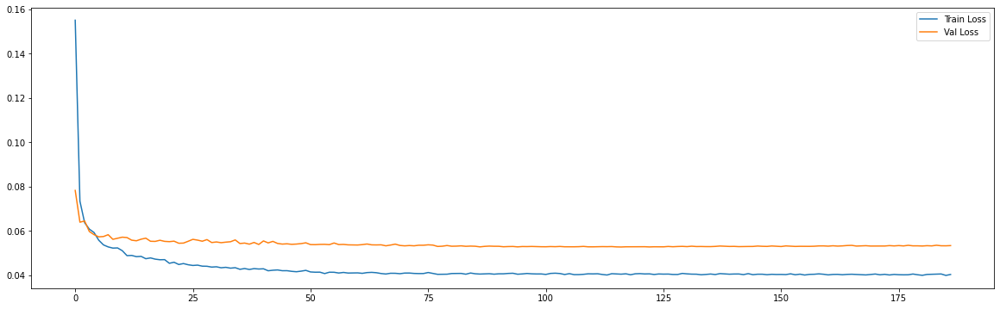

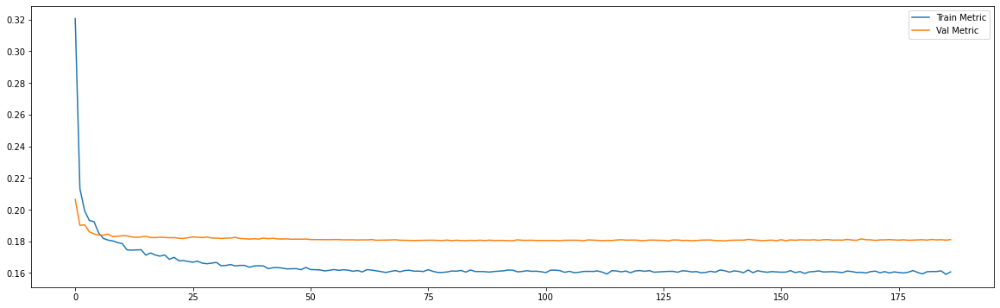

Epoch 00136: early stopping
============================model:9===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0391 - mae: 0.1567
loss and metric train data [0.03914828971028328, 0.15668021142482758]
9/9 [==============================] - 0s 3ms/step - loss: 0.0534 - mae: 0.1804
loss and metric val data [0.05341525003314018, 0.1803833246231079]
9/9 [==============================] - 0s 3ms/step - loss: 0.0643 - mae: 0.1858
loss and metric test data [0.06433320045471191, 0.18580496311187744]


'neurons': 30, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




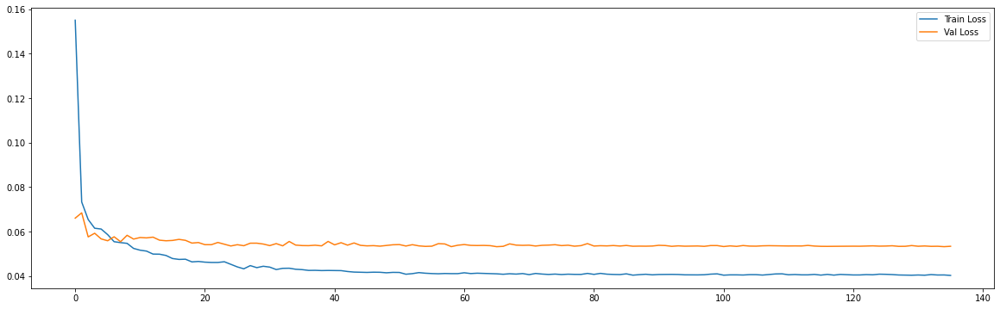

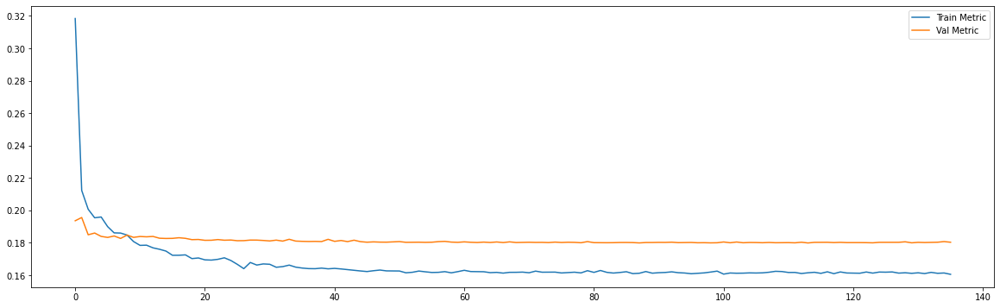

Epoch 00097: early stopping
============================model:10===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0387 - mae: 0.1569
loss and metric train data [0.03872781619429588, 0.15691465139389038]
8/8 [==============================] - 0s 3ms/step - loss: 0.0506 - mae: 0.1747
loss and metric val data [0.0506279319524765, 0.17471370100975037]
8/8 [==============================] - 0s 2ms/step - loss: 0.0695 - mae: 0.1960
loss and metric test data [0.06949987262487411, 0.19604073464870453]


'neurons': 30, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




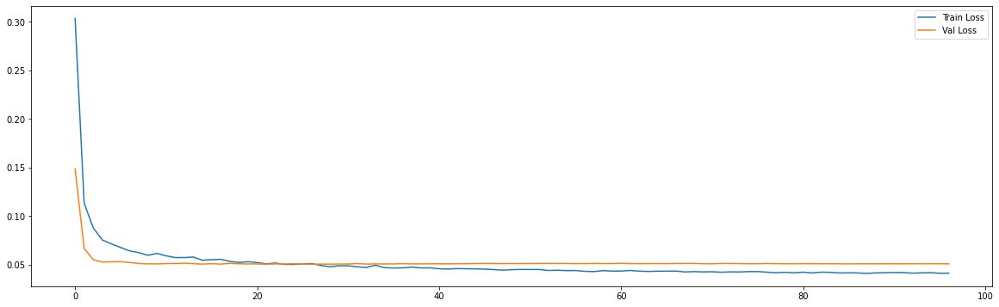

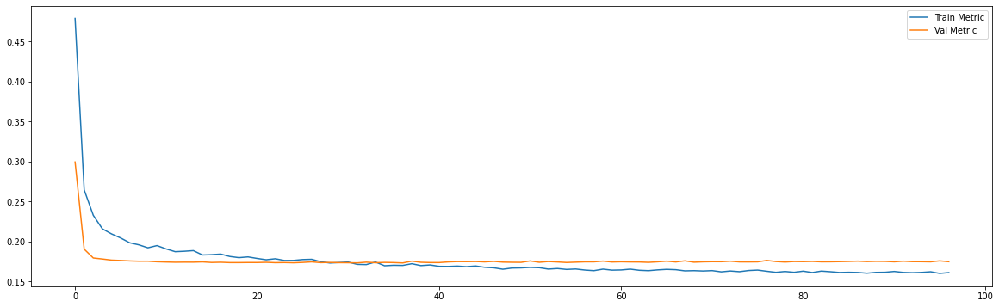

Epoch 00124: early stopping
============================model:11===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0385 - mae: 0.1564
loss and metric train data [0.03853069990873337, 0.1563969850540161]
8/8 [==============================] - 0s 4ms/step - loss: 0.0503 - mae: 0.1750
loss and metric val data [0.050306014716625214, 0.17496861517429352]
8/8 [==============================] - 0s 3ms/step - loss: 0.0696 - mae: 0.1975
loss and metric test data [0.06962952017784119, 0.19749480485916138]


'neurons': 30, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




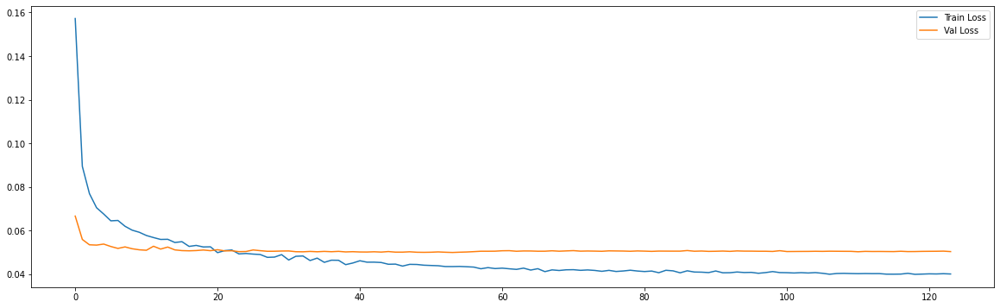

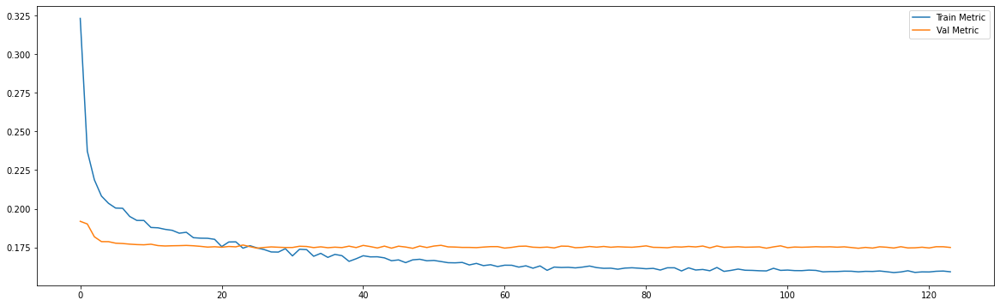

Epoch 00123: early stopping
============================model:12===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0381 - mae: 0.1560
loss and metric train data [0.03809461370110512, 0.1559859663248062]
7/7 [==============================] - 0s 3ms/step - loss: 0.0492 - mae: 0.1691
loss and metric val data [0.049177806824445724, 0.16912059485912323]
7/7 [==============================] - 0s 3ms/step - loss: 0.0837 - mae: 0.2198
loss and metric test data [0.08365192264318466, 0.21978405117988586]


'neurons': 30, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




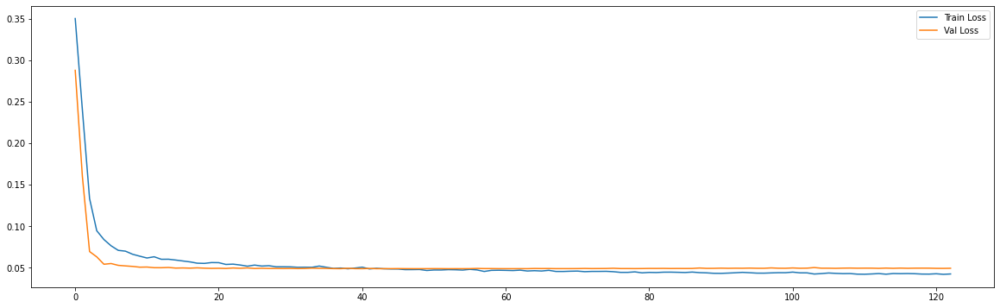

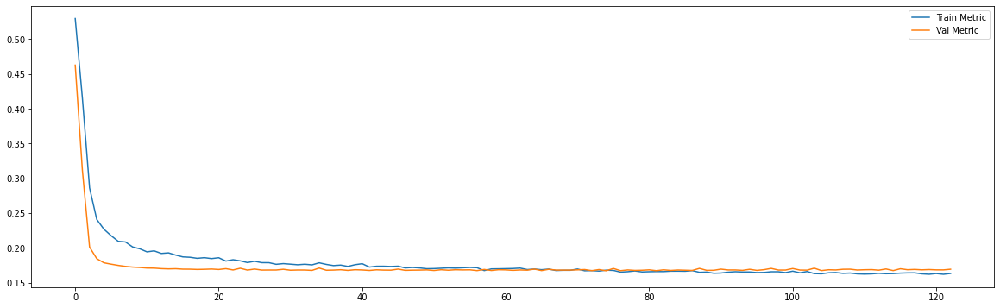

Epoch 00160: early stopping
============================model:13===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0381 - mae: 0.1566
loss and metric train data [0.038105111569166183, 0.15663567185401917]
7/7 [==============================] - 0s 5ms/step - loss: 0.0489 - mae: 0.1697
loss and metric val data [0.04892038181424141, 0.16971834003925323]
7/7 [==============================] - 0s 5ms/step - loss: 0.0829 - mae: 0.2175
loss and metric test data [0.0828845426440239, 0.2174636721611023]


'neurons': 30, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




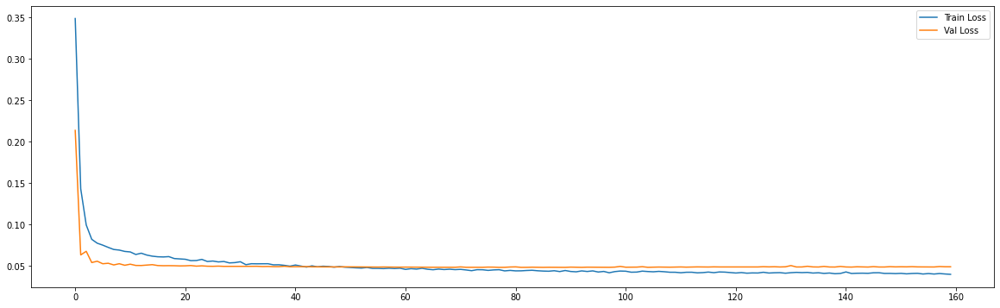

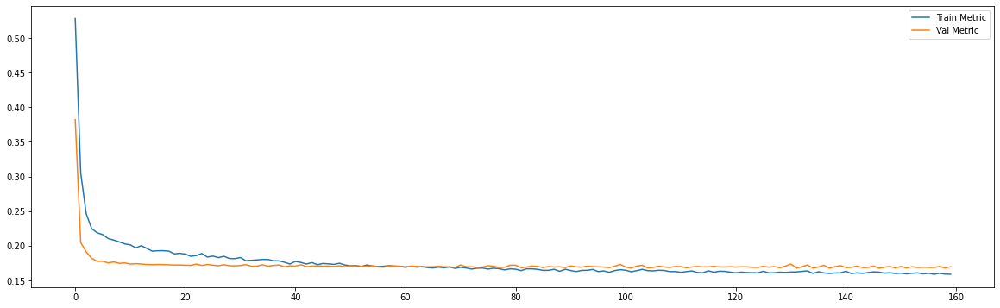

============================model:14===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0416 - mae: 0.1645
loss and metric train data [0.0415678396821022, 0.16451942920684814]
3/3 [==============================] - 0s 6ms/step - loss: 0.0697 - mae: 0.2049
loss and metric val data [0.06969072669744492, 0.20494085550308228]
3/3 [==============================] - 0s 4ms/step - loss: 0.1504 - mae: 0.3023
loss and metric test data [0.1503576785326004, 0.30228811502456665]


'neurons': 30, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




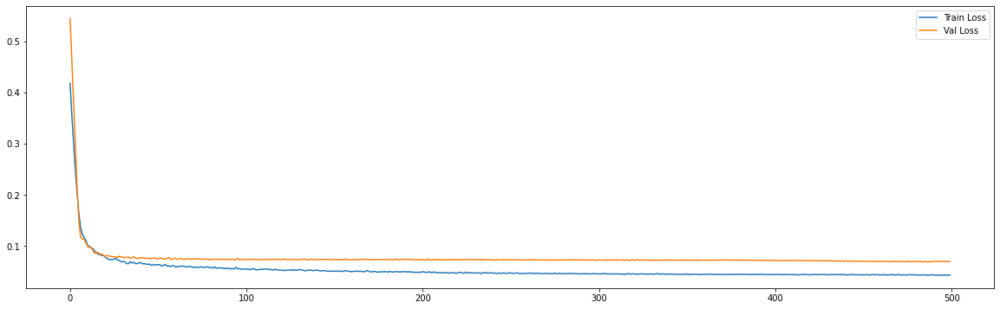

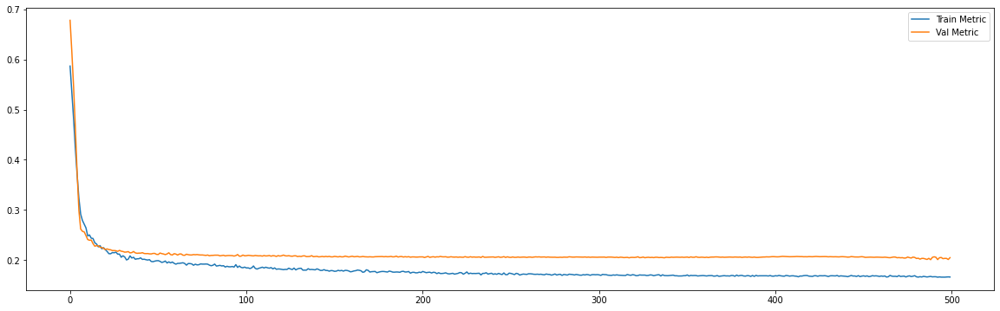

Epoch 00160: early stopping
============================model:15===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0422 - mae: 0.1654
loss and metric train data [0.04217010363936424, 0.1654321849346161]
3/3 [==============================] - 0s 6ms/step - loss: 0.0712 - mae: 0.2045
loss and metric val data [0.07123098522424698, 0.20447243750095367]
3/3 [==============================] - 0s 6ms/step - loss: 0.1445 - mae: 0.2977
loss and metric test data [0.1444757729768753, 0.29766544699668884]


'neurons': 30, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




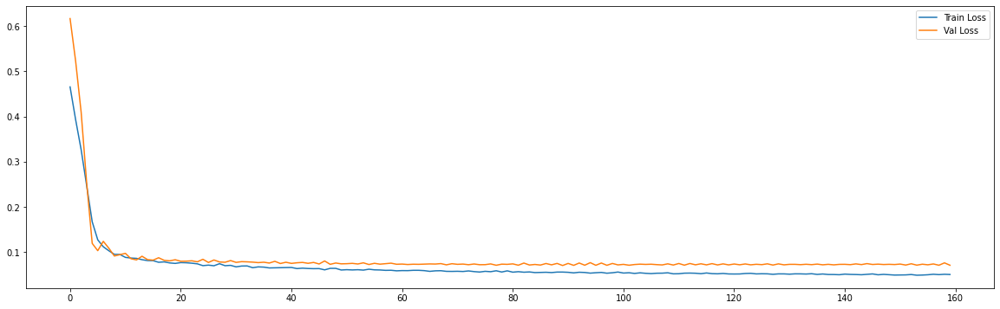

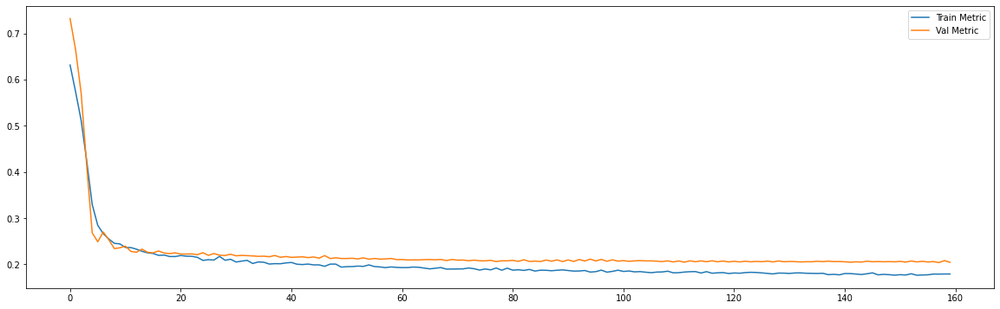

Epoch 00141: early stopping
============================model:16===========================
45/45 [==============================] - 0s 2ms/step - loss: 0.0394 - mae: 0.1578
loss and metric train data [0.039388854056596756, 0.15776009857654572]
9/9 [==============================] - 0s 2ms/step - loss: 0.0536 - mae: 0.1807
loss and metric val data [0.053636595606803894, 0.18072253465652466]
9/9 [==============================] - 0s 3ms/step - loss: 0.0643 - mae: 0.1850
loss and metric test data [0.06430526822805405, 0.18499673902988434]


'neurons': 50, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




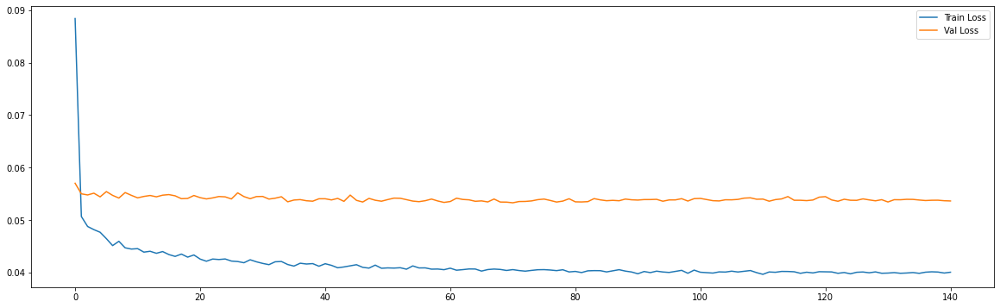

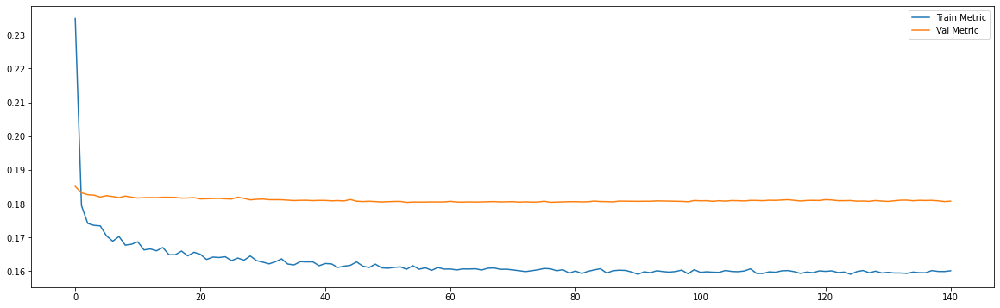

Epoch 00117: early stopping
============================model:17===========================
45/45 [==============================] - 0s 4ms/step - loss: 0.0393 - mae: 0.1574
loss and metric train data [0.039252061396837234, 0.15736563503742218]
9/9 [==============================] - 0s 3ms/step - loss: 0.0536 - mae: 0.1805
loss and metric val data [0.053574249148368835, 0.18054114282131195]
9/9 [==============================] - 0s 3ms/step - loss: 0.0638 - mae: 0.1842
loss and metric test data [0.06375394761562347, 0.18424811959266663]


'neurons': 50, 'dropout': 0.2, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




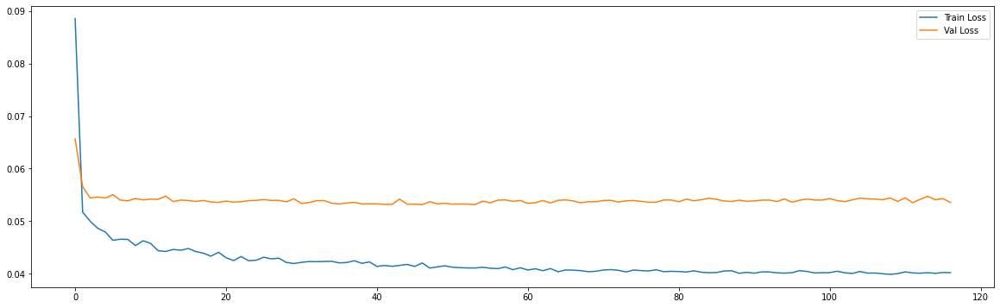

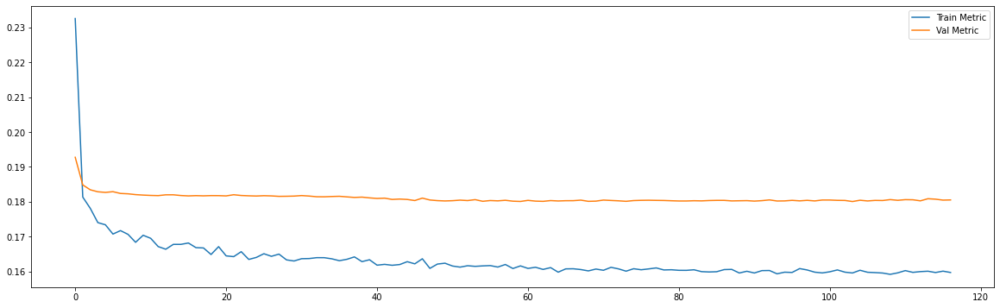

Epoch 00097: early stopping
============================model:18===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0387 - mae: 0.1563
loss and metric train data [0.03870435059070587, 0.15631769597530365]
8/8 [==============================] - 0s 2ms/step - loss: 0.0506 - mae: 0.1737
loss and metric val data [0.05061161518096924, 0.1736794412136078]
8/8 [==============================] - 0s 2ms/step - loss: 0.0700 - mae: 0.1970
loss and metric test data [0.07004458457231522, 0.1970488727092743]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




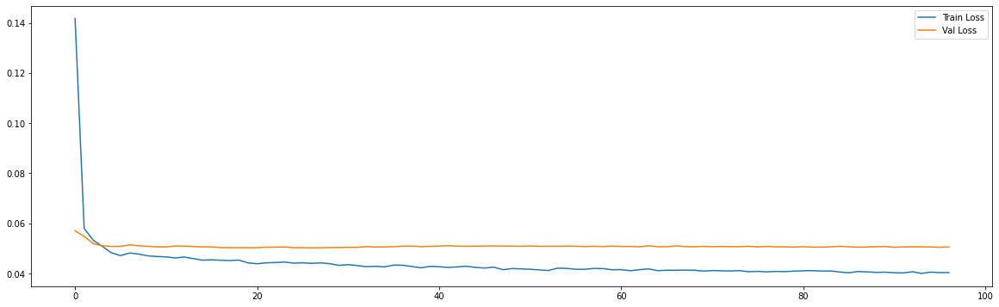

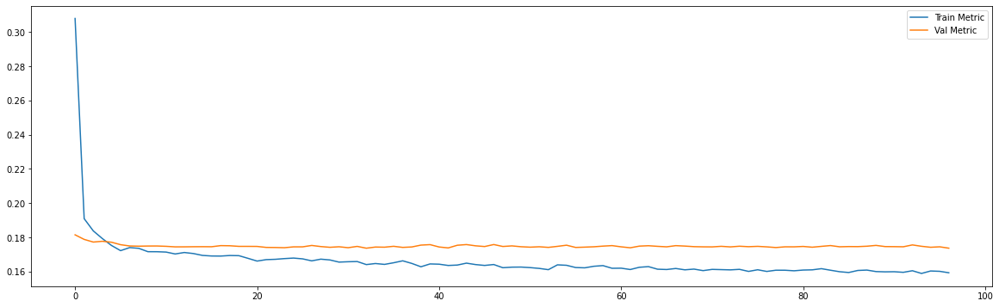

Epoch 00221: early stopping
============================model:19===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0378 - mae: 0.1536
loss and metric train data [0.037819068878889084, 0.15362156927585602]
8/8 [==============================] - 0s 4ms/step - loss: 0.0513 - mae: 0.1749
loss and metric val data [0.05133654177188873, 0.17489740252494812]
8/8 [==============================] - 0s 3ms/step - loss: 0.0677 - mae: 0.1933
loss and metric test data [0.06768126785755157, 0.19325390458106995]


'neurons': 50, 'dropout': 0.2, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




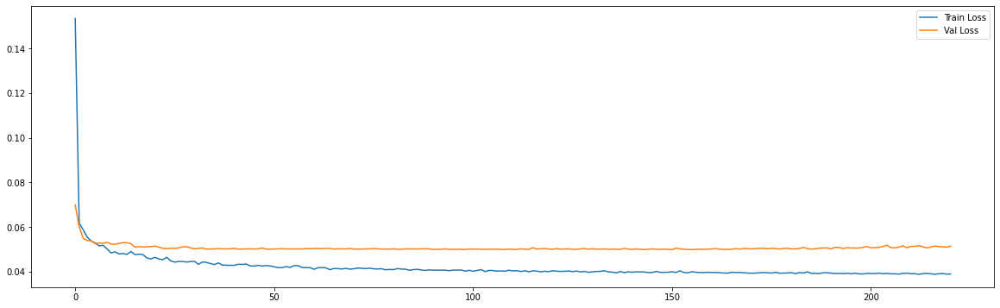

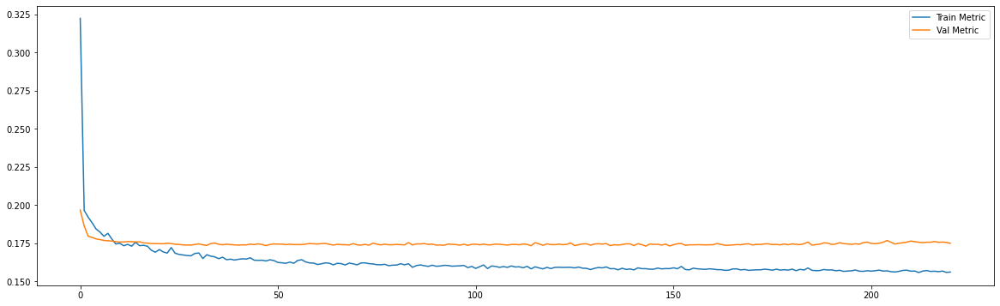

Epoch 00108: early stopping
============================model:20===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0382 - mae: 0.1557
loss and metric train data [0.03822903335094452, 0.15567754209041595]
7/7 [==============================] - 0s 3ms/step - loss: 0.0497 - mae: 0.1704
loss and metric val data [0.04970811679959297, 0.1704326570034027]
7/7 [==============================] - 0s 3ms/step - loss: 0.0842 - mae: 0.2222
loss and metric test data [0.08417947590351105, 0.2222101241350174]


'neurons': 50, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




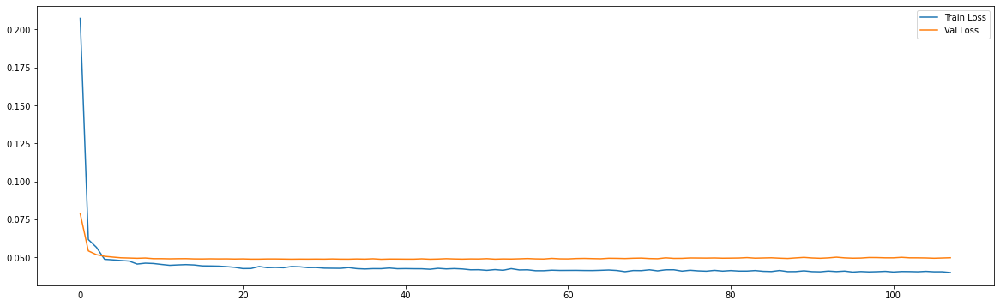

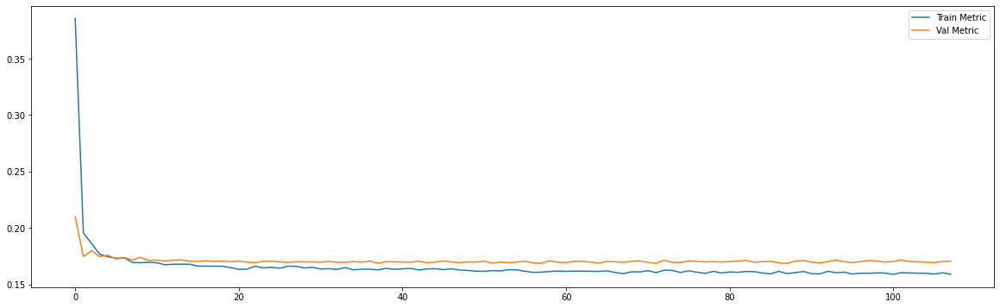

Epoch 00108: early stopping
============================model:21===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0381 - mae: 0.1553
loss and metric train data [0.03805190324783325, 0.15534591674804688]
7/7 [==============================] - 0s 4ms/step - loss: 0.0492 - mae: 0.1701
loss and metric val data [0.049227241426706314, 0.1700834035873413]
7/7 [==============================] - 0s 4ms/step - loss: 0.0824 - mae: 0.2186
loss and metric test data [0.08239554613828659, 0.21862348914146423]


'neurons': 50, 'dropout': 0.2, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




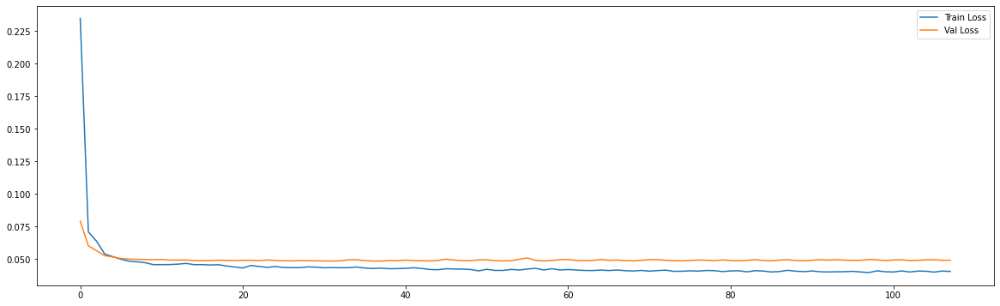

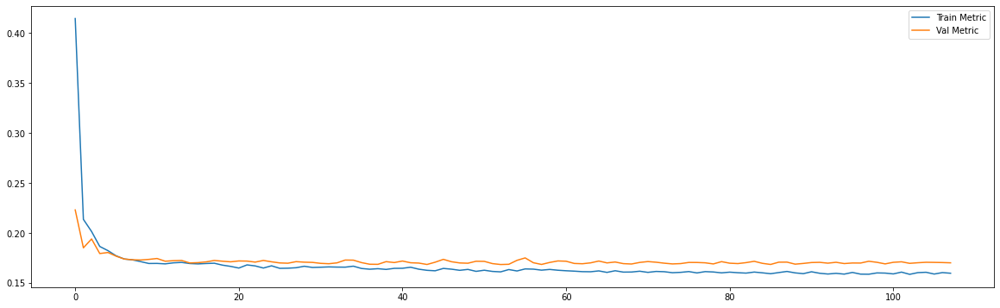

Epoch 00128: early stopping
============================model:22===========================
32/32 [==============================] - 0s 5ms/step - loss: 0.0425 - mae: 0.1659
loss and metric train data [0.04250812903046608, 0.16587364673614502]
3/3 [==============================] - 0s 4ms/step - loss: 0.0726 - mae: 0.2071
loss and metric val data [0.07263810187578201, 0.20705685019493103]
3/3 [==============================] - 0s 3ms/step - loss: 0.1505 - mae: 0.3086
loss and metric test data [0.15050622820854187, 0.3086162209510803]


'neurons': 50, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




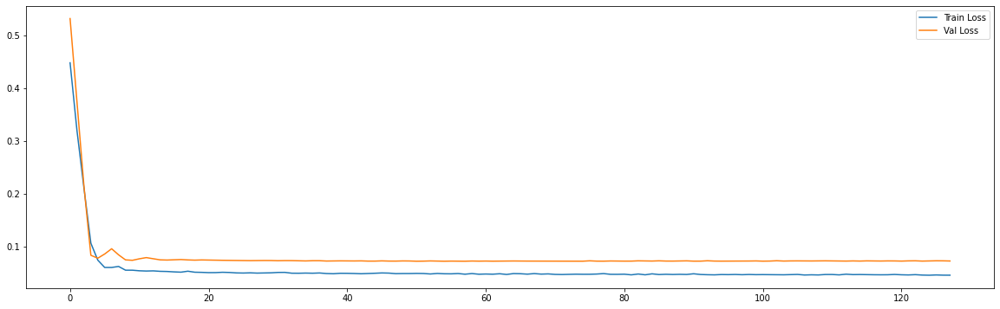

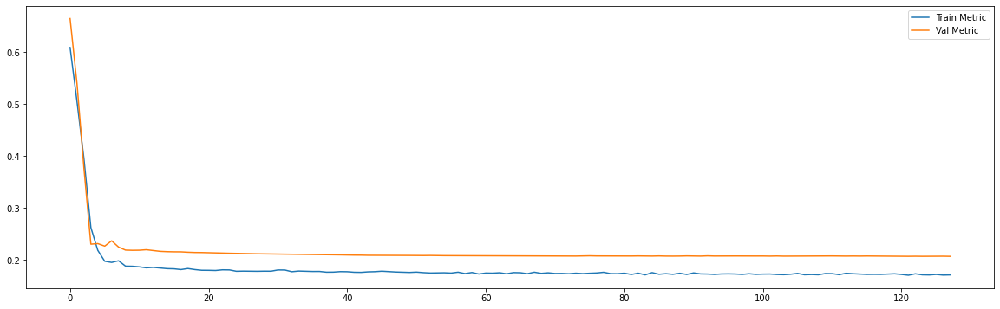

Epoch 00319: early stopping
============================model:23===========================
32/32 [==============================] - 0s 8ms/step - loss: 0.0423 - mae: 0.1660
loss and metric train data [0.04227106645703316, 0.1659863293170929]
3/3 [==============================] - 0s 6ms/step - loss: 0.0695 - mae: 0.2043
loss and metric val data [0.06946241110563278, 0.20434802770614624]
3/3 [==============================] - 0s 7ms/step - loss: 0.1462 - mae: 0.2990
loss and metric test data [0.1462412029504776, 0.2990129292011261]


'neurons': 50, 'dropout': 0.2, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




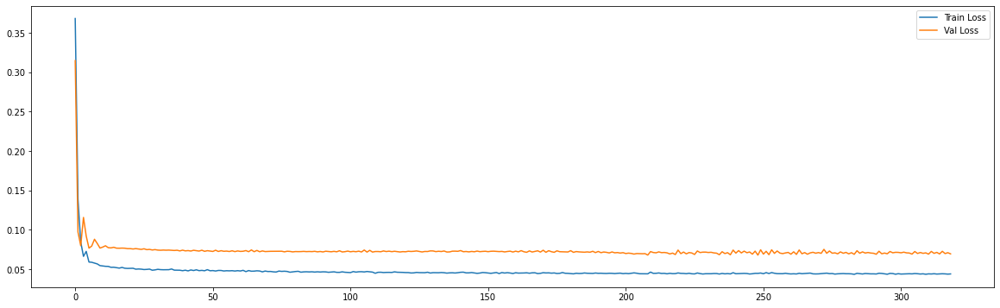

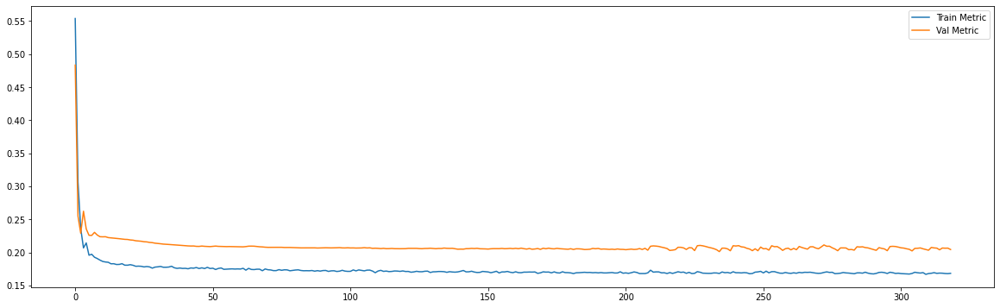

Epoch 00286: early stopping
============================model:24===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0393 - mae: 0.1559
loss and metric train data [0.03931539133191109, 0.15587449073791504]
9/9 [==============================] - 0s 2ms/step - loss: 0.0692 - mae: 0.2001
loss and metric val data [0.06919980049133301, 0.20010574162006378]
9/9 [==============================] - 0s 2ms/step - loss: 0.0914 - mae: 0.2128
loss and metric test data [0.09136005491018295, 0.21280677616596222]


'neurons': 50, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'learning_rate':0.001, 'hidden_layers':1




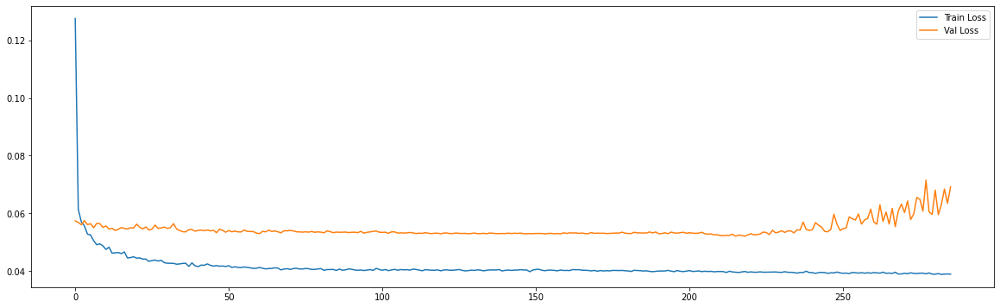

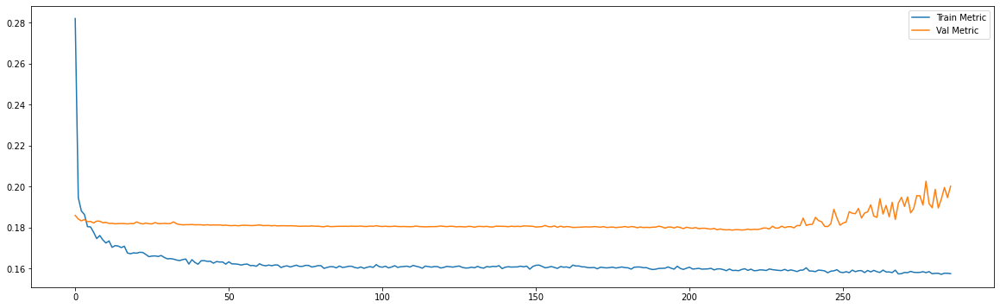

Epoch 00120: early stopping
============================model:25===========================
45/45 [==============================] - 0s 3ms/step - loss: 0.0395 - mae: 0.1573
loss and metric train data [0.039533842355012894, 0.1573019176721573]
9/9 [==============================] - 0s 3ms/step - loss: 0.0539 - mae: 0.1799
loss and metric val data [0.0539102703332901, 0.17994627356529236]
9/9 [==============================] - 0s 3ms/step - loss: 0.0642 - mae: 0.1847
loss and metric test data [0.06423686444759369, 0.18470527231693268]


'neurons': 50, 'dropout': 0.4, 'time_steps': 30, 'batch_size':30, 'hidden_layers':2




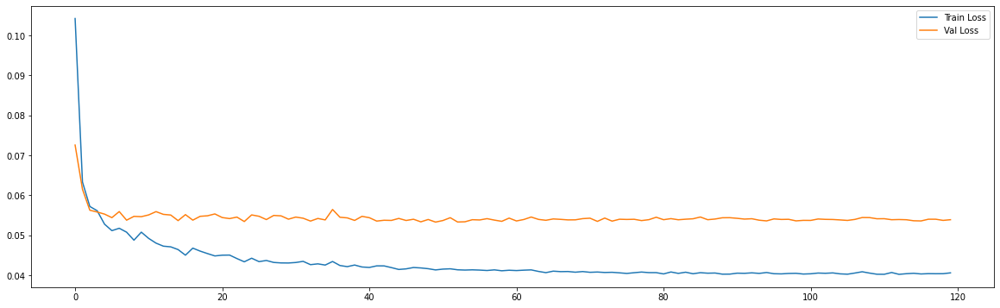

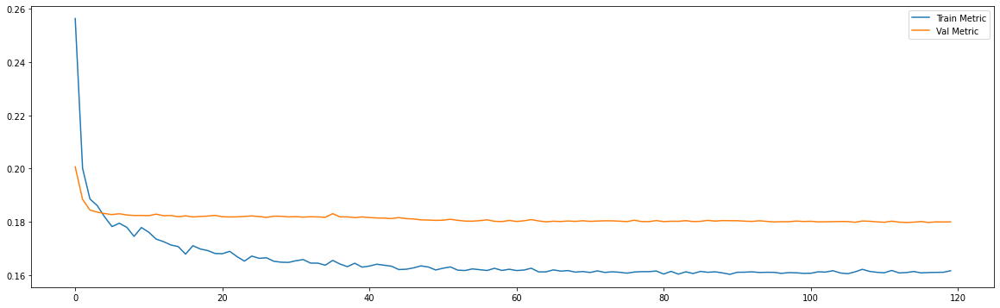

Epoch 00093: early stopping
============================model:26===========================
43/43 [==============================] - 0s 3ms/step - loss: 0.0387 - mae: 0.1568
loss and metric train data [0.038721054792404175, 0.15680661797523499]
8/8 [==============================] - 0s 3ms/step - loss: 0.0507 - mae: 0.1747
loss and metric val data [0.050685375928878784, 0.17472393810749054]
8/8 [==============================] - 0s 2ms/step - loss: 0.0698 - mae: 0.1973
loss and metric test data [0.06979111582040787, 0.1972787082195282]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'learning_rate':0.001, 'hidden_layers':1




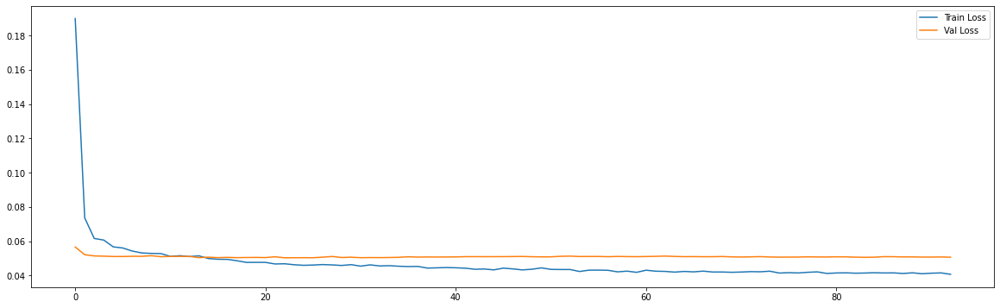

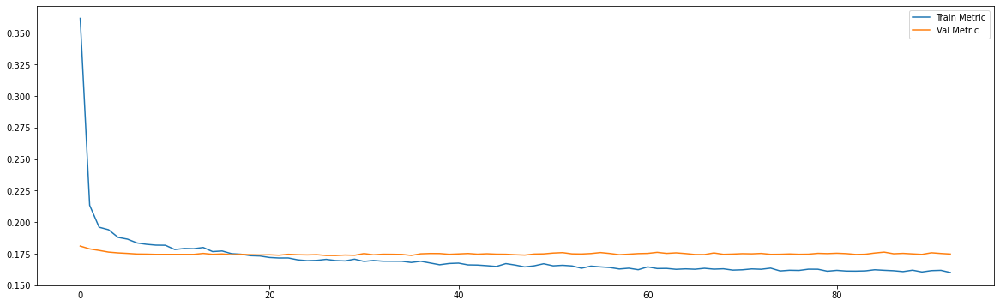

Epoch 00198: early stopping
============================model:27===========================
43/43 [==============================] - 0s 4ms/step - loss: 0.0383 - mae: 0.1555
loss and metric train data [0.03833119198679924, 0.15552832186222076]
8/8 [==============================] - 0s 4ms/step - loss: 0.0502 - mae: 0.1744
loss and metric val data [0.05015300214290619, 0.17436976730823517]
8/8 [==============================] - 0s 3ms/step - loss: 0.0691 - mae: 0.1952
loss and metric test data [0.06909392774105072, 0.19517193734645844]


'neurons': 50, 'dropout': 0.4, 'time_steps': 60, 'batch_size':60, 'hidden_layers':2




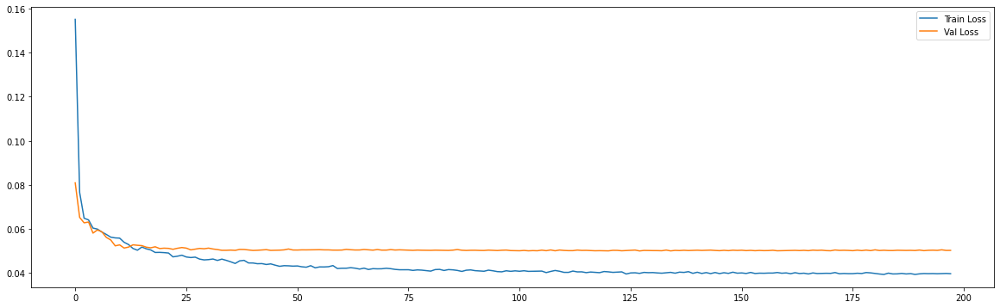

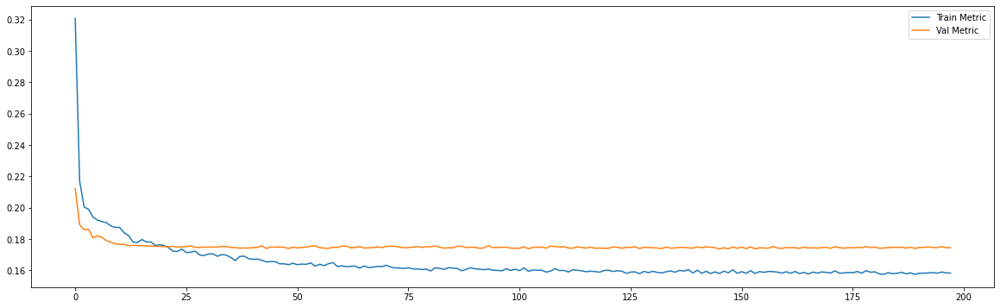

Epoch 00095: early stopping
============================model:28===========================
39/39 [==============================] - 0s 3ms/step - loss: 0.0382 - mae: 0.1559
loss and metric train data [0.03819235786795616, 0.1558542400598526]
7/7 [==============================] - 0s 3ms/step - loss: 0.0495 - mae: 0.1698
loss and metric val data [0.04950380325317383, 0.16983367502689362]
7/7 [==============================] - 0s 3ms/step - loss: 0.0849 - mae: 0.2228
loss and metric test data [0.08488155156373978, 0.2227998524904251]


'neurons': 50, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'learning_rate':0.001, 'hidden_layers':1




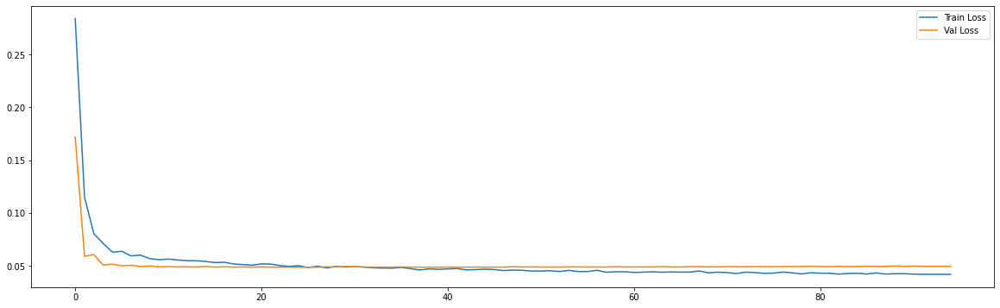

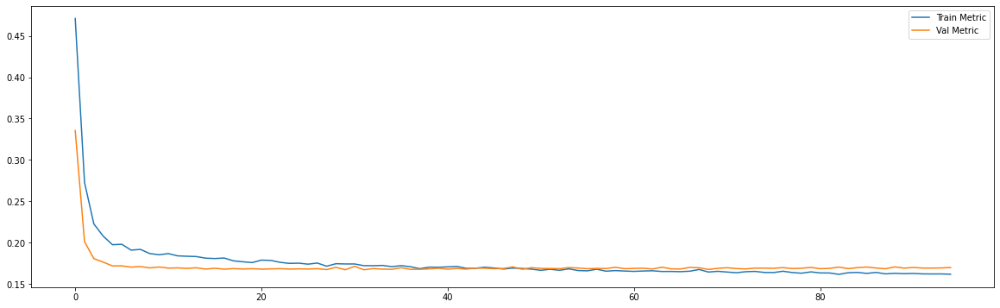

Epoch 00123: early stopping
============================model:29===========================
39/39 [==============================] - 0s 5ms/step - loss: 0.0383 - mae: 0.1557
loss and metric train data [0.038263238966464996, 0.15568305552005768]
7/7 [==============================] - 0s 4ms/step - loss: 0.0503 - mae: 0.1724
loss and metric val data [0.05029623955488205, 0.17238444089889526]
7/7 [==============================] - 0s 4ms/step - loss: 0.0831 - mae: 0.2201
loss and metric test data [0.08310117572546005, 0.22007451951503754]


'neurons': 50, 'dropout': 0.4, 'time_steps': 120, 'batch_size':120, 'hidden_layers':2




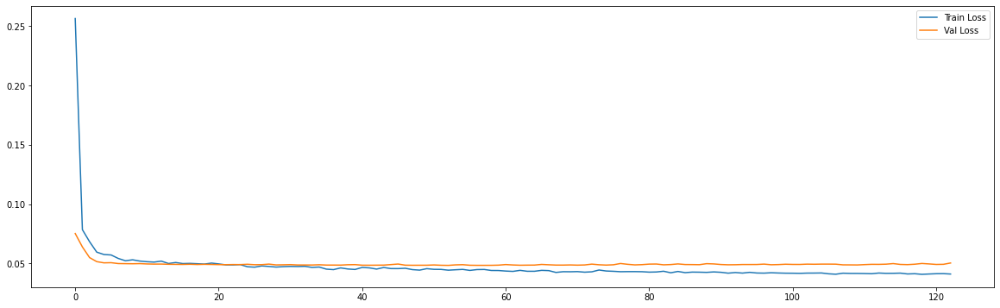

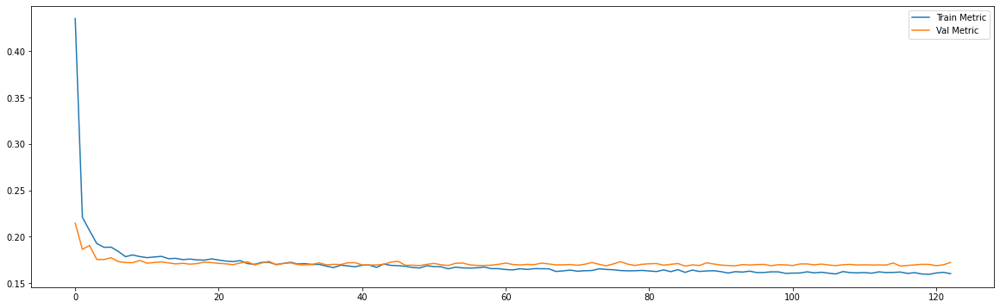

Epoch 00143: early stopping
============================model:30===========================
32/32 [==============================] - 0s 4ms/step - loss: 0.0424 - mae: 0.1654
loss and metric train data [0.04235037416219711, 0.16542640328407288]
3/3 [==============================] - 0s 4ms/step - loss: 0.0730 - mae: 0.2070
loss and metric val data [0.07303720712661743, 0.20701134204864502]
3/3 [==============================] - 0s 7ms/step - loss: 0.1497 - mae: 0.3064
loss and metric test data [0.149653822183609, 0.30641061067581177]


'neurons': 50, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'learning_rate':0.001, 'hidden_layers':1




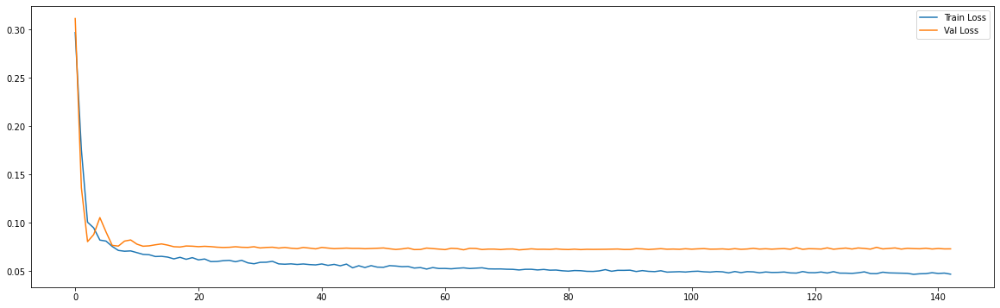

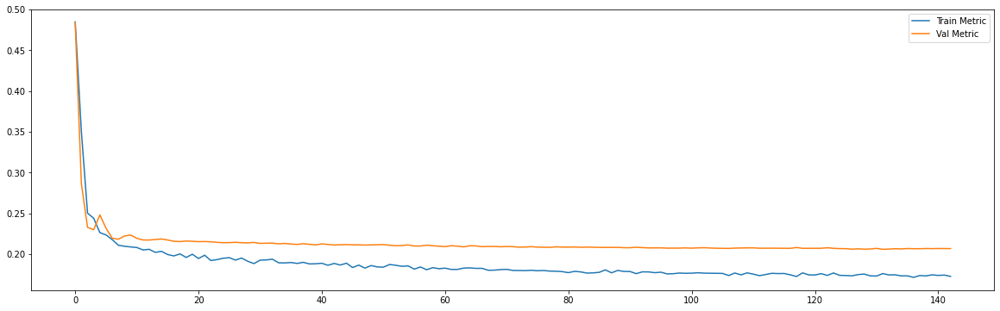

Epoch 00170: early stopping
============================model:31===========================
32/32 [==============================] - 0s 7ms/step - loss: 0.0423 - mae: 0.1657
loss and metric train data [0.04232461750507355, 0.1656680554151535]
3/3 [==============================] - 0s 6ms/step - loss: 0.0729 - mae: 0.2069
loss and metric val data [0.07288535684347153, 0.20690688490867615]
3/3 [==============================] - 0s 5ms/step - loss: 0.1495 - mae: 0.3019
loss and metric test data [0.1494823545217514, 0.3019479215145111]


'neurons': 50, 'dropout': 0.4, 'time_steps': 240, 'batch_size':240, 'hidden_layers':2




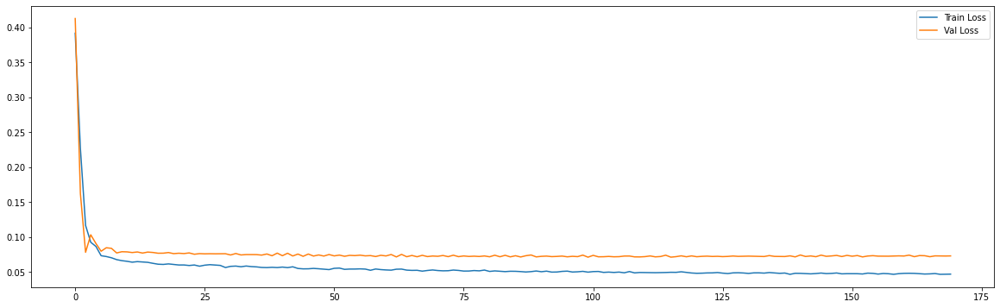

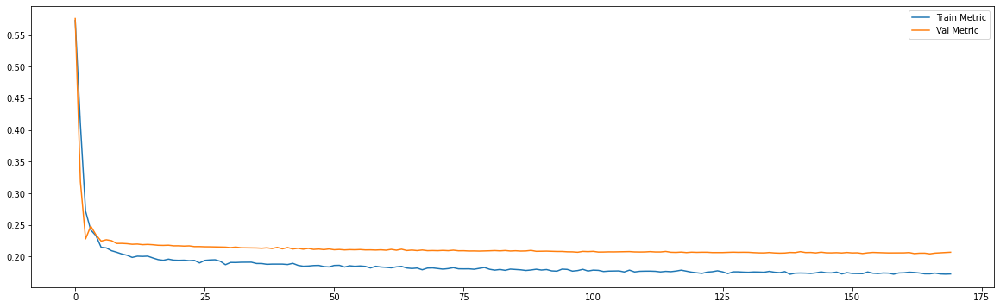

In [27]:
future_steps = 5
n_features = 1

neurons_list = [30,50]
dropout_list = [0.2,0.4]
time_steps_list = [30,60,120,240]
lr_list = [0.001]
models = {}
i=0
for neurons in neurons_list:
  for dropout in dropout_list:
    for time_steps in time_steps_list:
      for lr in lr_list:
        x_train,x_test,x_val,y_train,y_val,y_test = Regressor(future_steps = future_steps,time_steps = time_steps,n_features = n_features,df_train = df_train_norm,df_val = df_val_norm,df_test = df_test_norm)

        models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':time_steps, 'learning_rate':lr}
        models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'learning_rate':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,time_steps,lr,1)

        # The LSTM architecture
        models[i]['model'] = Sequential()
        models[i]['model'].add(LSTM(units=neurons, return_sequences=False,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(Dense(units=future_steps))

        #Compiling the LSTM
        adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
        models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

        # early stop
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 70)

        #Fitting to traning set
        history = models[i]['model'].fit(x_train, y_train, validation_data = (x_val,y_val), epochs = 500, batch_size = time_steps, verbose = 0, shuffle = False, callbacks = [es])

        print('============================model:{}==========================='.format(i))

          
        print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
        print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
        print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
        print('\n')

        print(models[i]['resumo'])
        print('\n')

        plt.figure(figsize=(20,6))
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.legend(['Train Loss', 'Val Loss'])

        plt.figure(figsize=(20,6))
        plt.plot(history.history['mae'])
        plt.plot(history.history['val_mae'])
        plt.legend(['Train Metric', 'Val Metric'])
        plt.show()

        i+=1


        models[i] = {'neurons':neurons,'dropout':dropout,'time_steps': time_steps, 'batch_size':time_steps}
        models[i]['resumo'] = "'neurons': {}, 'dropout': {}, 'time_steps': {}, 'batch_size':{}, 'hidden_layers':{}".format(neurons,dropout,time_steps,time_steps,2)

        # The LSTM architecture
        models[i]['model'] = Sequential()
        models[i]['model'].add(LSTM(units=neurons, return_sequences=True,input_shape=(time_steps, n_features))) # return_sequences=True next layer is LSTM
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(LSTM(units=neurons, return_sequences=False))
        models[i]['model'].add(Dropout(dropout))
        models[i]['model'].add(Dense(units=future_steps))

        #Compiling the LSTM
        adam = optimizers.Adam(lr = lr, beta_1 = 0.9, beta_2 = 0.999, decay = 0.0)
        models[i]['model'].compile(optimizer = adam, loss = 'mse', metrics=['mae'])

         # early stop
        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 70)

        #Fitting to traning set
        history = models[i]['model'].fit(x_train, y_train, validation_data = (x_val,y_val), epochs = 500, batch_size = time_steps, verbose = 0, shuffle = False, callbacks = [es])

        print('============================model:{}==========================='.format(i))

          
        print('loss and metric train data',models[i]['model'].evaluate(x_train,y_train))
        print('loss and metric val data',models[i]['model'].evaluate(x_val,y_val))
        print('loss and metric test data',models[i]['model'].evaluate(x_test,y_test))
        print('\n')

        print(models[i]['resumo'])
        print('\n')

        plt.figure(figsize=(20,6))
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.legend(['Train Loss', 'Val Loss'])

        plt.figure(figsize=(20,6))
        plt.plot(history.history['mae'])
        plt.plot(history.history['val_mae'])
        plt.legend(['Train Metric', 'Val Metric'])
        plt.show()

        i+=1